In [1]:
# Loading libraries
%matplotlib inline
import os
import os.path
from netCDF4 import Dataset
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc 
import fnmatch
from cycler import cycler
import pandas as pd
from pandas import read_csv, to_datetime, DataFrame
import datetime
import time
import matplotlib.dates as mdates

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from mpl_toolkits.basemap import Basemap # Basemap pour les cartes

In [2]:
# LOADING GRID FILE AND VARIABLES
!pwd
grid_file = '../DATA/grille.nc' 
print 'file exist:', os.path.isfile(grid_file)

f = Dataset(grid_file) # open netcdf
# extracting variables
lon_t = f.variables['longitude_t'][:] # extracting lon data
lat_t = f.variables['latitude_t'][:] # extracting lat data
depth_t = f.variables['depth_t'][:]
bathy = f.variables['h_w'][:]
print 'Bathy :', np.shape(bathy), 'max :', np.max(bathy), 'min :', np.min(bathy)

f.close()

new_bath = np.ma.masked_where(bathy<200, bathy)
region_list = ['NWE', 'SWE', 'ION', 'LEV'] #

/home/dosa/MON_ENV_PYTHON/INTERANNUAL_VARIAB
file exist: True
Bathy : (160, 394) max : 5054.49 min : 20.5226


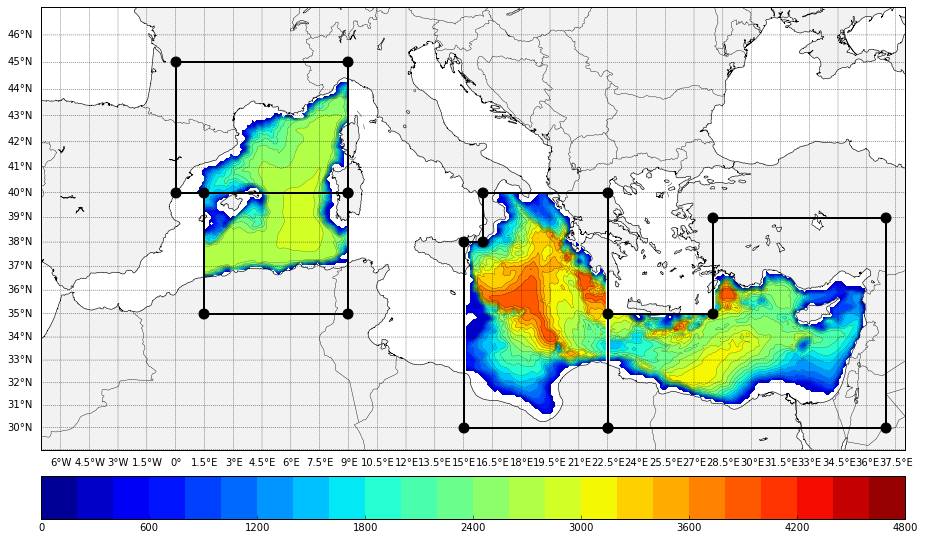

In [3]:
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

for region in region_list:
    # Defining the coordinates
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                    
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
    
            # Creating corresponding variable names
            vars()['bathy_'+region] = np.ma.masked_array(new_bath,indices_re==False)
            #print 'Bathy',region,' : np.shape =', np.shape(vars()['bathy_'+region]), 'max =', np.max(vars()['bathy_'+region]), 'min =', np.min(vars()['bathy_'+region])
            #print 'mean =', np.mean(vars()['bathy_'+region])

            # doing a map
            data_to_plot = vars()['bathy_'+region]

            # Polygone
            xx,yy = m(x,y); # conversion coordonnées
            vertices = np.array([np.hstack((xx, 0)),np.hstack((yy, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            pathpatch = PathPatch(path, facecolor='None', edgecolor='k',linewidth=2.);
            ax.add_patch(pathpatch); # affichage du polygone
            ax.scatter(xx,yy, s=100, c='k', marker='o',zorder=6); # ajoute les points
            # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(0,5000,200);
            CS1 = m.contour(xd,yd,data_to_plot,levels=levels,linewidths=0.2,colors='k');
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet);# binary / jet

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

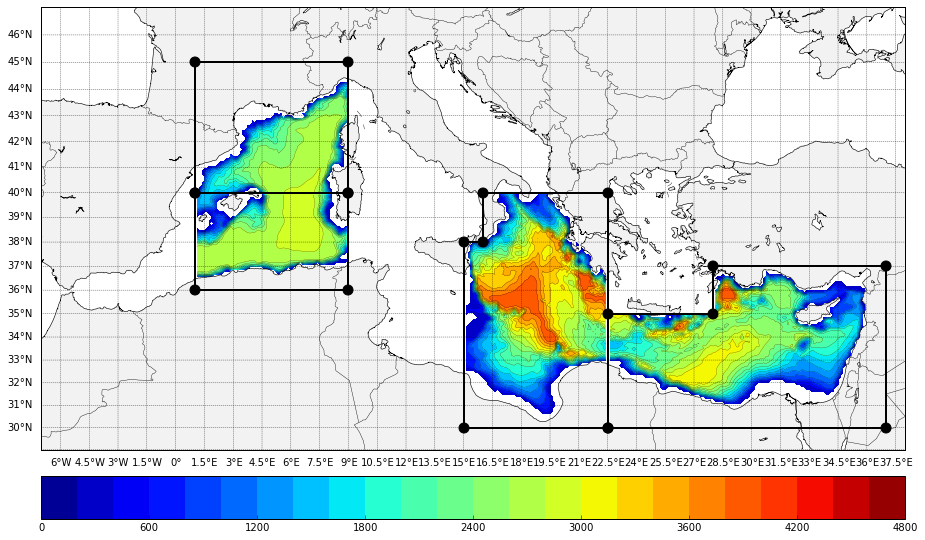

In [3]:
x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

for region in region_list:
    # Defining the coordinates
            if region == 'NWE':
                y = [40,40,45,45];
                x = [1,9,9,1];
            elif region == 'SWE':
                y = [40,40,36,36];
                x = [1,9,9,1];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,37,37,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                    
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
    
            # Creating corresponding variable names
            vars()['bathy_'+region] = np.ma.masked_array(new_bath,indices_re==False)
            #print 'Bathy',region,' : np.shape =', np.shape(vars()['bathy_'+region]), 'max =', np.max(vars()['bathy_'+region]), 'min =', np.min(vars()['bathy_'+region])
            #print 'mean =', np.mean(vars()['bathy_'+region])

            # doing a map
            data_to_plot = vars()['bathy_'+region]

            # Polygone
            xx,yy = m(x,y); # conversion coordonnées
            vertices = np.array([np.hstack((xx, 0)),np.hstack((yy, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            pathpatch = PathPatch(path, facecolor='None', edgecolor='k',linewidth=2.);
            ax.add_patch(pathpatch); # affichage du polygone
            ax.scatter(xx,yy, s=100, c='k', marker='o',zorder=6); # ajoute les points
            # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(0,5000,200);
            CS1 = m.contour(xd,yd,data_to_plot,levels=levels,linewidths=0.2,colors='k');
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet);# binary / jet

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

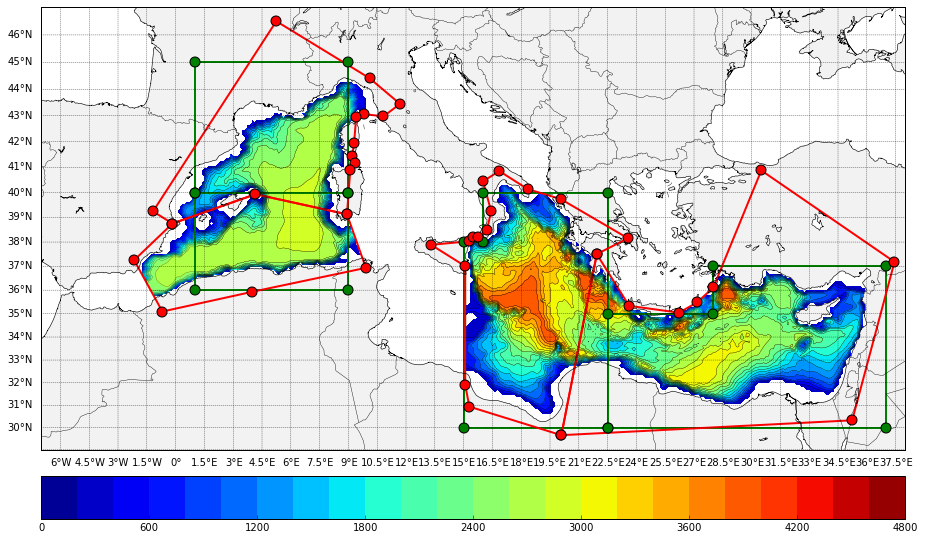

In [26]:
# 25/06 Map OLD regions (still in some plots)
region_list_old_young = ['NWE', 'SWE', 'ION', 'LEV', 'GOL', 'ALG', 'ION2', 'LEV2'] #

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
fig = plt.figure(figsize=(15,15));
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

for region in region_list_old_young:
    # Defining the coordinates
            if region == 'NWE':
                y = [40,40,45,45];
                x = [1,9,9,1];
                curr_col = 'g'
            elif region == 'SWE':
                y = [40,40,36,36];
                x = [1,9,9,1];
                curr_col = 'g'
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
                curr_col = 'g'
            elif region == 'LEV':
                y = [30,35,35,37,37,30];
                x = [22.5,22.5,28,28,37,37];
                curr_col = 'g'
            elif region == 'GOL':
                y = [43.44829732432269, 42.97458858683228, 43.0604306783546, 42.96837802751135, 41.96306909843022,
                     41.43113753799402, 41.16267859938984, 40.91067143551019, 39.12845260900497, 39.938244, 38.756497,
                     39.247095, 46.4938123, 44.4124705]
                x = [11.68790444824612, 10.82516607380484, 9.82460045736472, 9.409248985801327, 9.294900137395576,
                     9.198952404436941, 9.339783959671131, 9.097279040223231, 8.925644550468935, 4.159323, -0.162487,
                     -1.17747, 5.2446879, 10.1001797]
                curr_col = 'r'
            elif region == 'ALG':
                y = [35.093681, 37.252960, 38.756497, 39.938244, 39.1284526, 36.93272338, 35.930524]
                x = [-0.690137, -2.159892, -0.162487, 4.159323, 8.92564455, 9.90934876, 3.994854]
                curr_col = 'r'
            elif region == 'ION2':
                y = [37.88508389278273, 38.03532811253486, 38.19020427258793, 38.206530069008, 38.49522011750975,
                     39.25645461354518, 40.44930918149475, 40.857014, 40.138887, 39.74605, 38.155586, 37.503355,
                     29.658354, 30.941890, 31.924008, 37.001816]
                x = [13.3111744311976, 15.29159159227882, 15.48719160249115, 15.74199259491107, 16.21860737848962,
                     16.43223864162354, 16.01437911440215, 16.854632, 18.343058, 20.052826, 23.556638, 21.936077,
                     20.090485, 15.297679, 15.081913, 15.084801]
                curr_col = 'r'
            elif region == 'LEV2':
                y = [37.503355, 35.335479, 35.045582, 35.478996, 36.113327, 40.879240, 37.180585, 30.329515, 29.658354]
                x = [21.936077, 23.620988, 26.217209, 27.159167, 28.006273, 30.504893, 37.441401, 35.238352, 20.090485]
                curr_col = 'r'
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                    
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
    
            # Creating corresponding variable names
            vars()['bathy_'+region] = np.ma.masked_array(new_bath,indices_re==False)
            #print 'Bathy',region,' : np.shape =', np.shape(vars()['bathy_'+region]), 'max =', np.max(vars()['bathy_'+region]), 'min =', np.min(vars()['bathy_'+region])
            #print 'mean =', np.mean(vars()['bathy_'+region])

            # doing a map
            data_to_plot = vars()['bathy_'+region]

            # Polygone
            xx,yy = m(x,y); # conversion coordonnées
            vertices = np.array([np.hstack((xx, 0)),np.hstack((yy, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            pathpatch = PathPatch(path, facecolor='None', edgecolor=curr_col,linewidth=2.); # edgecolor='k',
            ax.add_patch(pathpatch); # affichage du polygone
            ax.scatter(xx,yy, s=100, c=curr_col, marker='o',zorder=6); # ajoute les points c='k',
            # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(0,5000,200);
            CS1 = m.contour(xd,yd,data_to_plot,levels=levels,linewidths=0.2,colors='k');
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet);# binary / jet

plt.colorbar(cs, orientation='horizontal', pad = 0.03)

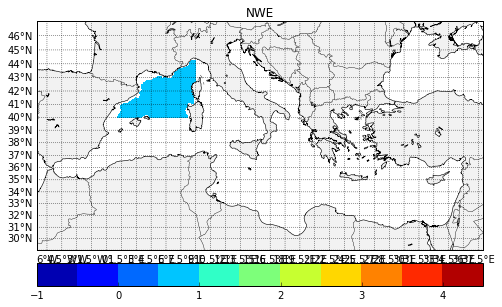

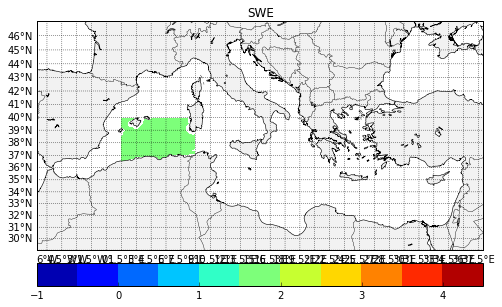

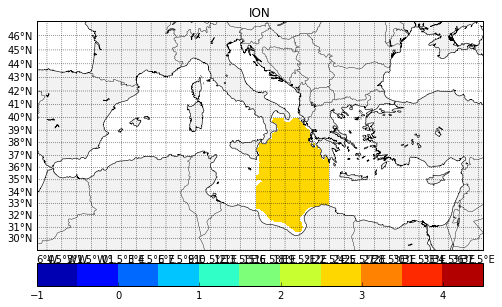

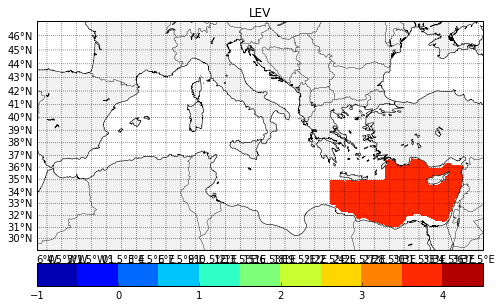

In [242]:
### Creating a mask to compute MLD in Fortran

x1,x2,y1,y2 = -7, 38, 29, 47;

for region in region_list:
    # Defining the coordinates
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
                mask_value = 1
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
                mask_value = 2
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
                mask_value = 3
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
                mask_value = 4
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                    
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
    
            # Creating corresponding variable names
            vars()['mask_'+region] = np.zeros([160,394])
            vars()['mask_'+region][:] = mask_value
            vars()['mask_'+region] = np.ma.masked_array(vars()['mask_'+region],indices_re==False)
            vars()['mask_'+region] = np.ma.masked_array(vars()['mask_'+region], new_bath<200)
            #vars()['mask_'+region][np.isnan(vars()['mask_'+region])] = 0 
            
            # doing a map
            m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            # figure
            plt.figure(figsize=(8,8))
            ax = fig.add_axes([0.1,0.1,0.8,0.8]);
            m.drawcountries(linewidth=0.4);
            m.drawcoastlines(linewidth=0.6);
            m.fillcontinents(color='0.95',lake_color='white');
            parallels = np.arange(0.,81,1);
            m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
            meridians = np.arange(-6.,351.,1.5);
            m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
            
            data_to_plot = vars()['mask_'+region]
            # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,5,0.5);
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.jet);# binary / jet
            plt.colorbar(cs, orientation='horizontal', pad = 0.03)
            eval('plt.title(\''+region+'\')')

In [251]:
test_mask = np.ma.vstack(mask_NWE, mask_SWE, mask_ION, mask_LEV)
np.shape(test_mask) #(4, 160, 394)

mask_sum = np.ma.sum(test_mask,axis=0)
np.shape(mask_sum)

(160, 394)

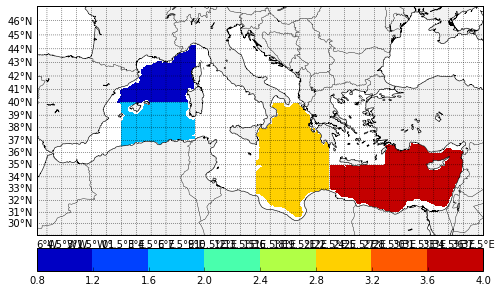

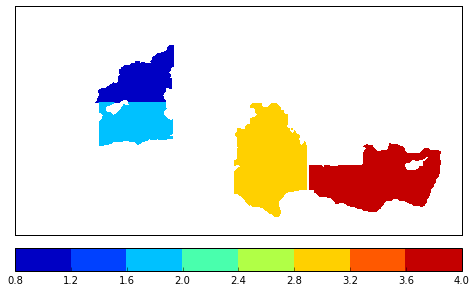

In [252]:
# doing a map
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
# figure
plt.figure(figsize=(8,8))
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,1);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,1.5);
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);
            
# Données
xd,yd = m(lon_t,lat_t);
#levels = np.arange(-1,5,0.5);
cs = m.contourf(xd,yd,mask_sum,cmap=plt.cm.jet);# binary / jet levels=levels,
plt.colorbar(cs, orientation='horizontal', pad = 0.03)

# figure
plt.figure(figsize=(8,8))
            
# Données
xd,yd = m(lon_t,lat_t);
#levels = np.arange(-1,5,0.5);
cs = m.contourf(xd,yd,mask_sum,cmap=plt.cm.jet);# binary / jet levels=levels,
plt.colorbar(cs, orientation='horizontal', pad = 0.03) # seems OK!

In [178]:
### Creating a NetCDF file for our mask! ###
# Caroline will run a 
#np.savetxt('./mask_alex.txt', mask_sum)
mask_alex = Dataset('./mask_alex.nc', 'w', format='NETCDF4_CLASSIC')
print mask_alex.file_format
# creating dimensions
ni_t = mask_alex.createDimension('ni_t', 160) 
nj_t = mask_alex.createDimension('nj_t', 394) 
# creating variable with dimensions
mask_t = mask_alex.createVariable('mask_t', np.int32, ('ni_t', 'nj_t'))
# np.shape(mask_sum) # (160, 394)
mask_t[:] =mask_sum[:] # putting our df inside our variable
mask_alex.close() # writing the netcdf file!

In [ ]:
### END OF THIS PART ###

In [4]:
# Loading MLD from Caroline's file
file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'

mld_caro = read_csv(file_path+'result_mld_alldays', sep='\s+',names=['y','m','d','NWE','SWE','ION','LEV'])

for region in region_list:
    vars()['mld_caro_'+region] = pd.DataFrame(mld_caro[region])
    
np.shape(mld_caro_NWE) # (2445, 1)
#mld_caro_NWE

(2445, 1)

In [5]:
### MLD ###
#file_path2 = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/'

for region in region_list:
    full_list2 = os.listdir(file_path)
    full_list2.sort()

    all_list = list()  # here we preallocate an empty list

    for our_file in full_list2:
        if fnmatch.fnmatch(our_file, 'MLD_Mean_' + region + '.csv'):  # modified to try on some files
            vars()['MLD_csv_'+region] = read_csv(file_path+our_file)
            vars()['MLD_Mean_' + region] = pd.DataFrame(vars()['MLD_csv_'+region]['var'])
            vars()['MLD_Mean_' + region]['date'] = vars()['MLD_csv_'+region]['date']
            vars()['MLD_Mean_' + region]['date'] = pd.to_datetime(vars()['MLD_Mean_' + region]['date'],format='%Y-%m-%d')
            vars()['MLD_Mean_' + region]['yy'] = pd.DatetimeIndex(vars()['MLD_Mean_' + region]['date']).year
            
np.shape(MLD_Mean_ION) # (2445, 3)

(2445, 3)

In [13]:
## Int Chla processing

# Loading files
file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/'

### MLD ###
#file_path2 = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/'

for region in region_list:
    full_list2 = os.listdir(file_path)
    full_list2.sort()

    all_list = list()  # here we preallocate an empty list

    for our_file in full_list2:
        if fnmatch.fnmatch(our_file, 'Int_Chl_mean_' + region + '.csv'):  # modified to try on some files
            vars()['Int_Chl_csv_'+region] = read_csv(file_path+our_file)
            vars()['Int_Chl_Mean_' + region] = pd.DataFrame(vars()['Int_Chl_csv_'+region]['var'])
            vars()['Int_Chl_Mean_' + region]['date'] = vars()['Int_Chl_csv_'+region]['date']
            vars()['Int_Chl_Mean_' + region]['date'] = pd.to_datetime(vars()['Int_Chl_Mean_' + region]['date'],format='%Y-%m-%d')
            vars()['Int_Chl_Mean_' + region]['yy'] = pd.DatetimeIndex(vars()['Int_Chl_Mean_' + region]['date']).year

In [14]:
Int_Chl_Mean_ION.head()
np.shape(Int_Chl_Mean_ION) # (2445, 3) SEEMS OK!

(2445, 3)

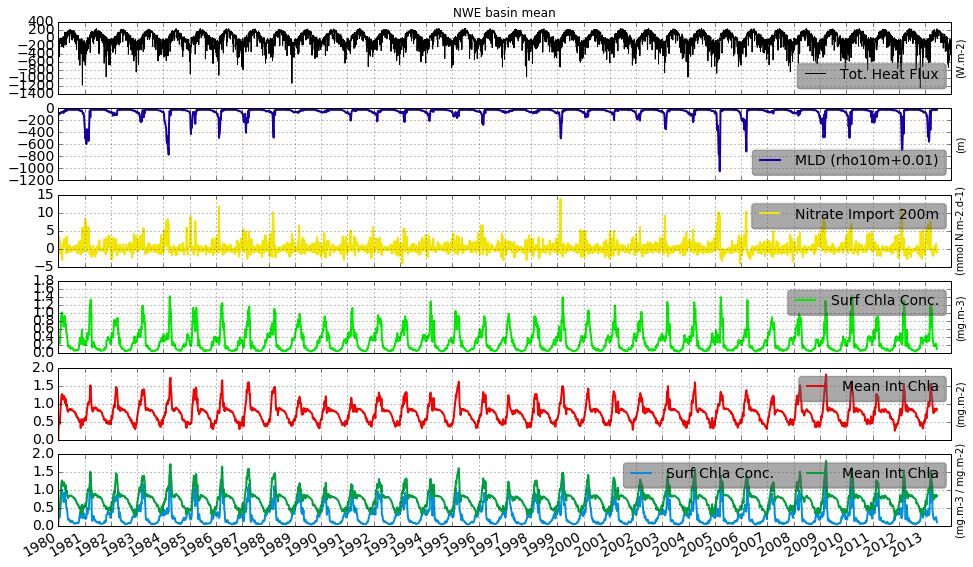

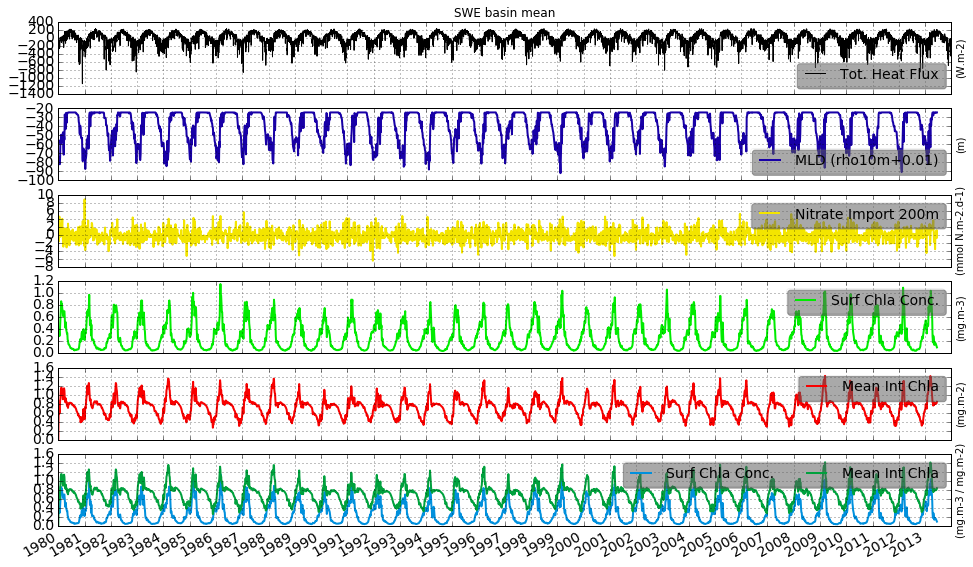

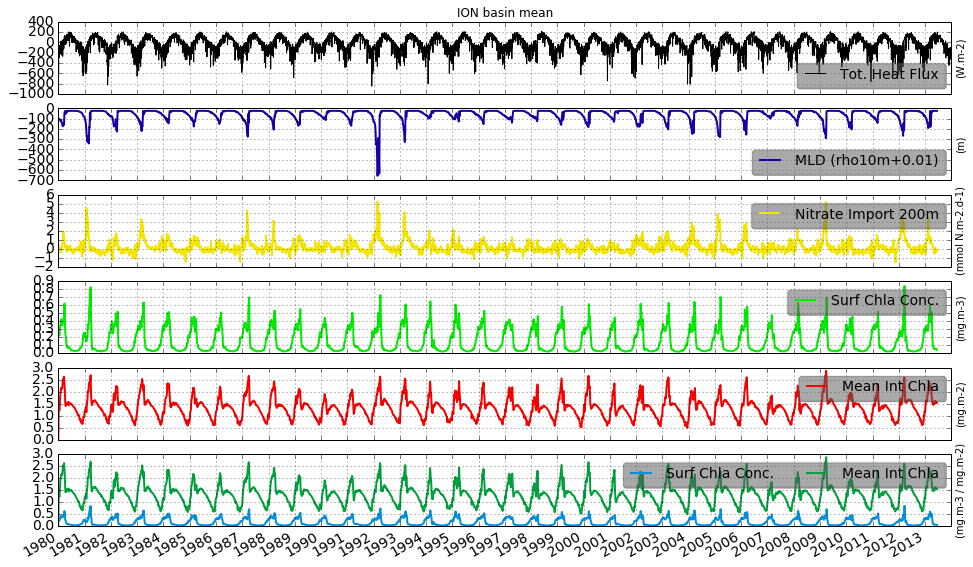

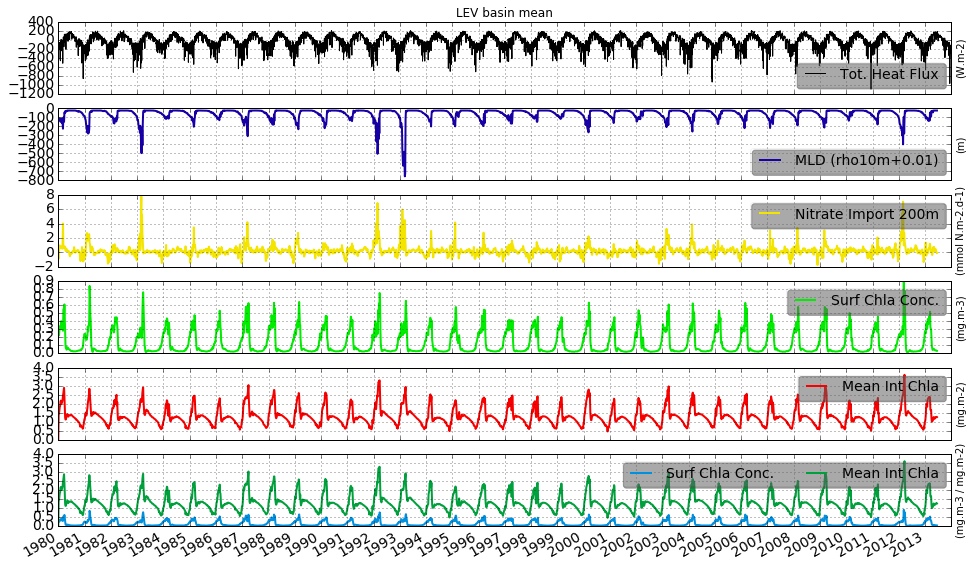

In [15]:
# 21/06 Last Fig Int Chla

# Preparing arrays
Int_Chl_Mean2_ION = np.append(np.zeros([698]),Int_Chl_Mean_ION['var'])
np.shape(Int_Chl_Mean2_ION)
#np.shape(dates2) # (3143,)

Int_Chl_Mean2_NWE = np.append(np.zeros([698]),Int_Chl_Mean_NWE['var'])
Int_Chl_Mean2_SWE = np.append(np.zeros([698]),Int_Chl_Mean_SWE['var'])
Int_Chl_Mean2_LEV = np.append(np.zeros([698]),Int_Chl_Mean_LEV['var'])

##

nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    plt.subplot(6, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    plt.subplot(6, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)

    plt.subplot(6, 1, 6)
    #plt.plot(dates2, vars()['ppb_2D_'+basin]['var'],color=next(our_colormap), label='GPP',linewidth=2)
    #plt.plot(dates2, vars()['netppb_2D_'+basin]['var'],color=next(our_colormap), label='NetPP',linewidth=2)
    plt.plot(dates2, vars()['chl_tot_2D_'+basin]['var'],color=next(our_colormap), label='Surf Chla Conc.',linewidth=2)
    plt.plot(dates2, vars()['Int_Chl_Mean2_'+basin],color=next(our_colormap), label='Mean Int Chla',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-3 / mg.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 4)
    plt.plot(dates2, vars()['chl_tot_2D_'+basin]['var'],color=next(our_colormap), label='Surf Chla Conc.',linewidth=2)
    #plt.plot(dates2, vars()['Int_Chl_Mean2_'+basin],color=next(our_colormap), label='Mean Int Chla',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-3)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 5)
    #plt.plot(vars()['MLD_Mean_'+basin]['date'], vars()['Int_Chl_Mean_'+basin]['var'],color=next(our_colormap), label='Mean Int Chla',linewidth=2)
    plt.plot(dates2, vars()['Int_Chl_Mean2_'+basin],color=next(our_colormap), label='Mean Int Chla',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/JUNE_FIGS/'+basin+'_TS_IntVar_ChlInt.png\',bbox_inches=\'tight\',format=\'png\')')

In [6]:
### 22/06 Loading Stratif Index

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/STRATIF_INDEX/'

for region in region_list:
    print 'Region:', region
    full_list2 = os.listdir(file_path)
    full_list2.sort()

    short_list = list()
    
    for our_file in full_list2:
        if fnmatch.fnmatch(our_file, 'stratif_moy_' + region + '*.dat'):  # modified to try on some files
            short_list = np.append(short_list, our_file)
            
    print short_list
    print ' '
    
    if len(short_list) == 1:
        vars()['SI_'+region] = pd.read_table(file_path+our_file, delimiter='\s+', names=['date', 'SI', 'nb_pts'])
        
    else:
        print 'short list > 1 file, short_list dim shape =', np.shape(short_list)
        print ' '
        first_file_SI = pd.read_table(file_path+short_list[0], delimiter='\s+', names=['date', 'SI', 'nb_pts'])
        second_file_SI = pd.read_table(file_path+short_list[1], delimiter='\s+', names=['date', 'SI', 'nb_pts'])
        vars()['SI_'+region] = pd.DataFrame(second_file_SI['date'])
        
        # Temporal array to compute the weighted SI
        temp_SI = np.zeros(len(second_file_SI))
        temp_SI[:] = np.nan
        temp_SI = pd.DataFrame(temp_SI, columns= ['SI'])
        
        # Actually computing it
        for i in np.arange(0,len(second_file_SI)):
            temp_SI['SI'][i] = ((first_file_SI['SI'][i]*first_file_SI['nb_pts'][i])+\
                                (second_file_SI['SI'][i]*second_file_SI['nb_pts'][i]))/\
                                (first_file_SI['nb_pts'][i]+second_file_SI['nb_pts'][i])
                
        # Putting the data in the right DataFrame        
        vars()['SI_'+region]['SI'] = temp_SI['SI']
        
print 'END of cell'

Region: NWE
['stratif_moy_NWE.dat']
 
Region: SWE
['stratif_moy_SWE.dat']
 
Region: ION
['stratif_moy_ION1.dat' 'stratif_moy_ION2.dat']
 
short list > 1 file, short_list dim shape = (2,)
 
Region: LEV
['stratif_moy_LEV1.dat' 'stratif_moy_LEV2.dat']
 
short list > 1 file, short_list dim shape = (2,)
 
END of cell


In [100]:
SI_ION.head()

,date,SI
0,19700615,180.637546
1,19700620,184.874320
2,19700625,189.406052
3,19700630,194.280245
4,19700705,197.501722


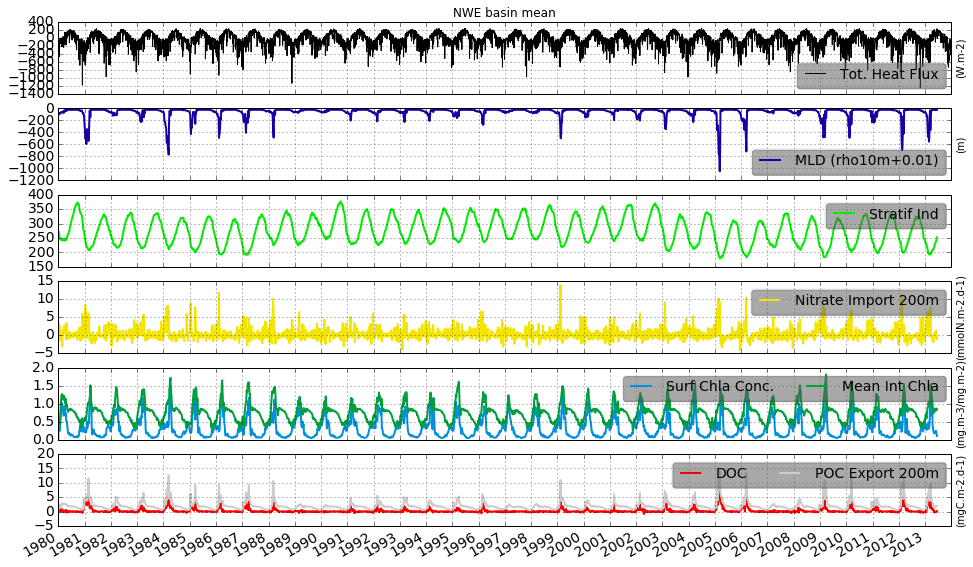

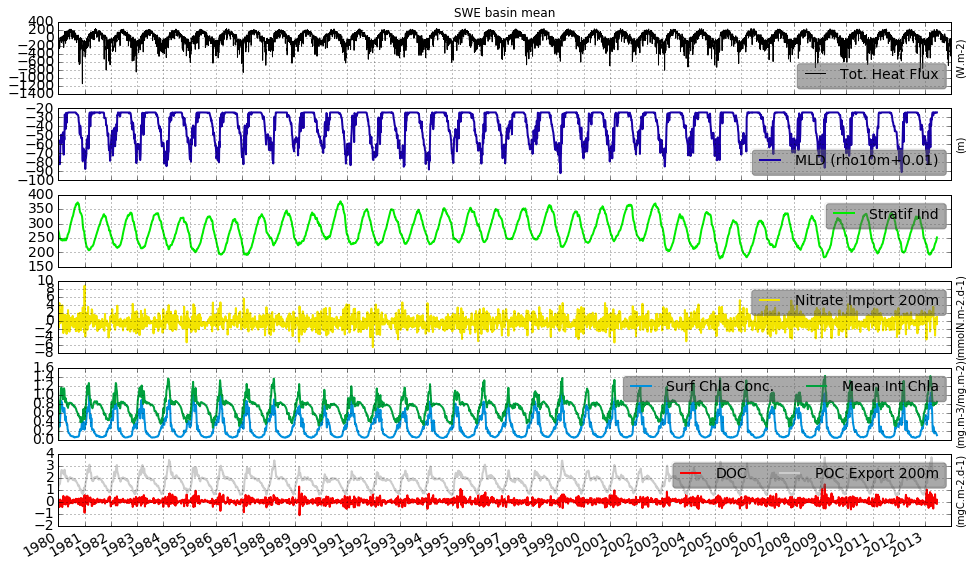

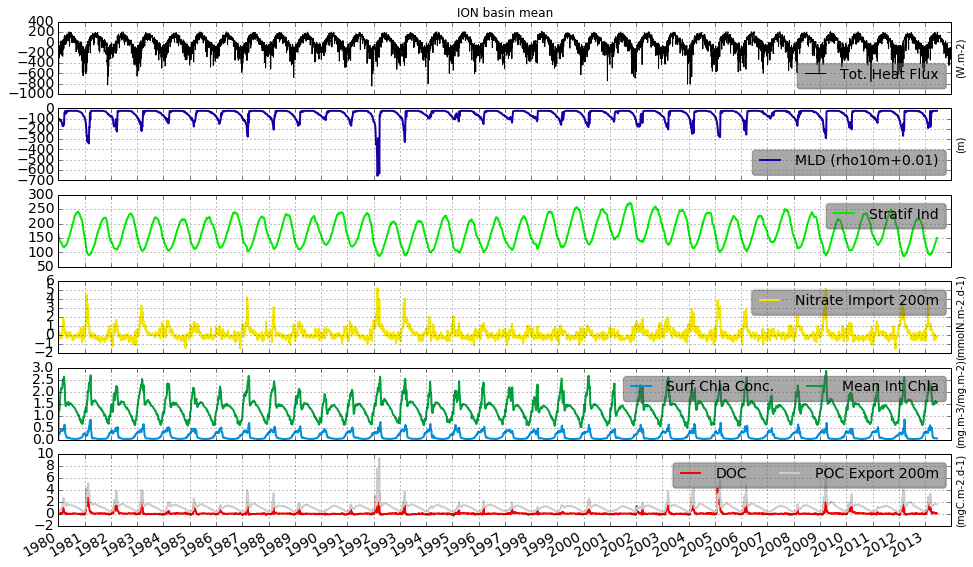

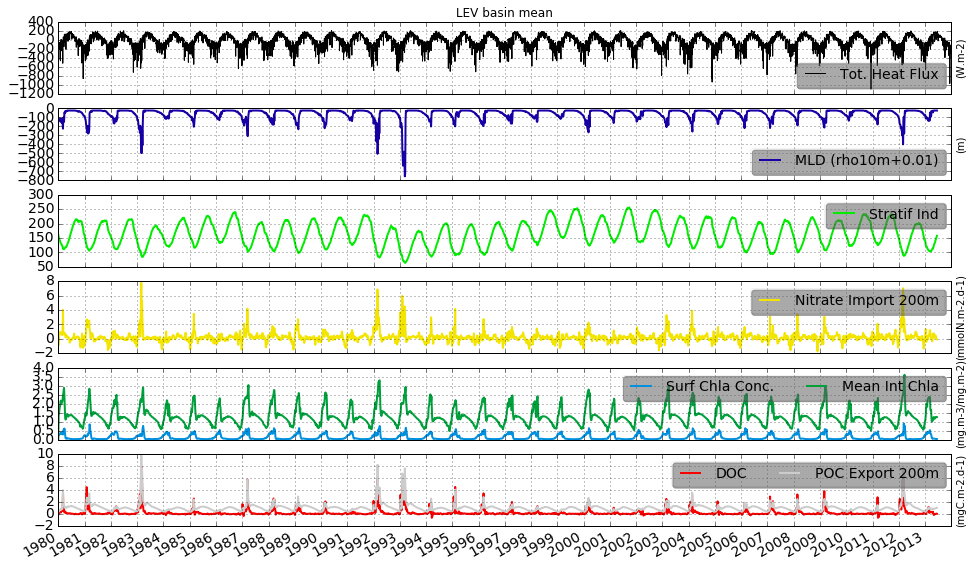

In [18]:
# TS Interann Var with Stratification Indices

for basin in region_list:
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    plt.subplot(6, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    plt.subplot(6, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)

    plt.subplot(6, 1, 5)
    plt.plot(dates2, vars()['chl_tot_2D_'+basin]['var'],color=next(our_colormap), label='Surf Chla Conc.',linewidth=2)
    plt.plot(dates2, vars()['Int_Chl_Mean2_'+basin],color=next(our_colormap), label='Mean Int Chla',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-3/mg.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, vars()['SI_'+basin]['SI'],color=next(our_colormap), label='Stratif Ind',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    #plt.ylabel("(mg.m-3)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 4)
    plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmolN.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 6)
    plt.plot(dates2, vars()['export_doc200_2D_'+basin]['var'],color=next(our_colormap), label='DOC',linewidth=2)
    plt.plot(dates2, vars()['export_poc200_2D_'+basin]['var'],color=next(our_colormap), label='POC Export 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/JUNE_FIGS/'+basin+'_TS_IntVar_StratifInd.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
### END of work on Stratif Index

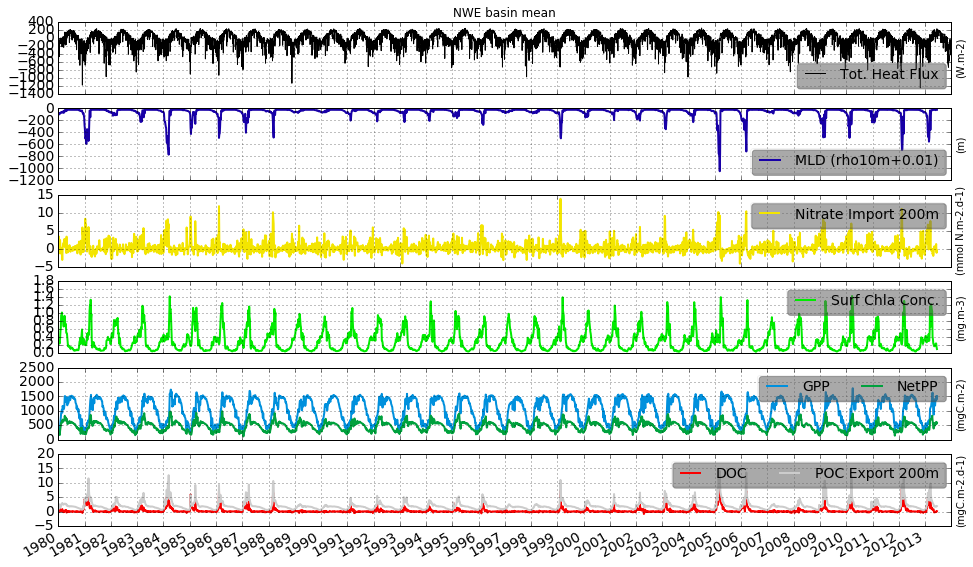

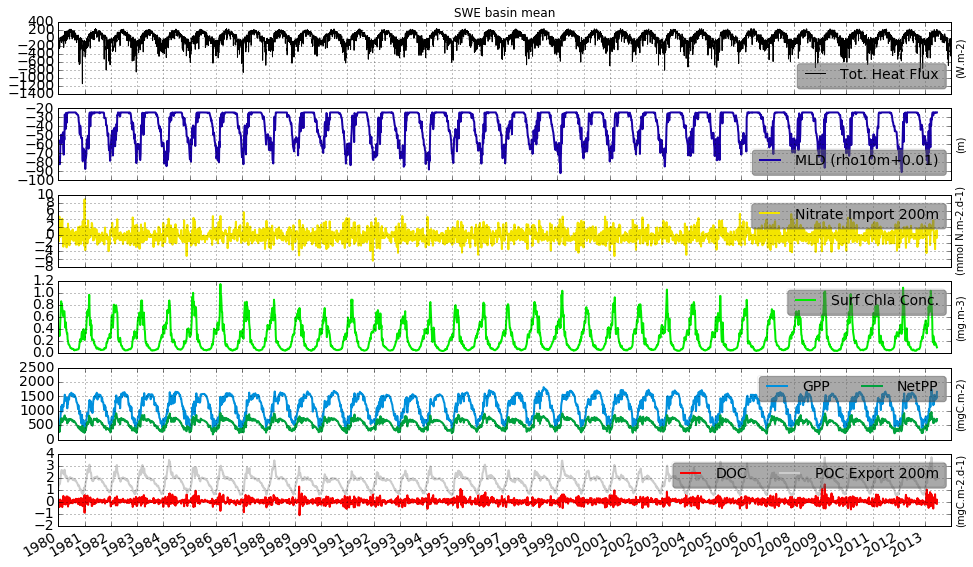

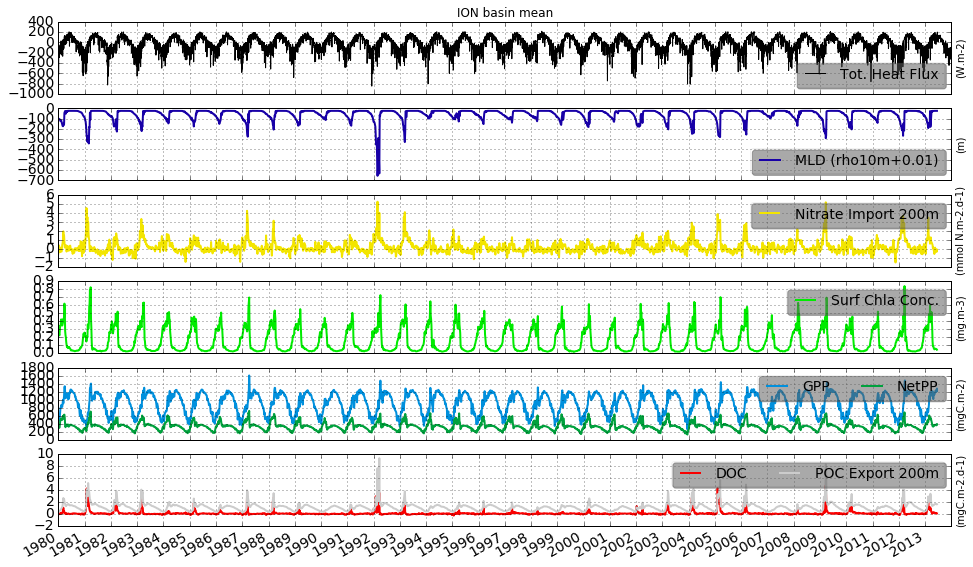

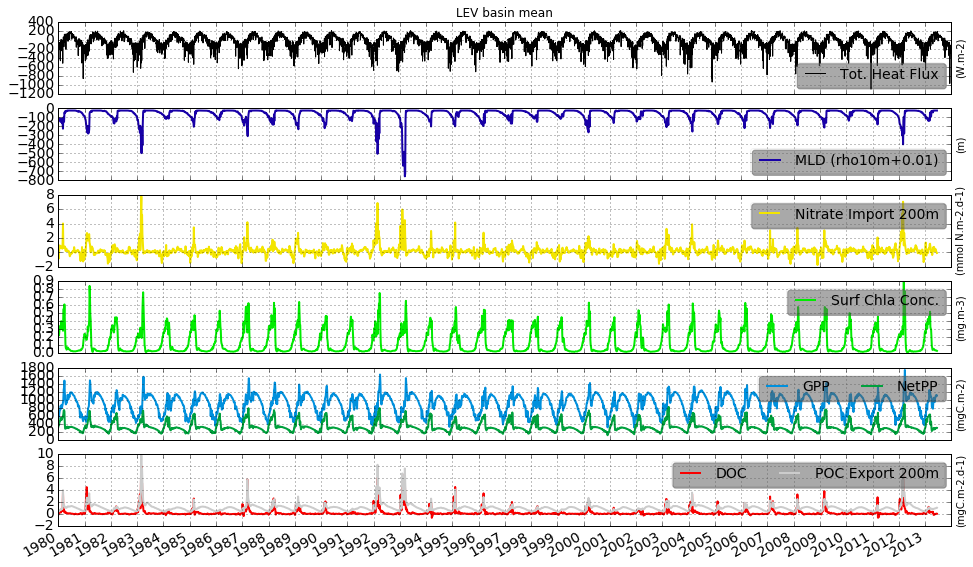

In [26]:
nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    plt.subplot(6, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    plt.subplot(6, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)

    plt.subplot(6, 1, 5)
    plt.plot(dates2, vars()['ppb_2D_'+basin]['var'],color=next(our_colormap), label='GPP',linewidth=2)
    plt.plot(dates2, vars()['netppb_2D_'+basin]['var'],color=next(our_colormap), label='NetPP',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 4)
    plt.plot(dates2, vars()['chl_tot_2D_'+basin]['var'],color=next(our_colormap), label='Surf Chla Conc.',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-3)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 6)
    plt.plot(dates2, vars()['export_doc200_2D_'+basin]['var'],color=next(our_colormap), label='DOC',linewidth=2)
    plt.plot(dates2, vars()['export_poc200_2D_'+basin]['var'],color=next(our_colormap), label='POC Export 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)

    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/JUNE_FIGS/'+basin+'_TS_Interann_Variab'+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [7]:
#file_path2 = '../DATA/LONG_SIMS/Best_BoostW/VarInt/'
file_path2 = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYTO_ZOO/'

nut_list = ['allzoo', 'zoomicron', 'zoonanon', 'zoomeson', # ,
               'allphy', 'dian', 'synen', 'nanon']

for region in region_list:
    print region
    full_list2 = os.listdir(file_path2)
    full_list2.sort()

    all_list = list()  # here we preallocate an empty list

    for our_file in full_list2:
        for nutrient in nut_list:
            if fnmatch.fnmatch(our_file, nutrient + '_SUM_' + region + '.csv'):  # modified to try on some files
                vars()[nutrient + '_csv_' + region] = read_csv(file_path2+our_file)
                vars()[nutrient + '_SUM_' + region] = vars()[nutrient + '_csv_' + region]['var']
                vars()[nutrient + '_SUM_' + region][0:650] = np.nan

NWE
SWE
ION
LEV


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [36]:
np.shape(allphy_SUM_ION) # (3143,)
np.shape(dates2)

(3143,)

In [ ]:
                vars()[nutrient + '_csv'] = read_csv(file_path2+our_file)
                vars()[nutrient + '_2D_' + region] = pd.DataFrame(vars()[nutrient + '_csv']['var'])
                vars()[nutrient + '_2D_' + region]['date'] = vars()[nutrient + '_csv']['date']
                vars()[nutrient + '_2D_' + region]['date'] = pd.to_datetime(vars()[nutrient + '_2D_' + region]['date'],format='%Y-%m-%d')
                vars()[nutrient + '_2D_' + region]['yy'] = pd.DatetimeIndex(vars()[nutrient + '_2D_' + region]['date']).year
                
dates2 = vars()[nutrient + '_csv']['date']
dates2 = pd.to_datetime(dates2, format='%Y-%m-%d')

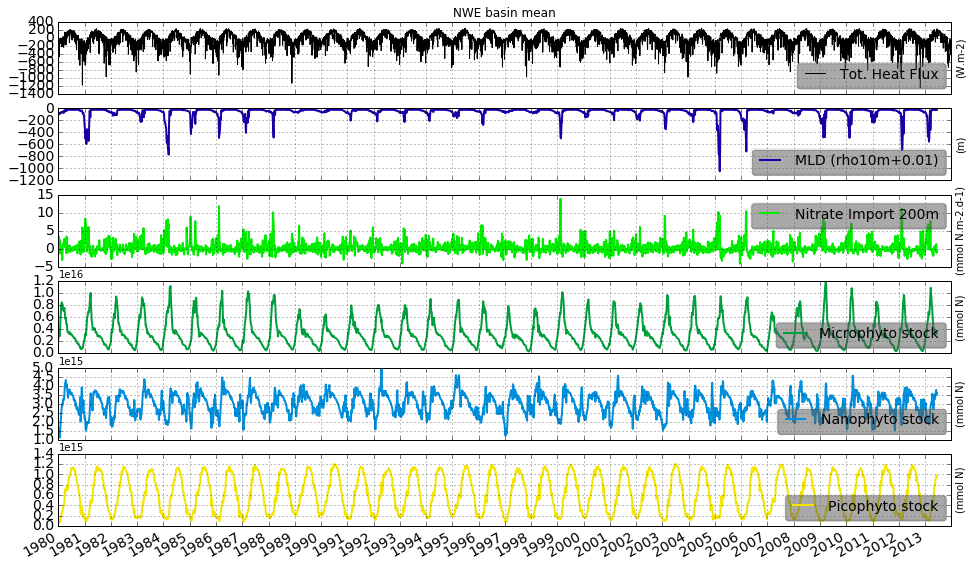

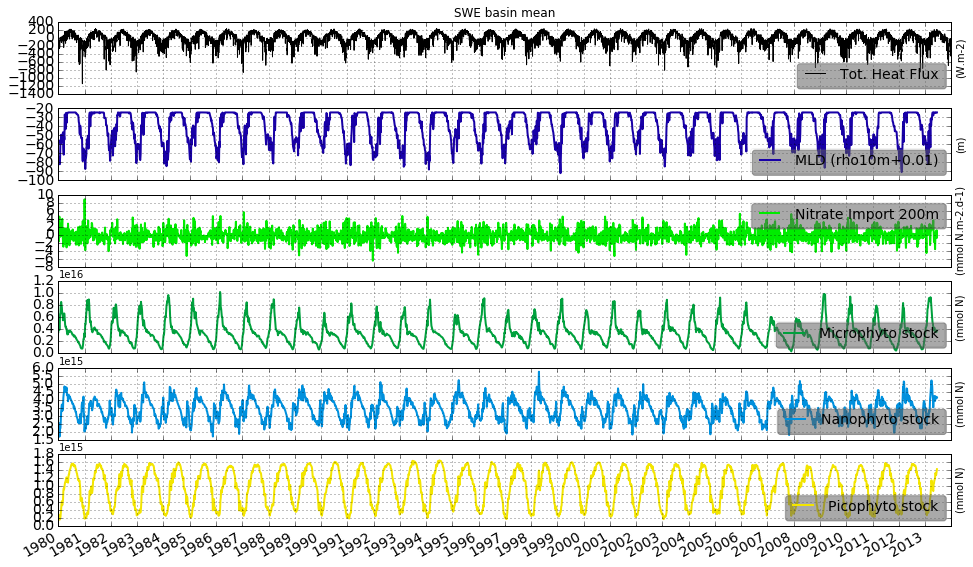

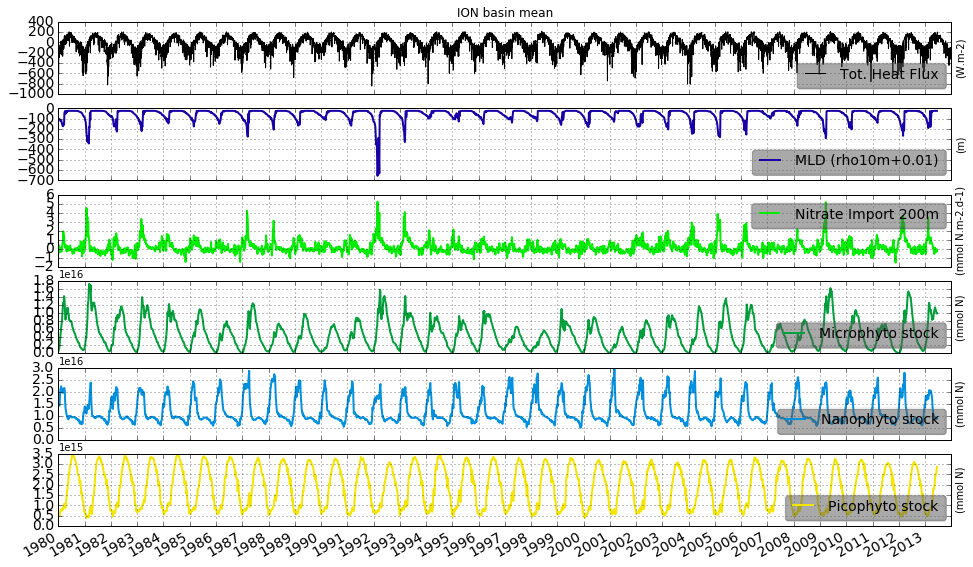

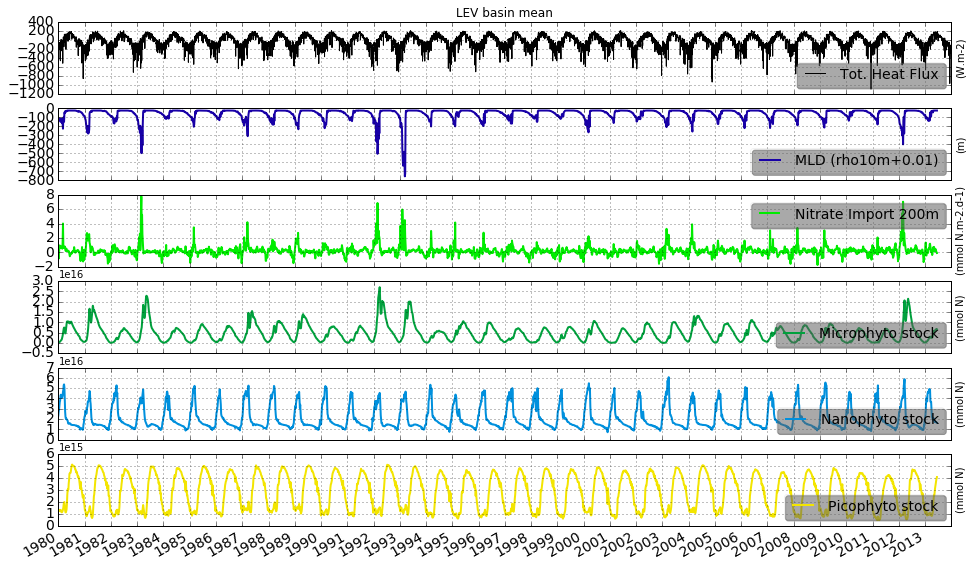

In [19]:
#nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    plt.subplot(6, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    plt.subplot(6, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    #plt.plot(vars()['MLD_Mean_'+basin]['date'],vars()['MLD_Mean_'+basin]['var'],color='r', label='MLD Alex',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

    plt.subplot(6, 1, 5)
    #plt.plot(dates2, vars()['dian_SUM_'+basin],color=next(our_colormap), label='Microphyto',linewidth=2)
    plt.plot(dates2, vars()['nanon_SUM_'+basin],color=next(our_colormap), label='Nanophyto stock',linewidth=2)
    #plt.plot(dates2, vars()['netppb_2D_'+basin]['var'],color=next(our_colormap), label='NetPP',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 4)
    #plt.plot(dates2, vars()['allphy_SUM_'+basin],color=next(our_colormap), label='All Phyto',linewidth=2)
    plt.plot(dates2, vars()['dian_SUM_'+basin],color=next(our_colormap), label='Microphyto stock',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
#    ax2 = ax.twinx()
#    ax2.plot(dates2, vars()['export_pho_sw_2D_'+basin]['var'],color=next(our_colormap), label='export_pho',linewidth=2)
#    plt.gcf().autofmt_xdate()
    #plt.ylabel("(mgC.m-2.d-1)", fontsize=18)
#    plt.yticks(fontsize=14)
#    plt.xticks(fontsize=14)
#    plt.xlim(['1980-01-01', '2012-12-31'])
#    plt.grid()
#    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
#    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 6)
    #plt.plot(dates2, vars()['nanon_SUM_'+basin],color=next(our_colormap), label='Nanophyto',linewidth=2)
    plt.plot(dates2, vars()['synen_SUM_'+basin],color=next(our_colormap), label='Picophyto stock',linewidth=2)
    #plt.plot(dates2, vars()['export_doc200_2D_'+basin]['var'],color=next(our_colormap), label='DOC',linewidth=2)
    #plt.plot(dates2, vars()['export_poc200_2D_'+basin]['var'],color=next(our_colormap), label='POC Export 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    #c += 1
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/JUNE_FIGS/TS/'+basin+'_TS_InterVar_Phyto'+'.png\',bbox_inches=\'tight\',format=\'png\')')

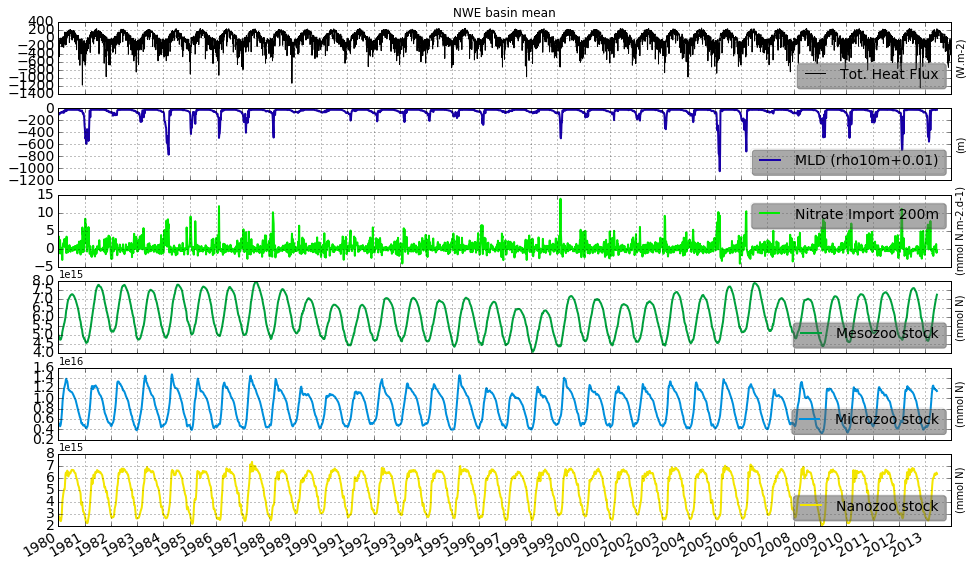

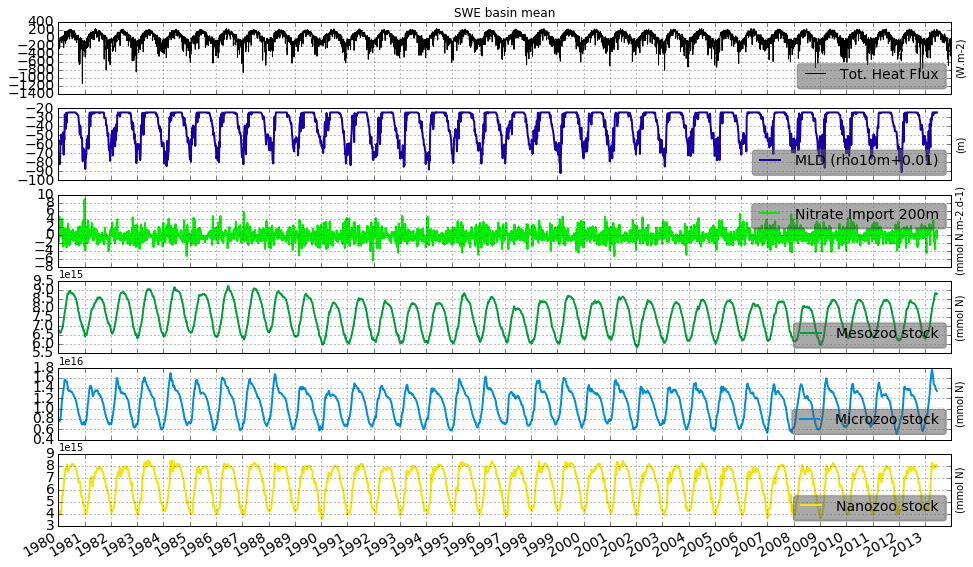

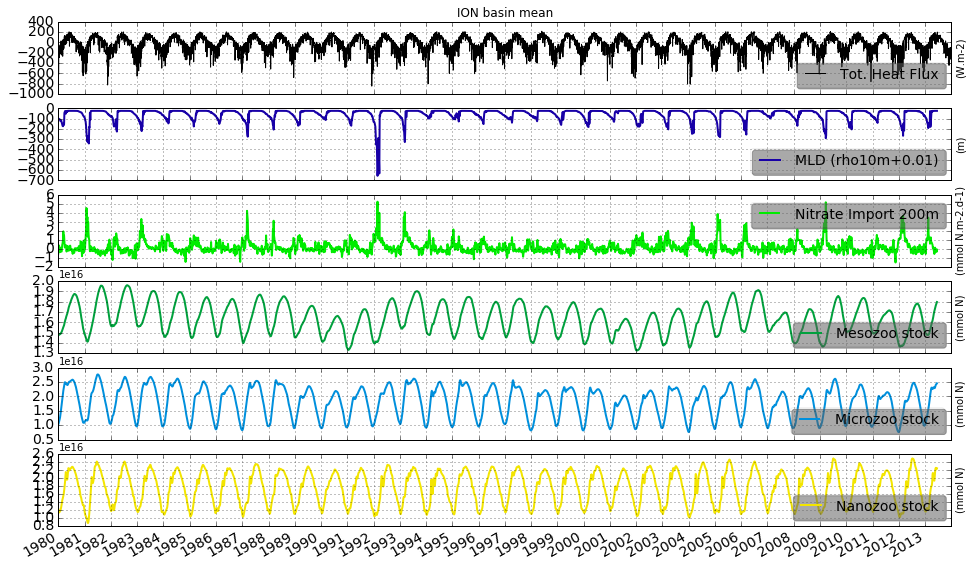

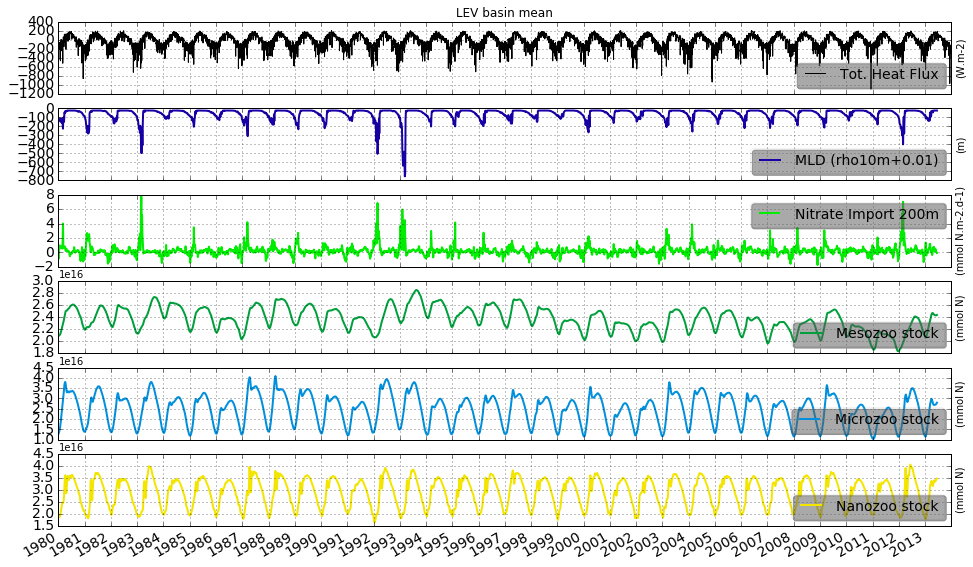

In [20]:
nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    plt.subplot(6, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    plt.subplot(6, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    #plt.plot(vars()['MLD_Mean_'+basin]['date'],vars()['MLD_Mean_'+basin]['var'],color='r', label='MLD Alex',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

    plt.subplot(6, 1, 5)
    plt.plot(dates2, vars()['zoomicron_SUM_'+basin],color=next(our_colormap), label='Microzoo stock',linewidth=2)
    #plt.plot(dates2, vars()['zoomeson_SUM_'+basin],color=next(our_colormap), label='Mesozoo',linewidth=2)
    #plt.plot(dates2, vars()['netppb_2D_'+basin]['var'],color=next(our_colormap), label='NetPP',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 4)
    #plt.plot(dates2, vars()['allzoo_SUM_'+basin],color=next(our_colormap), label='All Zoo',linewidth=2)
    plt.plot(dates2, vars()['zoomeson_SUM_'+basin],color=next(our_colormap), label='Mesozoo stock',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
#    ax2 = ax.twinx()
#    ax2.plot(dates2, vars()['export_pho_sw_2D_'+basin]['var'],color=next(our_colormap), label='export_pho',linewidth=2)
#    plt.gcf().autofmt_xdate()
    #plt.ylabel("(mgC.m-2.d-1)", fontsize=18)
#    plt.yticks(fontsize=14)
#    plt.xticks(fontsize=14)
#    plt.xlim(['1980-01-01', '2012-12-31'])
#    plt.grid()
#    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
#    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 6)
    #plt.plot(dates2, vars()['zoomeson_SUM_'+basin],color=next(our_colormap), label='Mesozoo',linewidth=2)
    plt.plot(dates2, vars()['zoonanon_SUM_'+basin],color=next(our_colormap), label='Nanozoo stock',linewidth=2)
    #plt.plot(dates2, vars()['export_doc200_2D_'+basin]['var'],color=next(our_colormap), label='DOC',linewidth=2)
    #plt.plot(dates2, vars()['export_poc200_2D_'+basin]['var'],color=next(our_colormap), label='POC Export 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    #c += 1
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/JUNE_FIGS/TS/'+basin+'_TS_InterVar_Zoo'+'.png\',bbox_inches=\'tight\',format=\'png\')')

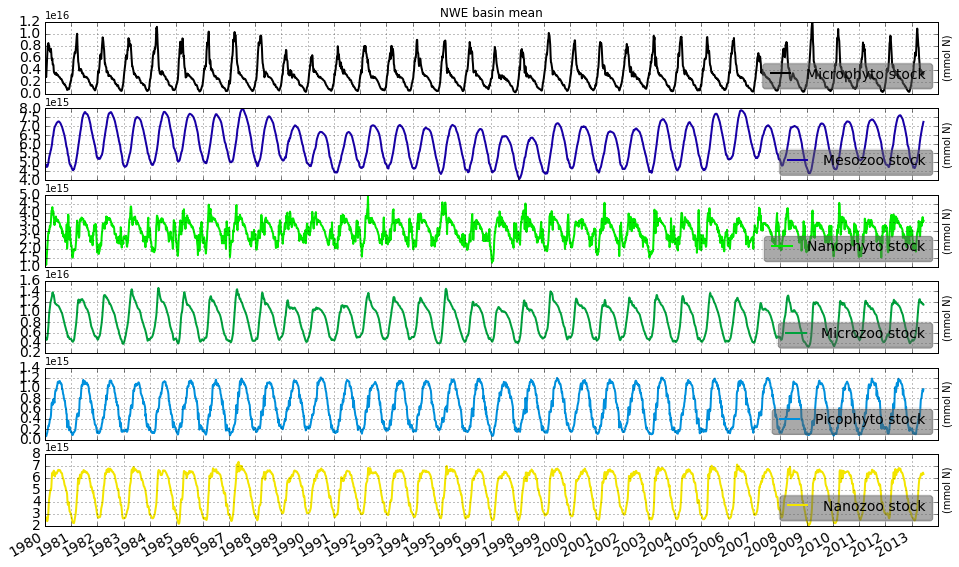

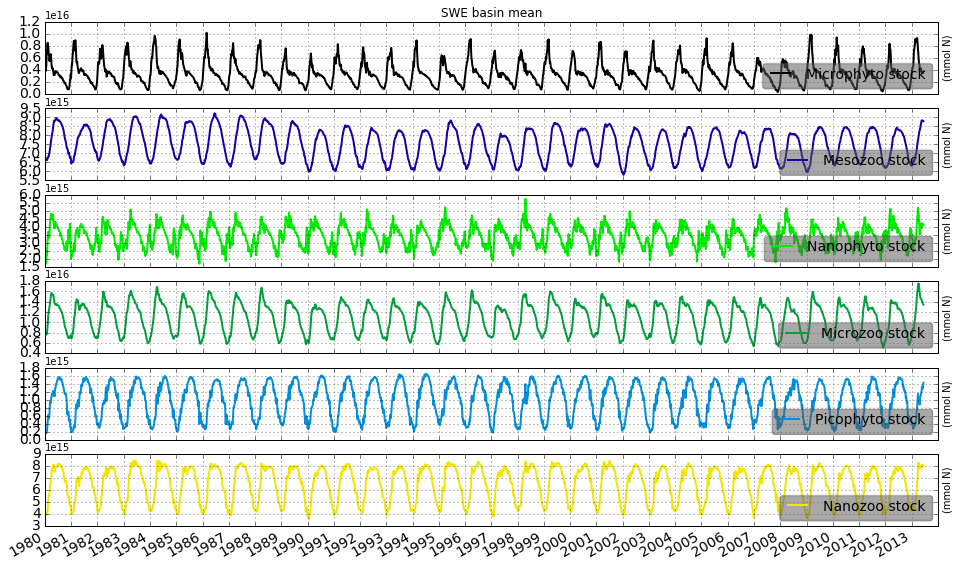

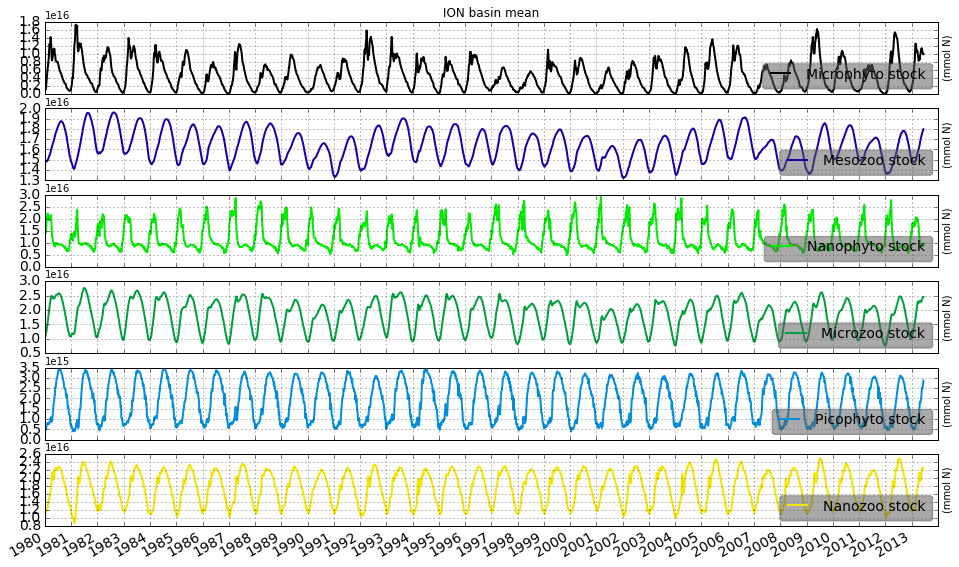

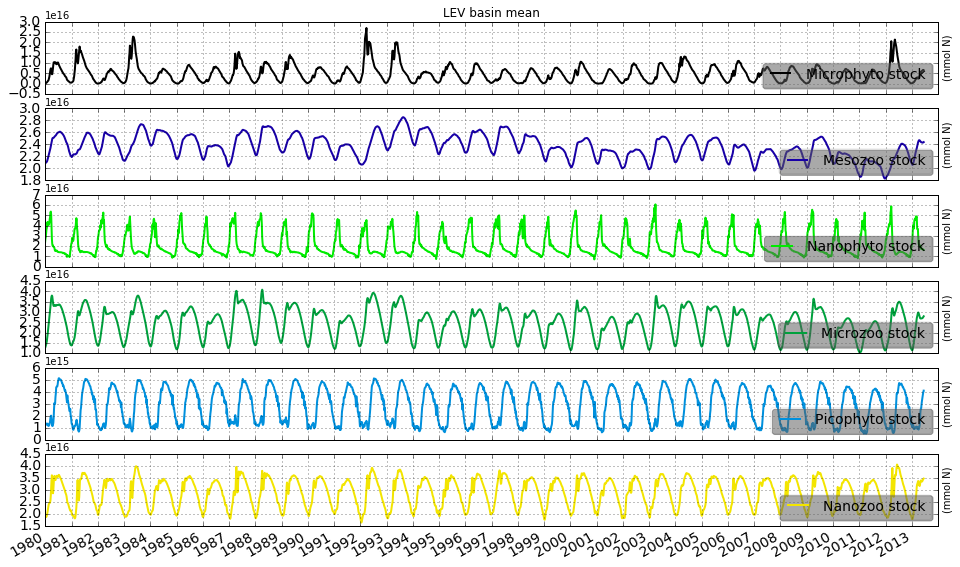

In [22]:
nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    plt.subplot(6, 1, 1)
    plt.plot(dates2, vars()['dian_SUM_'+basin],color=next(our_colormap), label='Microphyto stock',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    plt.subplot(6, 1, 2)
    plt.plot(dates2, vars()['zoomeson_SUM_'+basin],color=next(our_colormap), label='Mesozoo stock',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)

    plt.subplot(6, 1, 5)
    plt.plot(dates2, vars()['synen_SUM_'+basin],color=next(our_colormap), label='Picophyto stock',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 4)
    plt.plot(dates2, vars()['zoomicron_SUM_'+basin],color=next(our_colormap), label='Microzoo stock',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, vars()['nanon_SUM_'+basin],color=next(our_colormap), label='Nanophyto stock',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    
    plt.subplot(6, 1, 6)
    plt.plot(dates2, vars()['zoonanon_SUM_'+basin],color=next(our_colormap), label='Nanozoo stock',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2013-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)

    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/JUNE_FIGS/TS/'+basin+'_TS_InterVar_Phyto_Zoo'+'.png\',bbox_inches=\'tight\',format=\'png\')')

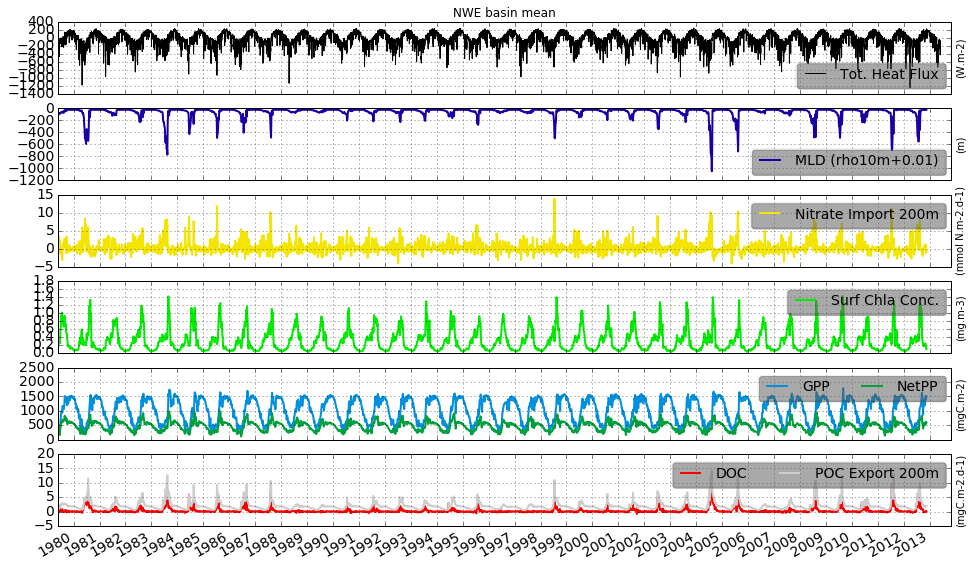

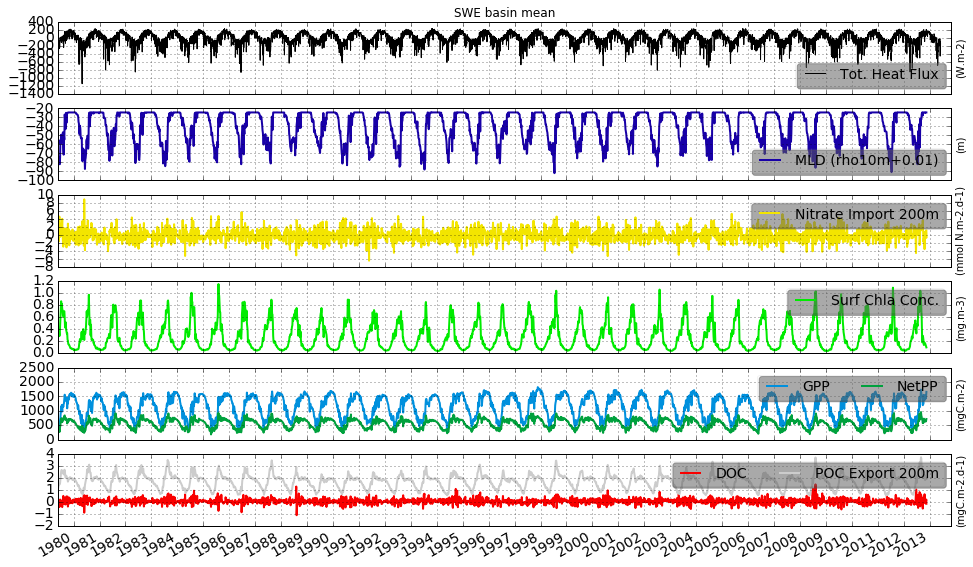

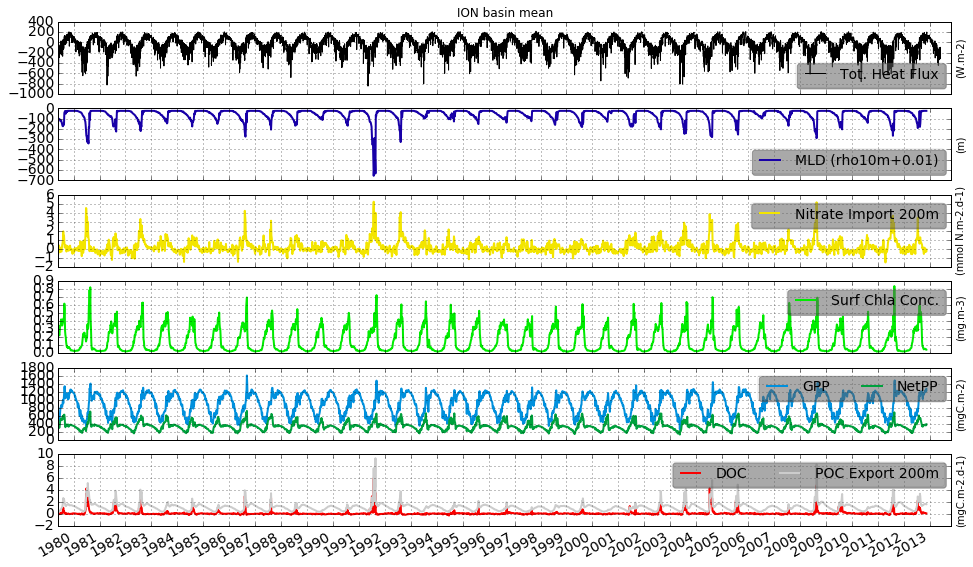

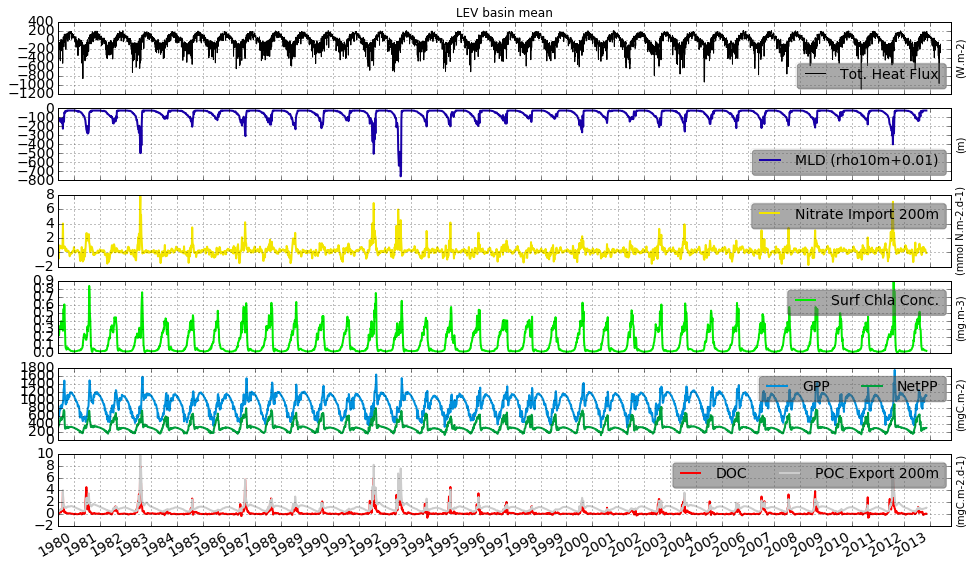

In [14]:
nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    plt.subplot(6, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2014-05-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    plt.subplot(6, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    #plt.plot(vars()['MLD_Mean_'+basin]['date'],vars()['MLD_Mean_'+basin]['var'],color='r', label='MLD Alex',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2014-05-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

    plt.subplot(6, 1, 5)
    plt.plot(dates2, vars()['ppb_2D_'+basin]['var'],color=next(our_colormap), label='GPP',linewidth=2)
    plt.plot(dates2, vars()['netppb_2D_'+basin]['var'],color=next(our_colormap), label='NetPP',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2014-05-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 4)
    plt.plot(dates2, vars()['chl_tot_2D_'+basin]['var'],color=next(our_colormap), label='Surf Chla Conc.',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-3)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2014-05-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2014-05-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
#    ax2 = ax.twinx()
#    ax2.plot(dates2, vars()['export_pho_sw_2D_'+basin]['var'],color=next(our_colormap), label='export_pho',linewidth=2)
#    plt.gcf().autofmt_xdate()
    #plt.ylabel("(mgC.m-2.d-1)", fontsize=18)
#    plt.yticks(fontsize=14)
#    plt.xticks(fontsize=14)
#    plt.xlim(['1980-01-01', '2012-12-31'])
#    plt.grid()
#    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
#    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 6)
    plt.plot(dates2, vars()['export_doc200_2D_'+basin]['var'],color=next(our_colormap), label='DOC',linewidth=2)
    plt.plot(dates2, vars()['export_poc200_2D_'+basin]['var'],color=next(our_colormap), label='POC Export 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2014-05-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    #c += 1
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/'+basin+'_TS_Interann_Variab'+'.png\',bbox_inches=\'tight\',format=\'png\')')

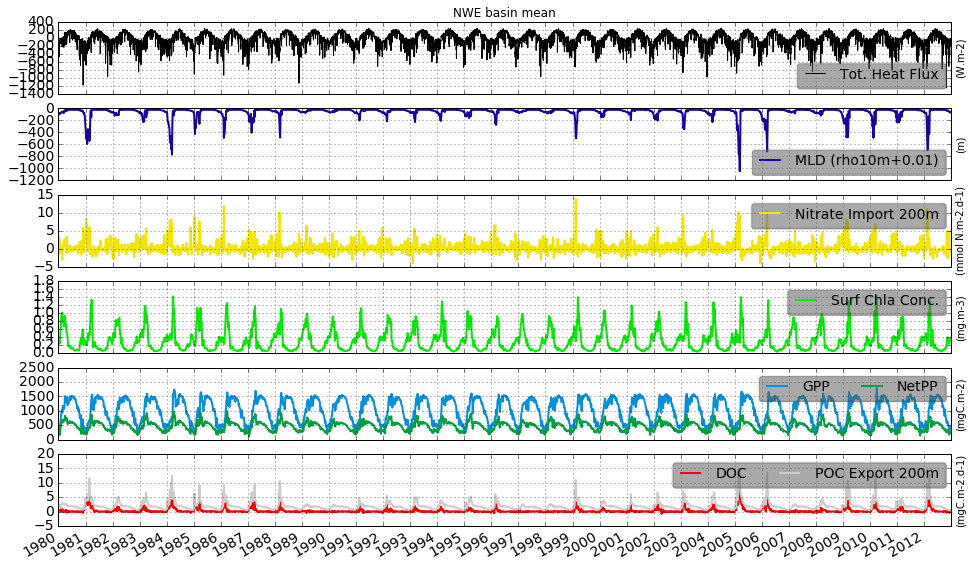

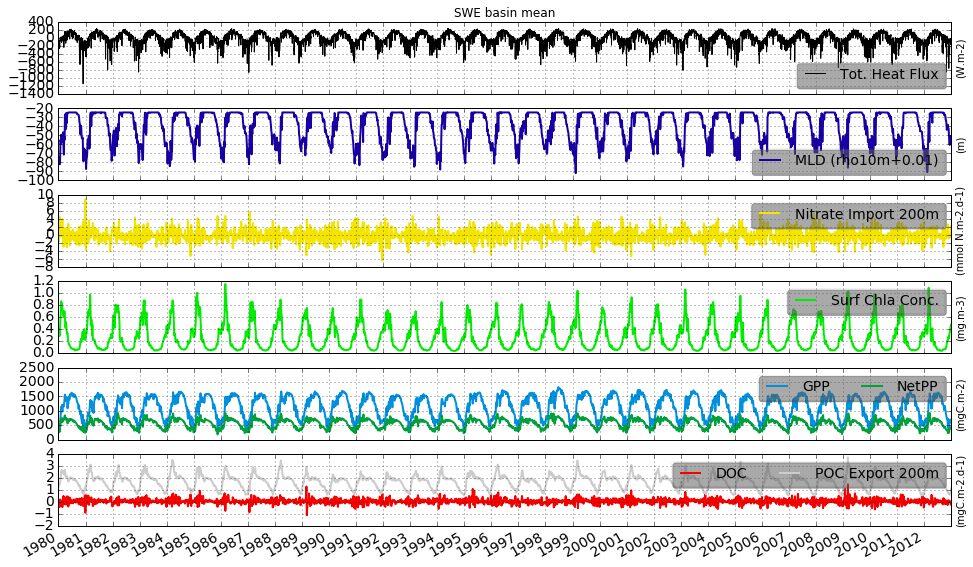

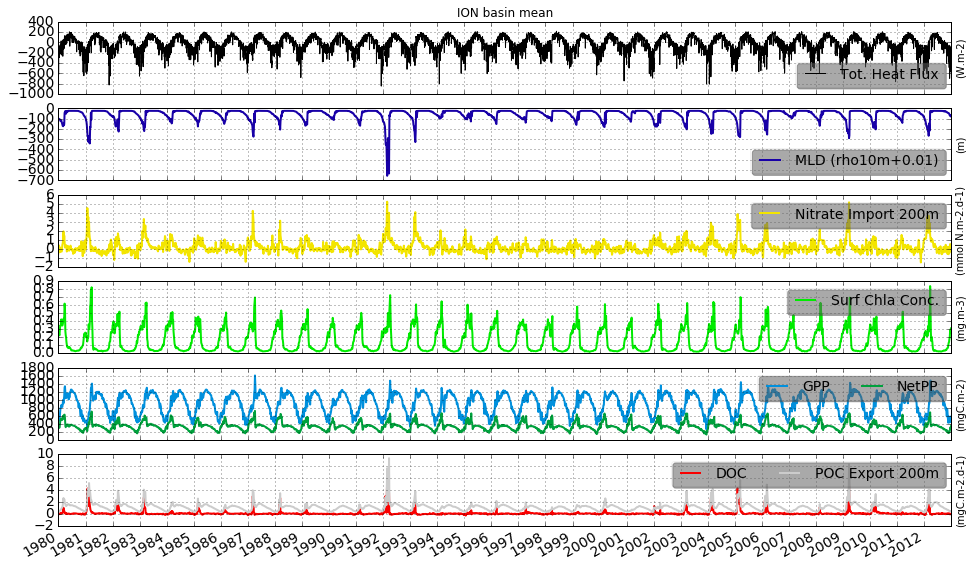

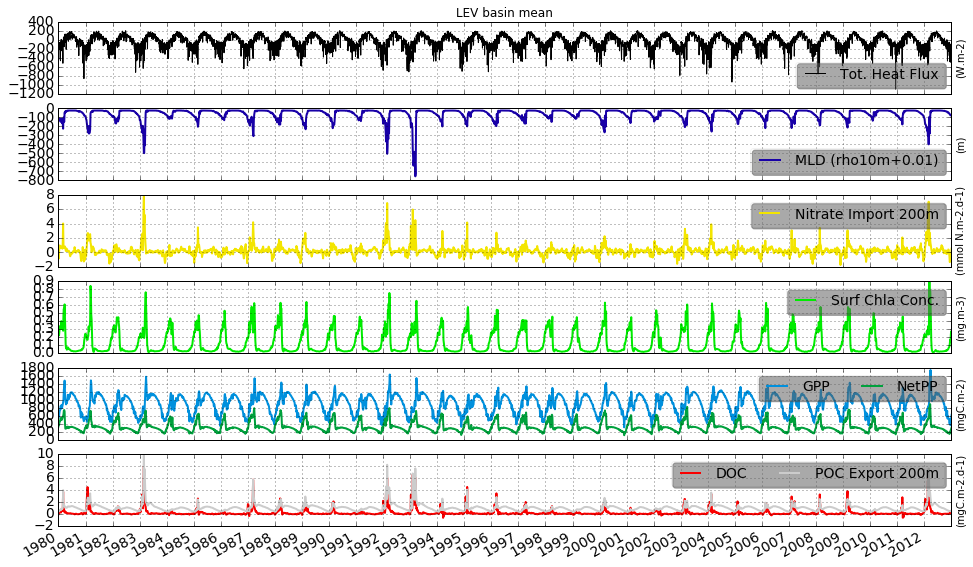

In [110]:
nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for basin in region_list:
    #c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, 8)))
    
    # heatflux
    plt.subplot(6, 1, 1)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'],color=next(our_colormap), label='Tot. Heat Flux')
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(W.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    eval('plt.title(\''+basin+' basin mean\')')
    
    # MLD
    plt.subplot(6, 1, 2)
    plt.plot(vars()['MLD_Mean_'+basin]['date'],-vars()['mld_caro_'+basin][basin],color=next(our_colormap), label='MLD (rho10m+0.01)',linewidth=2)
    #plt.plot(vars()['MLD_Mean_'+basin]['date'],vars()['MLD_Mean_'+basin]['var'],color='r', label='MLD Alex',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(m)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

    plt.subplot(6, 1, 5)
    plt.plot(dates2, vars()['ppb_2D_'+basin]['var'],color=next(our_colormap), label='GPP',linewidth=2)
    plt.plot(dates2, vars()['netppb_2D_'+basin]['var'],color=next(our_colormap), label='NetPP',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 4)
    plt.plot(dates2, vars()['chl_tot_2D_'+basin]['var'],color=next(our_colormap), label='Surf Chla Conc.',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mg.m-3)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 3)
    plt.plot(dates2, -vars()['export_nit_sw_2D_'+basin]['var'],color=next(our_colormap), label='Nitrate Import 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mmol N.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
#    ax2 = ax.twinx()
#    ax2.plot(dates2, vars()['export_pho_sw_2D_'+basin]['var'],color=next(our_colormap), label='export_pho',linewidth=2)
#    plt.gcf().autofmt_xdate()
    #plt.ylabel("(mgC.m-2.d-1)", fontsize=18)
#    plt.yticks(fontsize=14)
#    plt.xticks(fontsize=14)
#    plt.xlim(['1980-01-01', '2012-12-31'])
#    plt.grid()
#    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
#    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    plt.subplot(6, 1, 6)
    plt.plot(dates2, vars()['export_doc200_2D_'+basin]['var'],color=next(our_colormap), label='DOC',linewidth=2)
    plt.plot(dates2, vars()['export_poc200_2D_'+basin]['var'],color=next(our_colormap), label='POC Export 200m',linewidth=2)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.ylabel("(mgC.m-2.d-1)")
    ax.yaxis.set_label_position("right")
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid()
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    #eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
    
    #c += 1
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/'+basin+'_TS_Interann_Variab'+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [8]:
#file_path2 = '../DATA/LONG_SIMS/Best_BoostW/VarInt/'
file_path2 = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/'

nut_list = ['ppb', 'netppb', 'chl_tot', 'export_nit_sw', 'export_pho_sw', 'export_doc200', 'export_poc200']

for region in region_list:
    full_list2 = os.listdir(file_path2)
    full_list2.sort()

    all_list = list()  # here we preallocate an empty list

    for our_file in full_list2:
        for nutrient in nut_list:
            if fnmatch.fnmatch(our_file, nutrient + '_2D_' + region + '.csv'):  # modified to try on some files
                vars()[nutrient + '_csv'] = read_csv(file_path2+our_file)
                vars()[nutrient + '_2D_' + region] = pd.DataFrame(vars()[nutrient + '_csv']['var'])
                vars()[nutrient + '_2D_' + region]['date'] = vars()[nutrient + '_csv']['date']
                vars()[nutrient + '_2D_' + region]['date'] = pd.to_datetime(vars()[nutrient + '_2D_' + region]['date'],format='%Y-%m-%d')
                vars()[nutrient + '_2D_' + region]['yy'] = pd.DatetimeIndex(vars()[nutrient + '_2D_' + region]['date']).year
                
dates2 = vars()[nutrient + '_csv']['date']
dates2 = pd.to_datetime(dates2, format='%Y-%m-%d')

In [8]:
np.shape(dates2) # (3143,)
np.shape(MLD_Mean_ION) # (2445, 3)

(3143,)

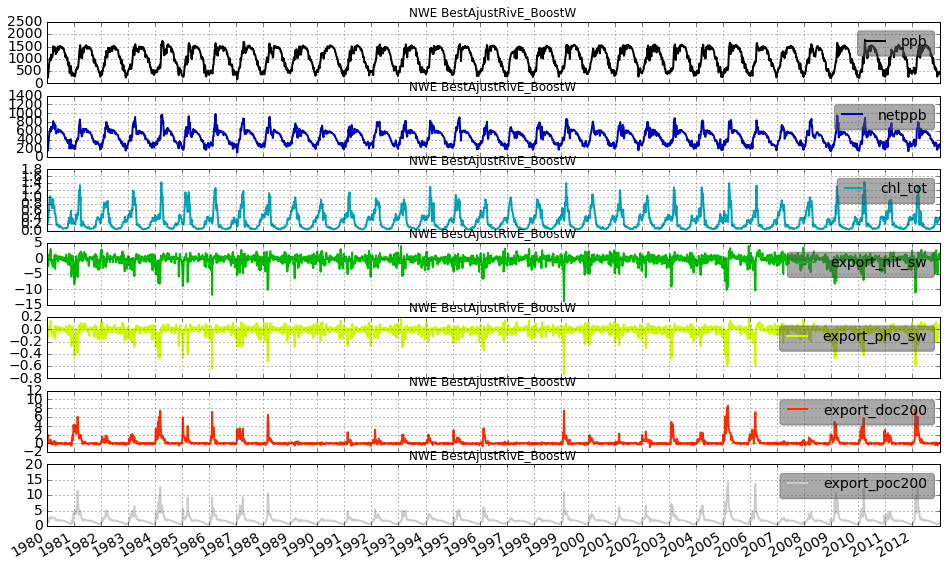

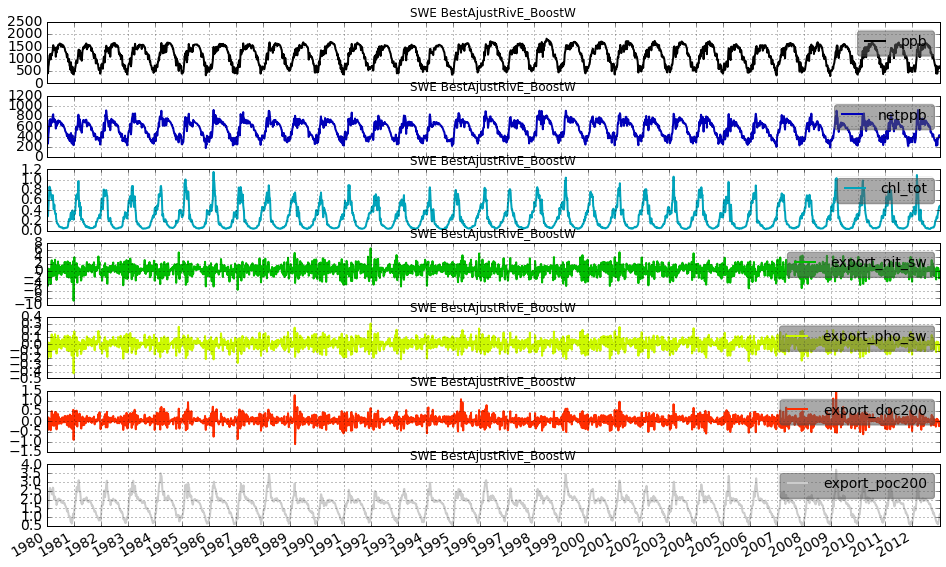

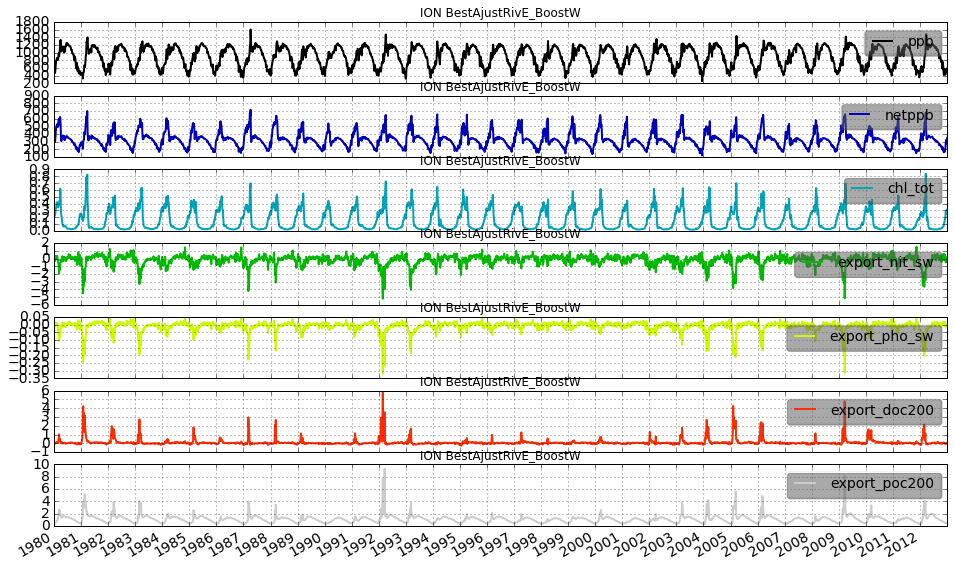

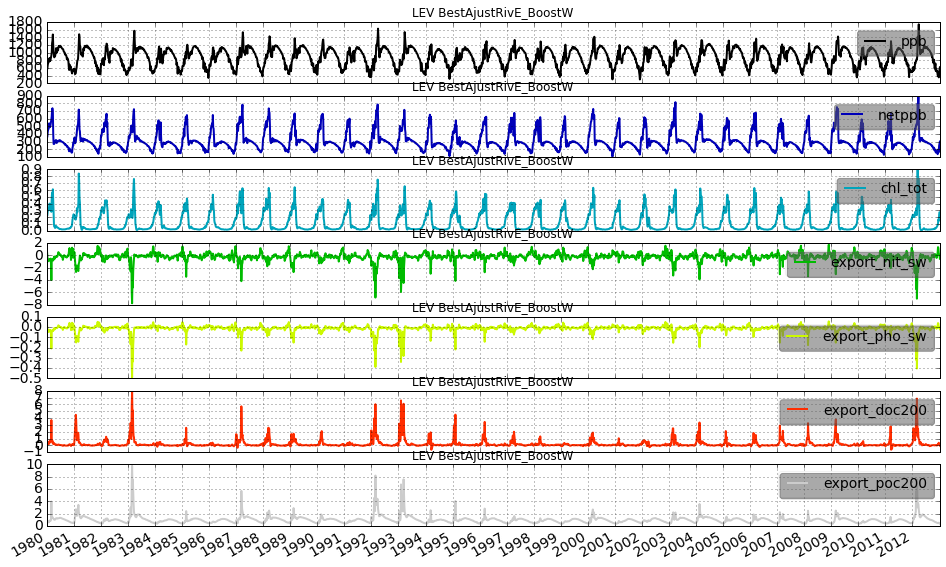

In [9]:
for basin in region_list:
    c = 1
    plt.figure(figsize=(16,10))
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, len(nut_list))))

    for var in nut_list:
        plt.subplot(len(nut_list), 1, c)
        eval('plt.plot(dates2, '+var+'_2D_'+basin+'[\'var\'],color=next(our_colormap), label=\''+var+'\',linewidth=2)')
        ax = plt.gca()
        ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
        plt.gcf().autofmt_xdate()
        #plt.ylabel("(mgC.m-2.d-1)", fontsize=18)
        plt.yticks(fontsize=14)
        plt.xticks(fontsize=14)
        plt.xlim(['1980-01-01', '2012-12-31'])
        plt.grid()
        leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
        leg.get_frame().set_alpha(0.05)
        eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')
        c += 1
        
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/'+basin+'_VarInt_BARE_BoostW'+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
### END OF THIS PART ###

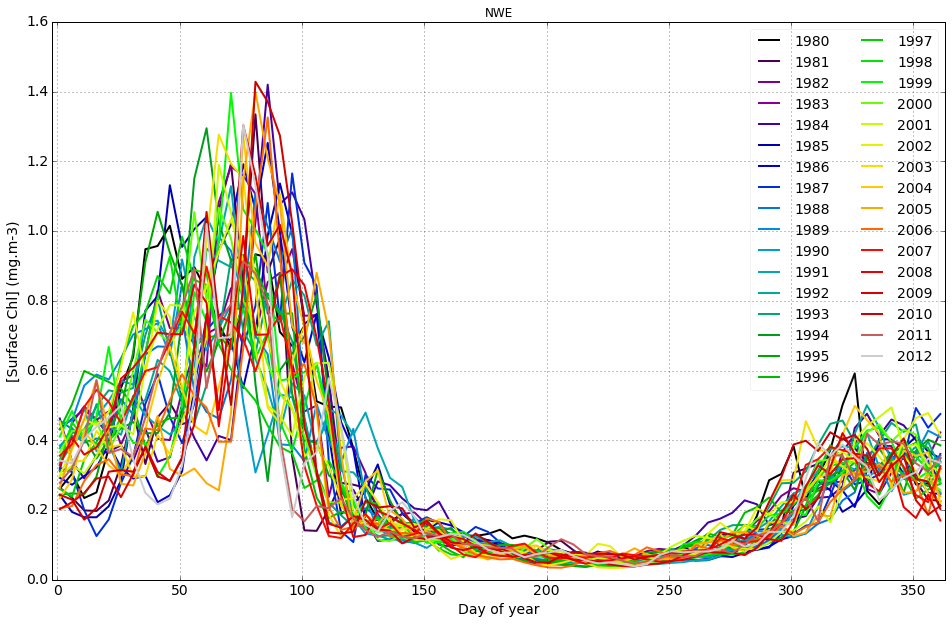

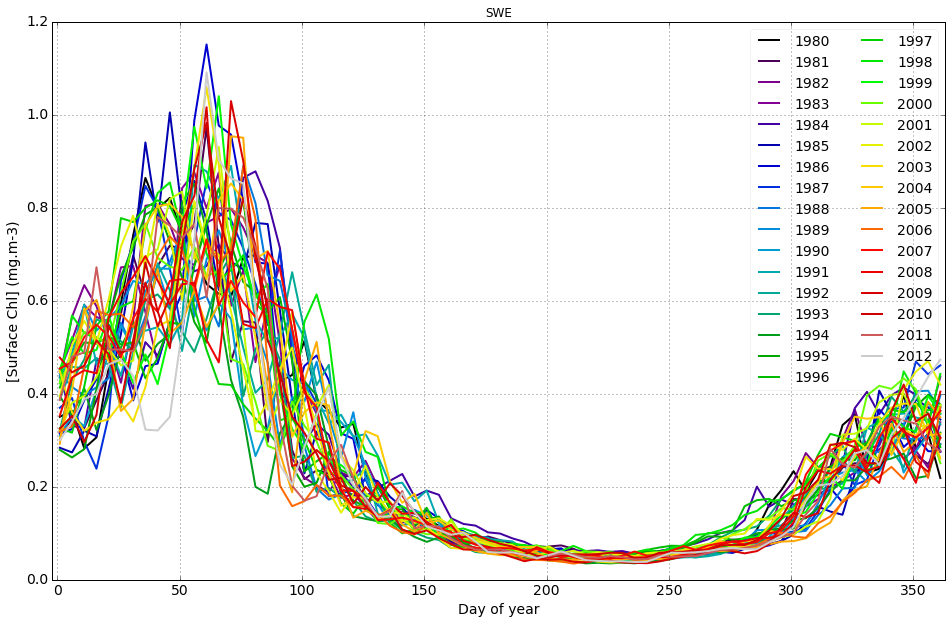

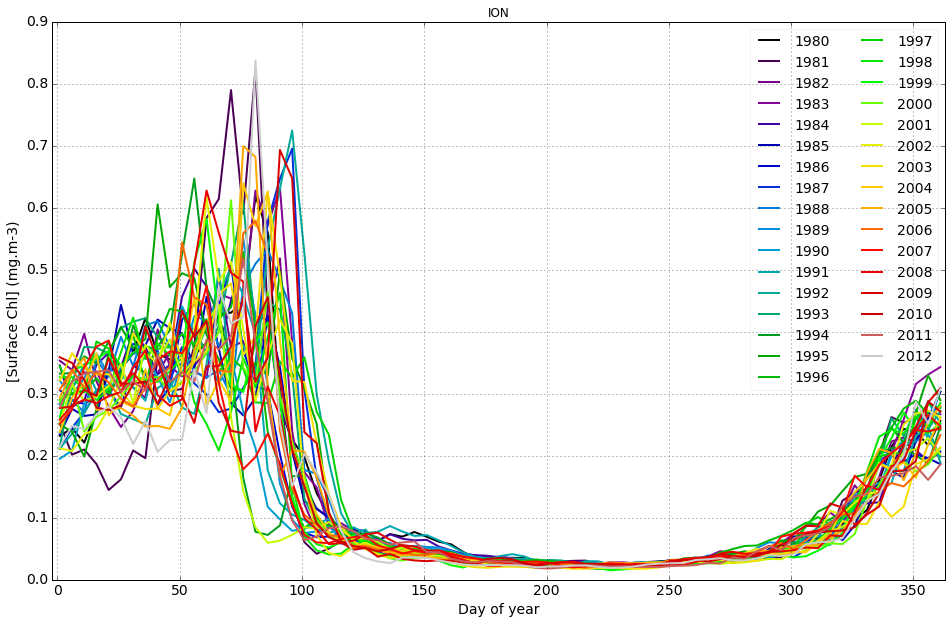

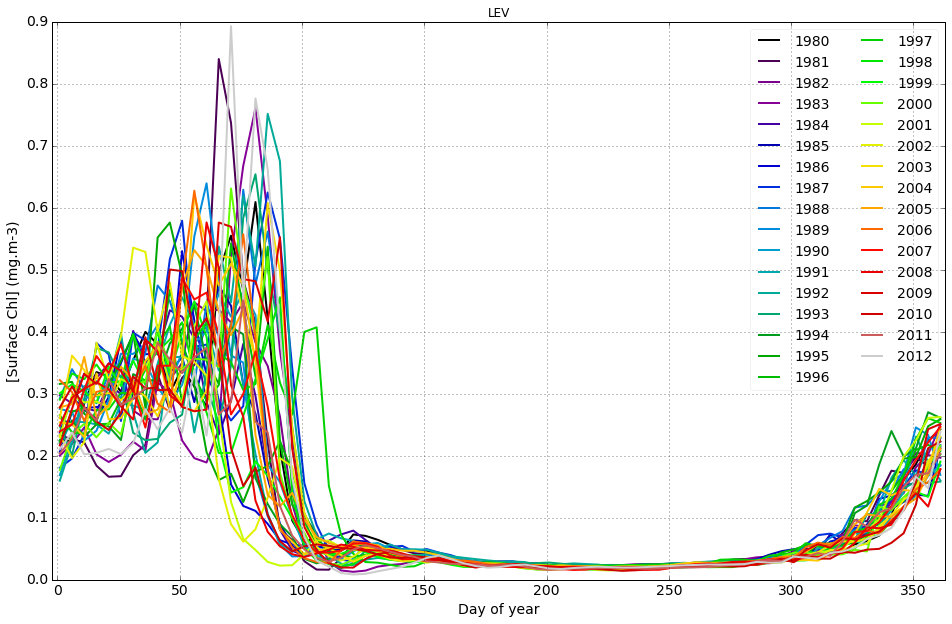

In [349]:
### CYCLE ANNUEL ###
var = 'chl_tot'
combine_date = np.arange(1,365,5) # this way we just plot "day of year"

for basin in region_list:
    plt.figure(figsize=(16,10)) # figsize=(16,10)
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, len(year_list))))

    for year in year_list:
        our_data = vars()['chl_tot_2D_'+basin].loc[vars()['chl_tot_2D_'+basin]['yy'] == year]
        
        if len(our_data) > len(date_test):
            our_data = our_data.drop(our_data.index[[73]])
            
        plt.plot(combine_date, our_data['var'],color=next(our_colormap), label=year,linewidth=2)

        #ax = plt.gca()
        #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
        #plt.gcf().autofmt_xdate()
        plt.ylabel("[Surface Chl] (mg.m-3)", fontsize=14)
        plt.xlabel("Day of year", fontsize=14)
        plt.yticks(fontsize=14)
        plt.xticks(fontsize=14)
        plt.xlim([-2, 363])
        plt.grid(True)
        #plt.legend( fontsize=14)
        leg = plt.legend(loc='upper right', ncol=2, fancybox=True, fontsize=14) #mode="expand", shadow=True,
        leg.get_frame().set_alpha(0.05)
        eval('plt.title(\''+basin+'\')')
        
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/ANNUAL_CYCLE_SURFCHL_raw_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [334]:
test2 = pd.DataFrame(test)
day_year = pd.DatetimeIndex.dayofyear(test2)
#day_year.head()

TypeError: 'property' object is not callable

In [ ]:
### END OF THIS PART ###

In [4]:
### INTERANNUAL VARIAB OF HEAT FLUXES ###

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'
nut_list = ['socelowf','soceshwf'] # 

for region in region_list:
    full_list = os.listdir(file_path)
    full_list.sort()

# Liste pour avoir le nombre total de fichiers à traiter de la simu (sur les 13 ans)
list_len = list() # here we preallocate an empty list

for file in full_list:
    if fnmatch.fnmatch(file, '*heatflux.nc'): 
        list_len.append(file)
            
len(list_len) # 528

528

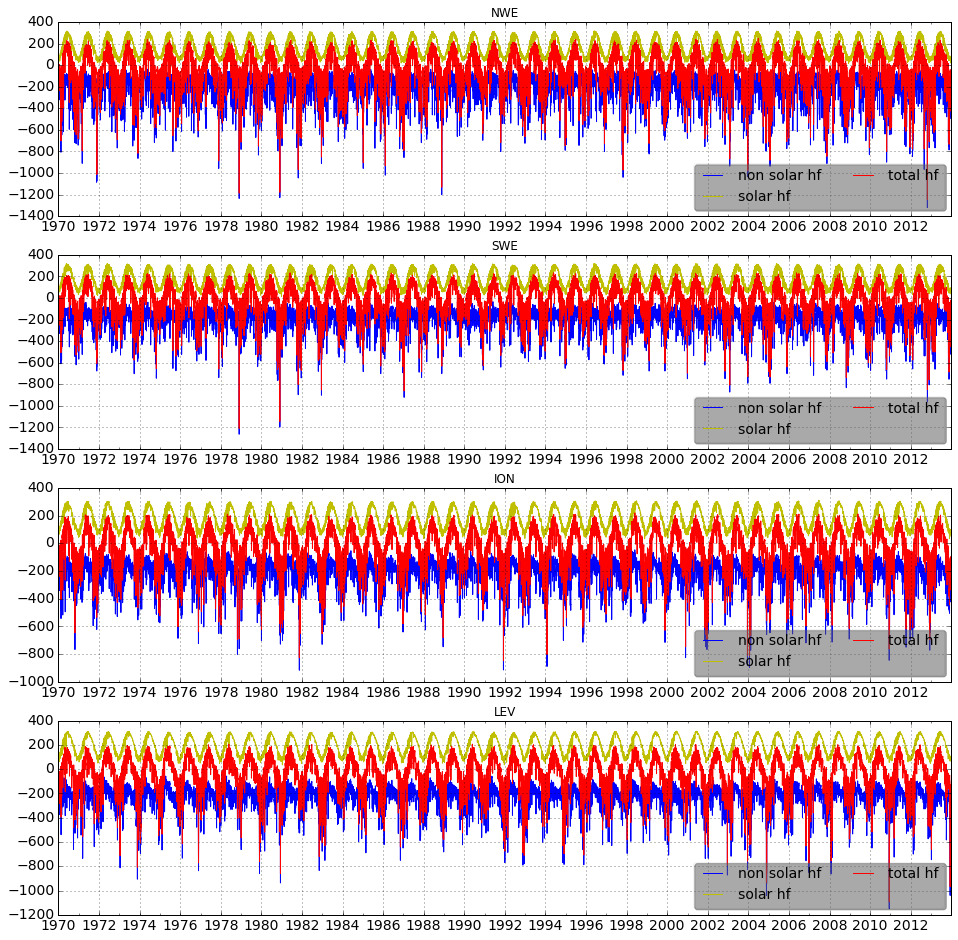

In [5]:
### INTERANNUAL VARIAB OF HEAT FLUXES ###

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'
nut_list = ['socelowf','soceshwf'] # 

for region in region_list:
    full_list = os.listdir(file_path)
    full_list.sort()

# Liste pour avoir le nombre total de fichiers à traiter de la simu (sur les 13 ans)
list_len = list() # here we preallocate an empty list

for file in full_list:
    if fnmatch.fnmatch(file, '*heatflux.nc'): 
        list_len.append(file)
            
len(list_len) # 528

import datetime
import time
import matplotlib.dates as mdates

test = np.arange(0,16071) # nb days 01/01/1970 -> 31/12/2013 ; 12419 if starts 01/01/1980
size = np.shape(test)
dates = range(0, size[0])
for o in range(0, size[0]):
    dates[o] = datetime.datetime.fromtimestamp(time.mktime(datetime.datetime.strptime
                                                           ("01/01/1970", "%d/%m/%Y").timetuple())+int(test[o])*86400)

# 
plt.figure(figsize=(16,16))
c = 1

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    vars()['heat_flux_'+basin] = pd.DataFrame(dates, columns=['date'])
    vars()['heat_flux_'+basin]['nonsolar_hf'] = vars()['all_df_socelowf_'+basin]
    vars()['heat_flux_'+basin]['solar_hf'] = vars()['all_df_soceshwf_'+basin]
    vars()['heat_flux_'+basin]['total_hf'] = vars()['heat_flux_'+basin]['nonsolar_hf']+vars()['heat_flux_'+basin]['solar_hf']
    
    # figure
    plt.subplot(len(region_list), 1, c)
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['nonsolar_hf'], '-b', label='non solar hf')
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['total_hf'], '-r', label='total hf')
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    #plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid(True)
    eval('plt.title(\''+basin+'\')')
    c += 1
#eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/All_Heat_Fluxes_4basins'+'.png\',bbox_inches=\'tight\',format=\'png\')')

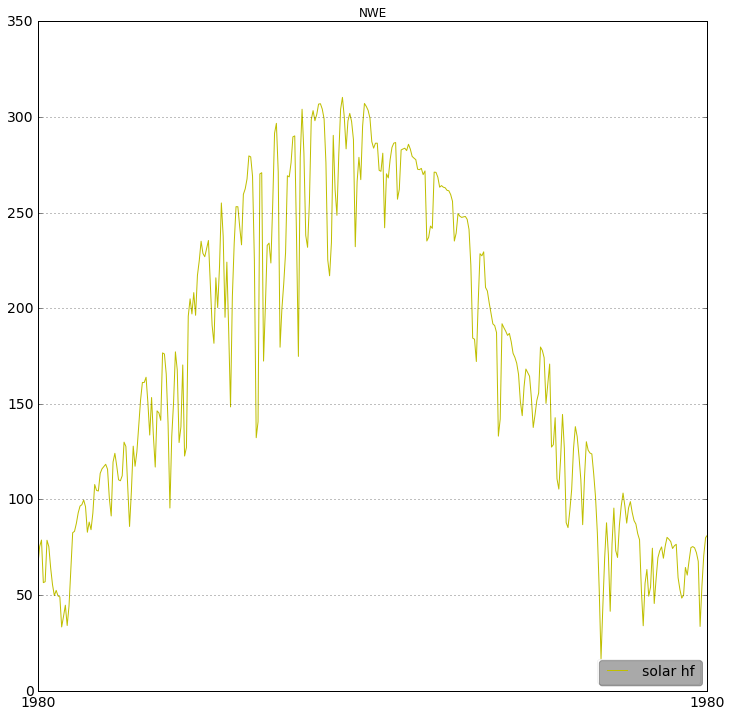

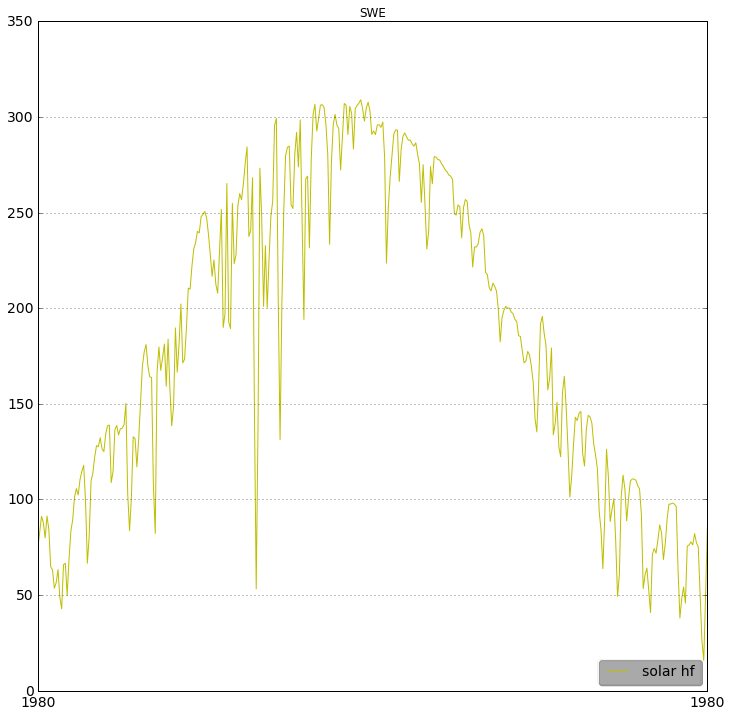

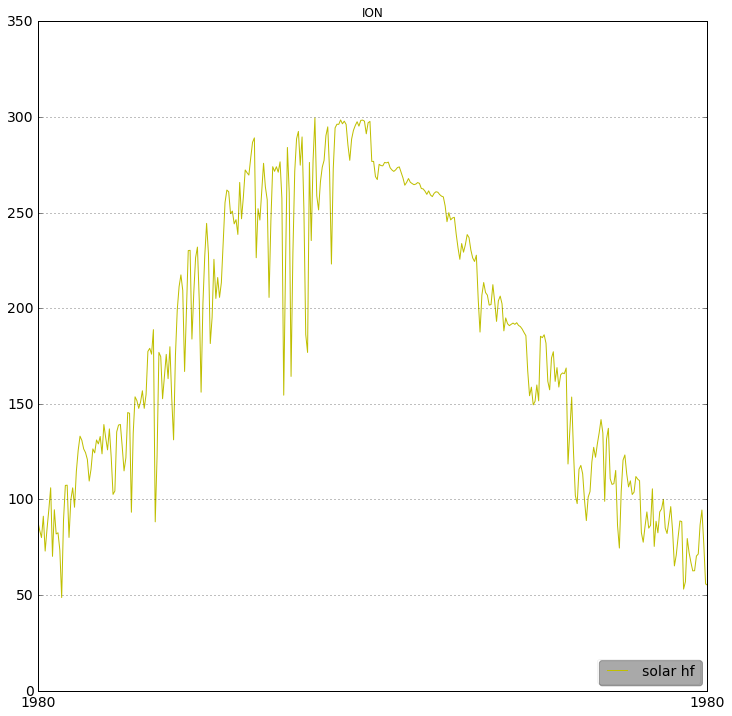

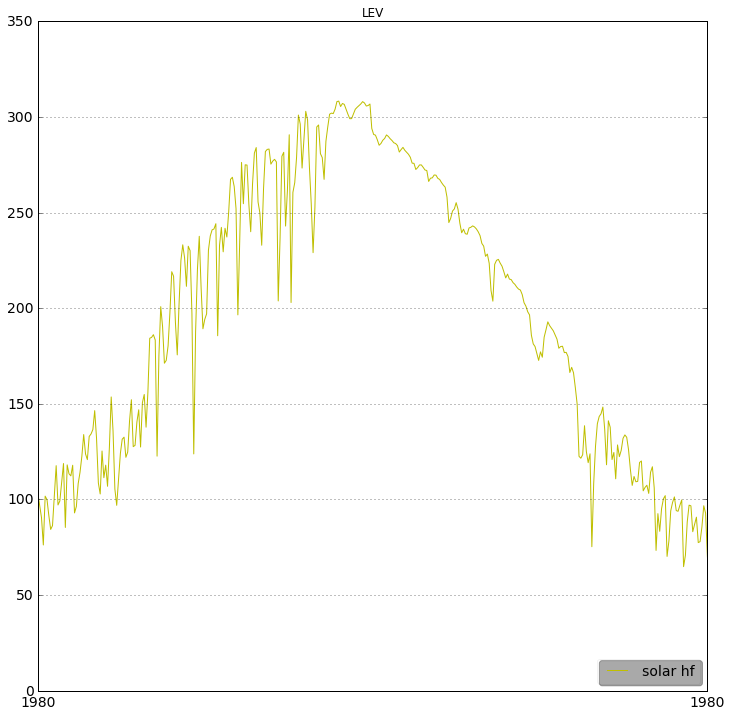

In [6]:
# 04/07 Test
c = 1

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    
    # figure
    plt.figure(figsize=(12,12))
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '1980-12-31'])
    plt.grid(True)
    eval('plt.title(\''+basin+'\')')
    c += 1

In [ ]:
# 11/07 removing trends and seasonality

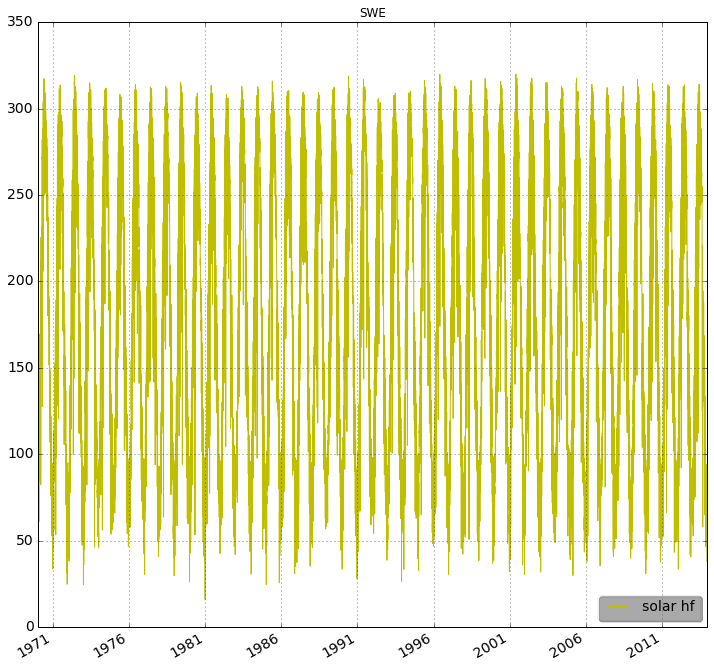

In [15]:
# 11/07 Test
c = 1
region_list = ['SWE']

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    
    # figure
    plt.figure(figsize=(12,12))
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    #ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    #plt.xlim(['1980-01-01', '1983-12-31'])
    plt.grid(True)
    eval('plt.title(\''+basin+'\')')
    c += 1

In [39]:
heat_flux_ION.head()

,date,nonsolar_hf,solar_hf,total_hf
0,1970-01-01,-192.691986,93.045540,-99.646446
1,1970-01-02,-170.618073,95.909370,-74.708702
2,1970-01-03,-124.898567,84.043167,-40.855400
3,1970-01-04,-108.406273,99.966942,-8.439331
4,1970-01-05,-117.185165,104.665497,-12.519669


In [10]:
type(heat_flux_SWE['date']) # pandas.core.series.Series

pandas.core.series.Series

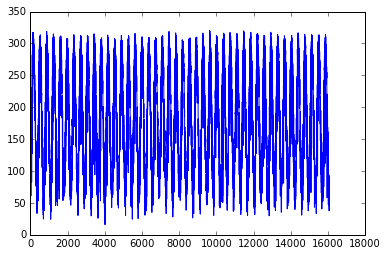

In [16]:
# same plot as before but with pyplot
pyplot.plot(heat_flux_SWE['solar_hf'])

In [ ]:
#from pandas import Series
from matplotlib import pyplot
#series = Series.from_csv('daily-minimum-temperatures.csv', header=0)
X = heat_flux_SWE['solar_hf']
diff = list()
days_in_year = 365

for i in range(days_in_year, len(X)):
    value = X[i] - X[i - days_in_year]
    diff.append(value)
pyplot.plot(diff)
pyplot.show()

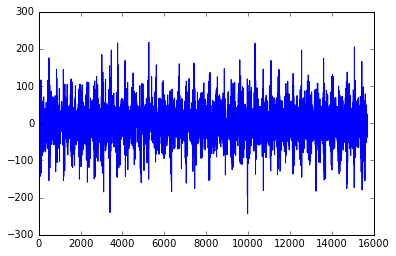

In [24]:
#from pandas import Series
from matplotlib import pyplot
#series = Series.from_csv('daily-minimum-temperatures.csv', header=0)
X = heat_flux_SWE['solar_hf']
diff = list()
days_in_year = 365

for i in range(days_in_year, len(X)):
    #print i, i - days_in_year
    value = X[i] - X[i - days_in_year]
    diff.append(value)
pyplot.plot(diff)
pyplot.show()

Coefficients: [ -6.52187243e-02   1.94684150e+02]


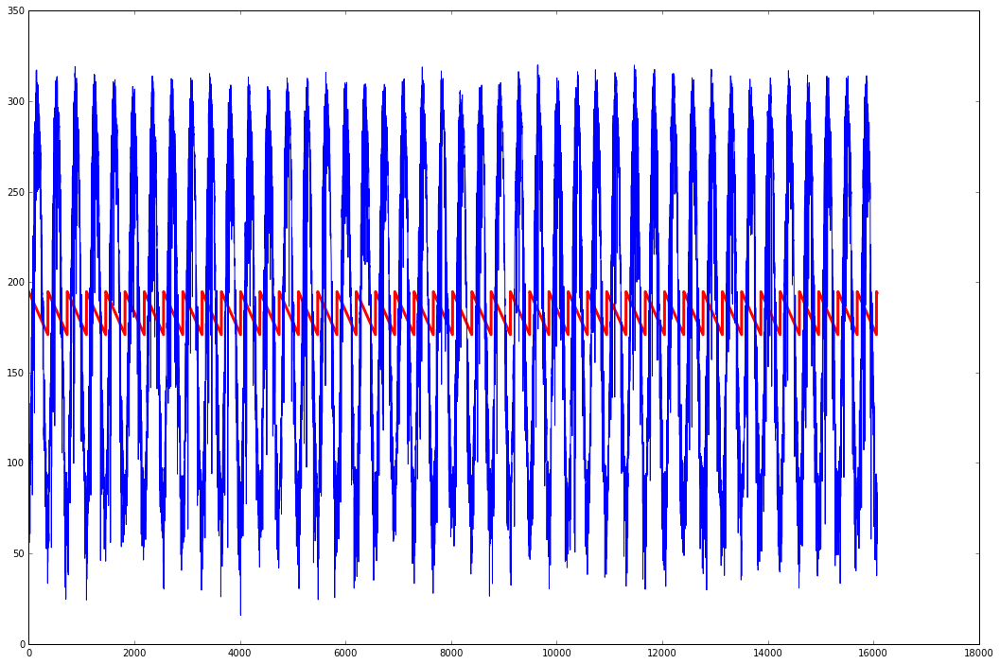

In [35]:
# Test model 

#from pandas import Series
from matplotlib import pyplot
from numpy import polyfit
#series = heat_flux_SWE
# fit polynomial: x^2*b1 + x*b2 + ... + bn
X = [i%365 for i in range(0, len(series))]
y = heat_flux_SWE['solar_hf'] # series.values
degree = 1
coef = polyfit(X, y, degree)
print('Coefficients: %s' % coef)
# create curve
curve = list()
for i in range(len(X)):
    value = coef[-1]
    for d in range(degree):
        value += X[i]**(degree-d) * coef[d]
        curve.append(value)
# plot curve over original data
plt.figure(figsize=(18,12))
pyplot.plot(curve, color='red', linewidth=3)

pyplot.plot(heat_flux_SWE['solar_hf'])
pyplot.show()

In [ ]:
# marche pas...

In [110]:
# 12/07/2018

date_1d = pd.date_range("19800101", freq='1D',periods=12220)
# date_1d[12215:] # ok DatetimeIndex(['2013-06-11', '2013-06-12', '2013-06-13', '2013-06-14', '2013-06-15'], [..]

year_list = np.arange(1980,2013)
region_names3 = ['SWE']

for region in region_names3:
    vars()[region+'_series'] = pd.DataFrame(date_1d, columns=['date'])
    vars()[region+'_series']['var'] = vars()['heat_flux_'+region]['solar_hf'] #[region+'_df'][0]
    vars()[region+'_series']['date'] = pd.to_datetime(vars()[region+'_series']['date'],format='%Y-%m-%d')
    vars()[region+'_series']['interp'] = pd.Series.interpolate(vars()[region+'_series']['var']) # method=linear
    vars()[region+'_series']['mm'] = pd.DatetimeIndex(vars()[region+'_series']['date']).month
    vars()[region+'_series']['yy'] = pd.DatetimeIndex(vars()[region+'_series']['date']).year
    
    vars()['man_df_'+region] = np.zeros([365,34])
    vars()['man_df_'+region][:] = np.nan
    vars()['man_df_'+region] = pd.DataFrame(vars()['man_df_'+region], columns=['1980','1981','1982','1983','1984',\
                                                                               '1985','1986','1987','1988','1989',\
                                                                               '1990','1991','1992','1993','1994',\
                                                                               '1995','1996','1997','1998','1999',\
                                                                               '2000','2001','2002','2003','2004',\
                                                                               '2005','2006','2007','2008','2009',\
                                                                               '2010','2011', '2012', '2013'])

    all_len = np.zeros([len(year_list)])
    all_len[:] = np.nan

    for year in year_list:
        vars()['our_df_'+region] = vars()[region+'_series'].loc[vars()[region+'_series']['yy'] == year]
        all_len[year-year_list[0]] = len(vars()['our_df_'+region])
    print ' '
    print all_len

    for year in year_list:
        vars()['temp_df_'+region] = vars()[region+'_series'].loc[vars()[region+'_series']['yy'] == year]
        vars()[region+'_df_'+str(year)] = np.zeros([365])
        vars()[region+'_df_'+str(year)][:] = np.nan

        if all_len[year-year_list[0]] == 366:
            print year
            vars()['new_df_'+region] = vars()['temp_df_'+region].drop(vars()['temp_df_'+region].index[59])
            vars()[region+'_df_'+str(year)][:] = vars()['new_df_'+region]['interp']
            vars()['man_df_'+region][str(year)] = vars()[region+'_df_'+str(year)]

        else:
            vars()[region+'_df_'+str(year)][:] = vars()['temp_df_'+region]['interp']
            vars()['man_df_'+region][str(year)] = vars()[region+'_df_'+str(year)]
    
#    year_list2 = [1970]
#    #c = 0
#
#    for year in year_list2:
#        vars()[region+'_df_'+str(year)] = np.zeros([365])
#        vars()[region+'_df_'+str(year)] = np.nan
#        vars()['temp_df_'+region] = vars()[region+'_series'].loc[vars()[region+'_series']['yy'] == year]
#
#    vars()['man_df_'+region]['1970'][165:] = vars()['temp_df_'+region]['interp']

    year_list2 = [2013]
    #c = 0

    for year in year_list2:
        vars()[region+'_df_'+str(year)] = np.zeros([365])
        vars()[region+'_df_'+str(year)] = np.nan
        vars()['temp_df_'+region] = vars()[region+'_series'].loc[vars()[region+'_series']['yy'] == year]

    vars()['man_df_'+region]['2013'][0:166] = vars()['temp_df_'+region]['interp']
    
print ' '
print 'END OF COMPUTING'

 
[ 366.  365.  365.  365.  366.  365.  365.  365.  366.  365.  365.  365.
  366.  365.  365.  365.  366.  365.  365.  365.  366.  365.  365.  365.
  366.  365.  365.  365.  366.  365.  365.  365.  366.]
1980
1984
1988
1992
1996
2000
2004
2008
2012
 
END OF COMPUTING


In [112]:
# Computing a mean annual cycle

for region in region_names3:
    vars()[region+'_nanmean'] = np.zeros([365]) # preallocating the mean array
    
    for i in np.arange(1, len(vars()['man_df_'+region])+1):
        moy_temp = np.nanmean(vars()['man_df_'+region][i-1:i])
        vars()[region+'_nanmean'][i-1] = moy_temp
        moy_temp = None
    
    vars()['man_df_'+region]['mean'] = vars()[region+'_nanmean']
    vars()['man_df_'+region]['day'] = np.arange(1, 366)

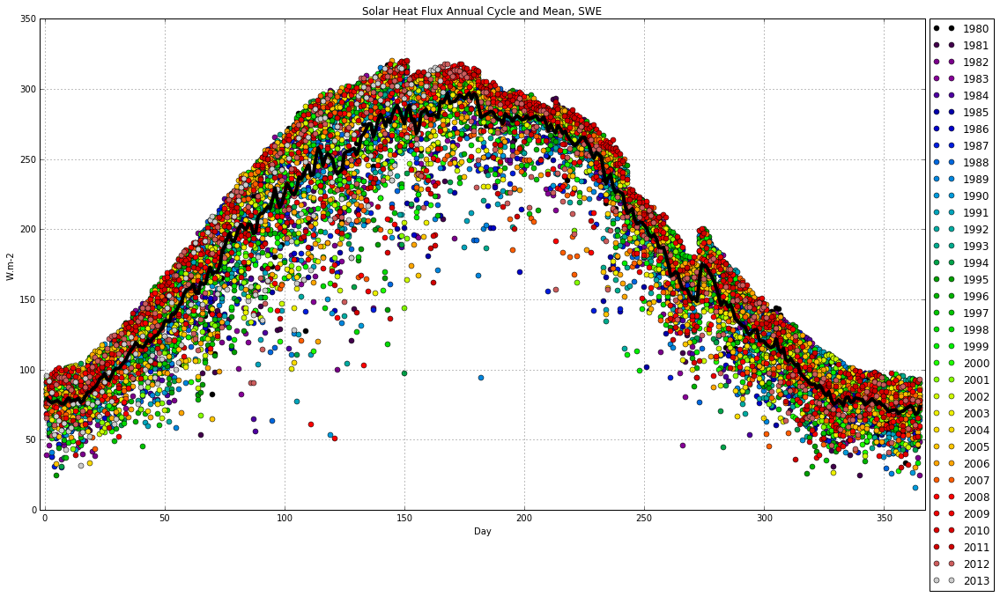

In [138]:
## FIG ANNUAL MEAN CYCLES

for region in region_names3:
    year_list = np.arange(1980,2014)
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, len(year_list))))
    plt.figure(figsize=[18,10])

    for year in year_list:    
        temp_col = next(our_colormap)
        plt.plot(vars()['man_df_'+region]['day'], vars()['man_df_'+region][str(year)], 'o',color=temp_col,label=str(year), linewidth=3)
        plt.grid(True)
        plt.legend(bbox_to_anchor=(1.005, 1), loc=2, borderaxespad=0.,fontsize=12)
        plt.xlim([-2,367])
        plt.ylabel('W.m-2')
        plt.xlabel('Day')

    plt.plot(vars()['man_df_'+region]['day'], vars()['man_df_'+region]['mean'], '-k',label='mean', linewidth=4)
    plt.title('Solar Heat Flux Annual Cycle and Mean, '+region)

In [120]:
# Calcul des anomalies

for region in region_names3:
    # preallocating arrays
    vars()['anom_df_'+region] = np.zeros([365,34])
    vars()['anom_df_'+region][:] = np.nan
    vars()['anom_df_'+region] = pd.DataFrame(vars()['anom_df_'+region], columns=['1980','1981','1982','1983','1984',\
                                                                               '1985','1986','1987','1988','1989',\
                                                                               '1990','1991','1992','1993','1994',\
                                                                               '1995','1996','1997','1998','1999',\
                                                                               '2000','2001','2002','2003','2004',\
                                                                               '2005','2006','2007','2008','2009',\
                                                                               '2010','2011', '2012', '2013'])

    year_list = np.arange(1980,2014)

    for year in year_list:
        for d in np.arange(0,365):
            if np.isnan(vars()['man_df_'+region][str(year)][d]) == False:
                anom_temp = (vars()['man_df_'+region][str(year)][d])-(vars()['man_df_'+region]['mean'][d])
                vars()['anom_df_'+region][str(year)][d] = anom_temp
                anom_temp = None

In [122]:
anom_df_SWE.head()

,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
0,1.489669,-5.563531,-4.286347,-40.710938,-11.113793,11.020866,11.412322,6.773361,-1.895547,-5.461831,...,7.070754,-5.816750,2.482650,-5.440728,-11.629563,-3.139519,-3.318734,11.811988,-14.165963,15.736045
1,-20.879767,-24.428992,8.335900,-31.675494,-0.130309,6.011354,13.713464,-15.168467,10.632035,-20.228736,...,16.687074,-8.834418,11.694459,-8.983016,2.609758,15.620889,8.852868,10.646959,-1.707129,14.275148
2,-38.447392,-17.486890,1.114989,-16.496781,4.559745,7.915618,11.593314,-38.388375,9.426566,-35.075753,...,15.265853,-1.708619,10.977271,-5.678262,9.548934,20.403022,14.639220,11.671851,-23.383496,7.096114
3,1.784256,-17.542019,3.126175,-9.399925,7.148163,12.068428,9.589096,-46.361847,2.716324,-25.489853,...,6.644432,-18.127930,-1.718071,5.523323,-3.519035,20.809372,13.173027,17.420090,-17.069931,-23.647018
4,5.819961,3.047432,-3.572937,-24.346543,11.627456,15.259002,5.856910,-26.766396,8.387779,11.183891,...,-3.994599,-45.285565,-9.767647,-3.679428,-5.136856,22.152603,4.239746,18.608658,11.508560,-11.191208


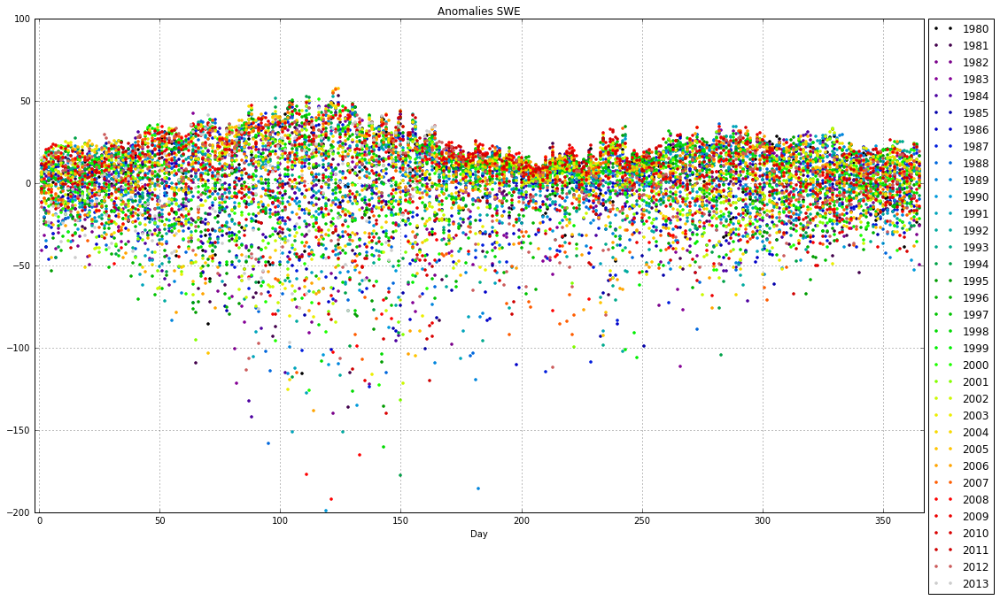

In [139]:
for region in region_names3:
    year_list = np.arange(1980,2014)
    spectr_col = plt.get_cmap('nipy_spectral')
    our_colormap = iter(spectr_col(np.linspace(0, 1, len(year_list))))
    plt.figure(figsize=[18,10])

    for year in year_list:    
        temp_col = next(our_colormap)
        plt.plot(vars()['man_df_'+region]['day'], vars()['anom_df_'+region][str(year)],'.',color=temp_col,label=str(year)) #,linewidth=4
        plt.grid(True)
        plt.legend(bbox_to_anchor=(1.005, 1), loc=2, borderaxespad=0.,fontsize=12)
        plt.xlim([-2,367])
        plt.xlabel('Day')
    plt.title('Anomalies '+region)

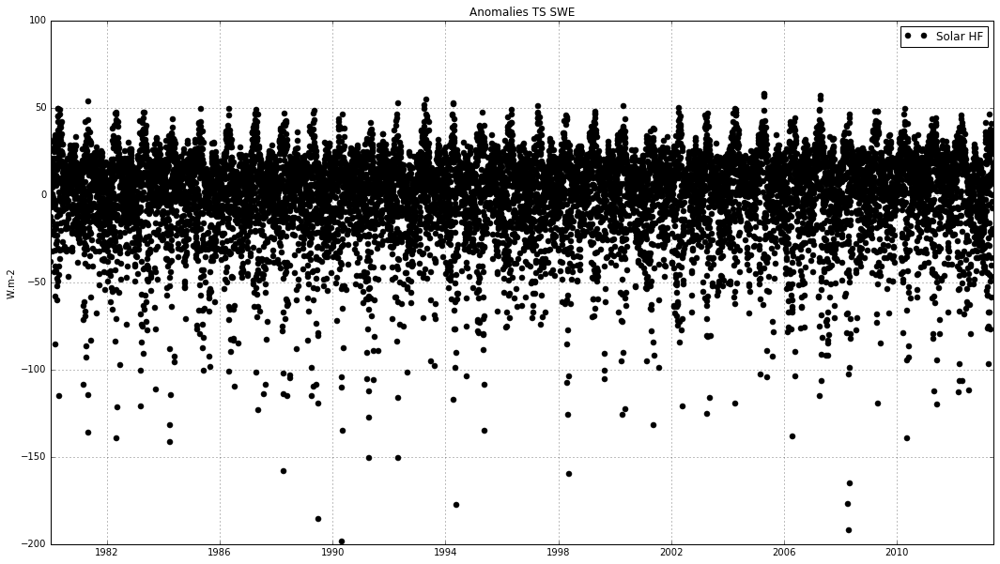

In [149]:
all_days = pd.date_range("19800101", freq='1D',periods=12410)

for region in region_names3:
    vars()['all_arr_'+region] = []

    for year in year_list:
        temp_arr = vars()['anom_df_'+region][str(year)]
        vars()['all_arr_'+region] = np.append(vars()['all_arr_'+region], temp_arr)
        
for region in region_names3:
    plt.figure(figsize=[18,10])
    plt.plot(all_days, vars()['all_arr_'+region], 'ok', label = 'Solar HF', linewidth=2)
    plt.grid(True)
    plt.legend()
    plt.ylabel('W.m-2')
    plt.title('Anomalies TS ' + region)

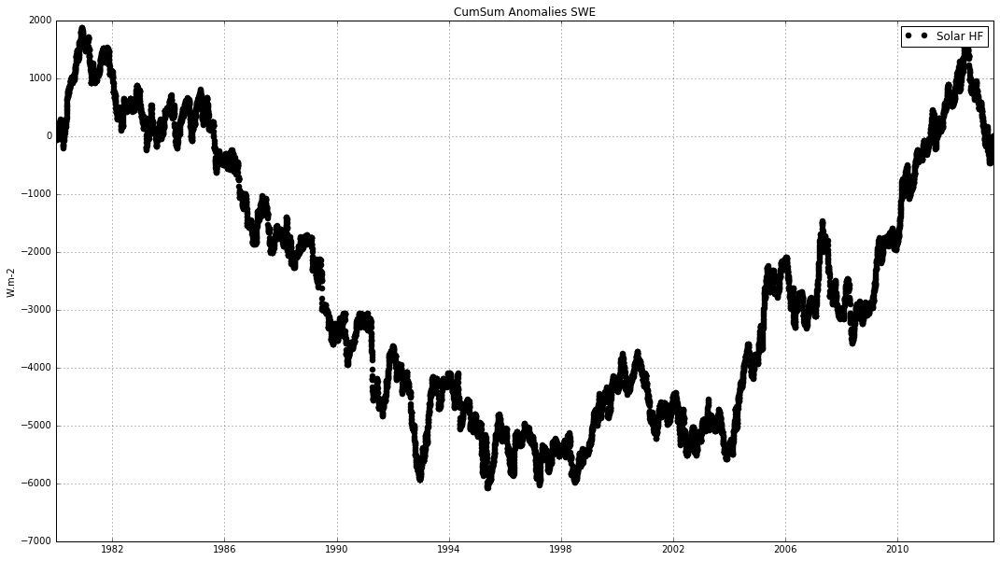

In [151]:
# cumsum
cumsum_SWE = np.cumsum(all_arr_SWE)
np.shape(cumsum_SWE)

for region in region_names3:
    plt.figure(figsize=[18,10])
    plt.plot(all_days, vars()['cumsum_'+region], 'ok', label = 'Solar HF', linewidth=2)
    plt.grid(True)
    plt.legend()
    plt.ylabel('W.m-2')
    plt.title('CumSum Anomalies ' + region)

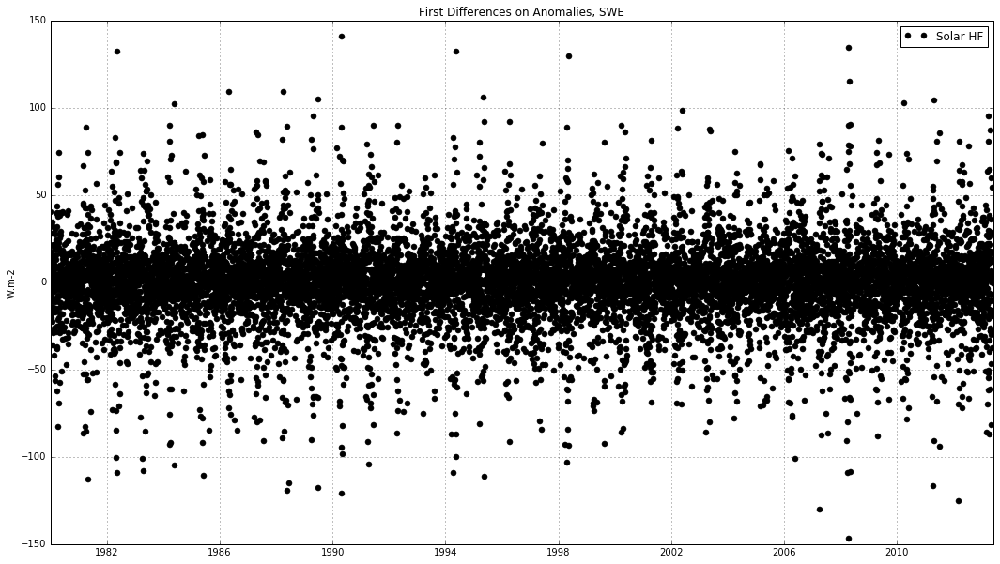

In [159]:
# diff
diff_SWE = np.diff(all_arr_SWE)

for region in region_names3:
    plt.figure(figsize=[18,10])
    plt.plot(all_days[1:], vars()['diff_'+region], 'ok', label = 'Solar HF', linewidth=2)
    plt.grid(True)
    plt.legend()
    plt.ylabel('W.m-2')
    plt.title('First Differences on Anomalies, ' + region)

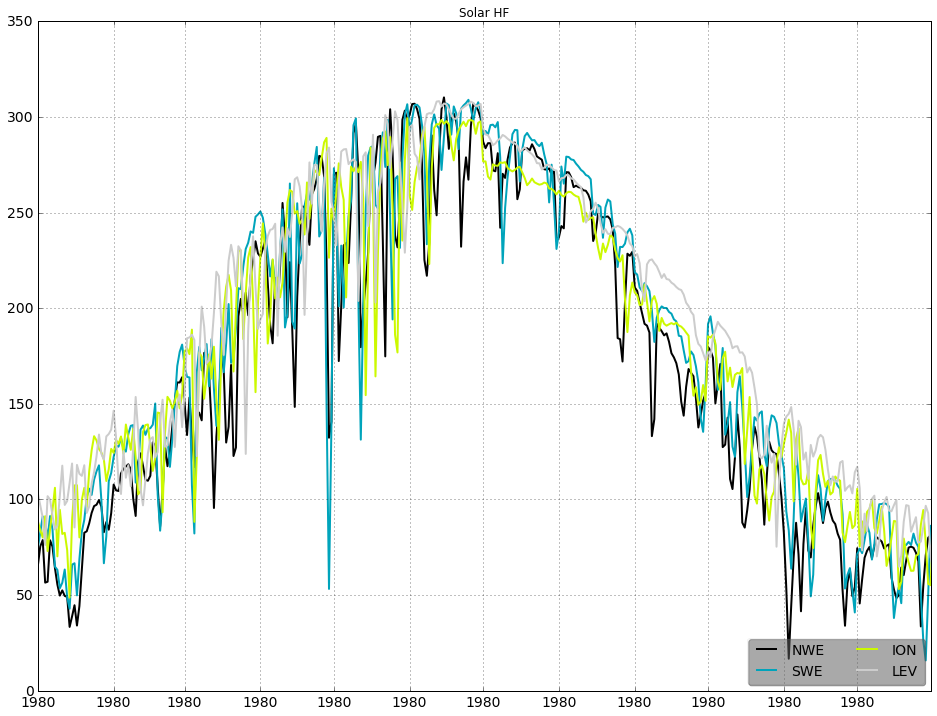

In [15]:
# 04/07 Test (OLD)

spectr_col = plt.get_cmap('nipy_spectral')
our_colormap = iter(spectr_col(np.linspace(0, 1, len(region_list))))
plt.figure(figsize=(16,12))
c = 1

for region in region_list:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    
    # figure
    #plt.figure(figsize=(12,12))
    #plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], color=next(our_colormap), label=basin,linewidth=2)
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
    #ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=0.5))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '1980-12-31'])
    plt.grid(True)
    plt.title('Solar HF')
    c += 1

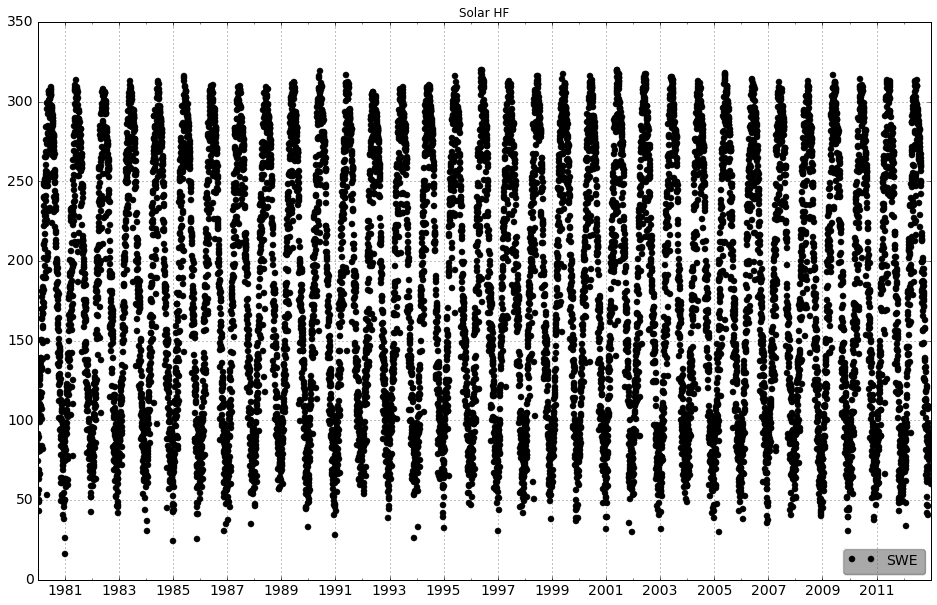

In [19]:
# 04/07 Test

spectr_col = plt.get_cmap('nipy_spectral')
our_colormap = iter(spectr_col(np.linspace(0, 1, len(region_list))))
plt.figure(figsize=(16,10))
c = 1
region_list2 = ['SWE']
for region in region_list2:
    for nutrient in nut_list:
        vars()['all_df_'+nutrient+'_'+region] = []
        for o,fn in enumerate(list_len):
            if region == 'NWE':
                y = [40,40,45,45];
                x = [0,9,9,0];
            elif region == 'SWE':
                y = [40,40,35,35];
                x = [1.5,9,9,1.5];
            elif region == 'ION':
                y = [30,38,38,40,40,30];
                x = [15,15,16,16,22.5,22.5];
            elif region == 'LEV':
                y = [30,35,35,39,39,30];
                x = [22.5,22.5,28,28,37,37];
            else:
                print 'Les coordonnées pour le nom de région : ', region, ' ne sont pas définies ici'
                
            # Selecting the data
            vertices = np.array([np.hstack((x, 0)),np.hstack((y, 0))],float).transpose();
            path = Path(vertices, codes=None, closed=True);
            indices = path.contains_points(np.array([np.reshape(lon_t,(np.size(lon_t))),np.reshape(lat_t,(np.size(lat_t)))]).T,\
                            transform=None, radius=0.0)
            indices_re = np.reshape(indices,np.shape(lon_t))# this our mask for the zone
            
            f = Dataset(file_path+list_len[o], 'r') # open netcdf file
            vars()[nutrient+'_df_'+region] = f.variables[nutrient][:]
            temp_df = np.zeros([len(vars()[nutrient+'_df_'+region])])
            temp_df[:] = np.nan
            
            for i in np.arange(0,len(vars()[nutrient+'_df_'+region])):
                temp_df[i] = np.nanmean(np.ma.masked_array(vars()[nutrient+'_df_'+region][i,:,:],indices_re==False))
                
            # On append la temp_df sur la totale
            vars()['all_df_'+nutrient+'_'+region] = np.append(vars()['all_df_'+nutrient+'_'+region],temp_df)
        #basin_list # ['NWE', 'SWE', 'ION', 'LEV']
    basin = region
    
    # figure
    #plt.figure(figsize=(12,12))
    #plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'], '-y', label='solar hf')
    plt.plot(vars()['heat_flux_'+basin]['date'],vars()['heat_flux_'+basin]['solar_hf'],'o', color=next(our_colormap), label=basin,linewidth=2)
    leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=24))
    ax.xaxis.set_minor_locator(mdates.MonthLocator(interval=12))
    #plt.gcf().autofmt_xdate()
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    plt.xlim(['1980-01-01', '2012-12-31'])
    plt.grid(True)
    plt.title('Solar HF')
    c += 1

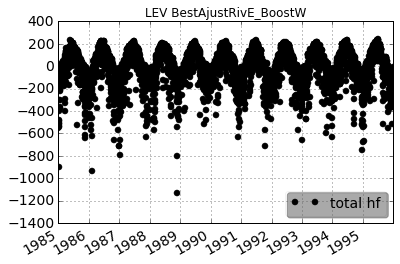

In [14]:
plt.figure() # figsize=(16,10)
# heatflux
plt.plot(heat_flux_NWE['date'],heat_flux_NWE['total_hf'],'ok', label='total hf')
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=12))
plt.gcf().autofmt_xdate()
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
plt.xlim(['1985-01-01', '1995-12-31'])
plt.grid()
leg = plt.legend(loc='lower right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
leg.get_frame().set_alpha(0.05)
eval('plt.title(\''+basin+' BestAjustRivE_BoostW\')')

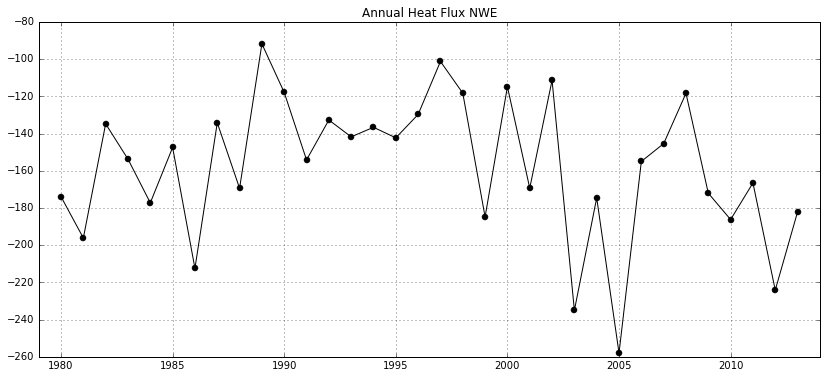

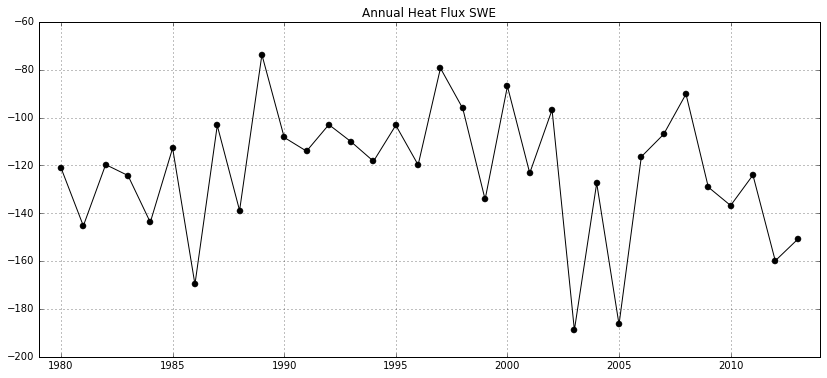

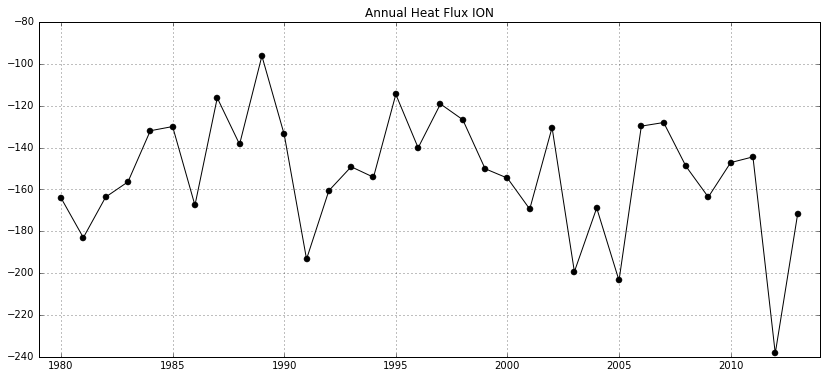

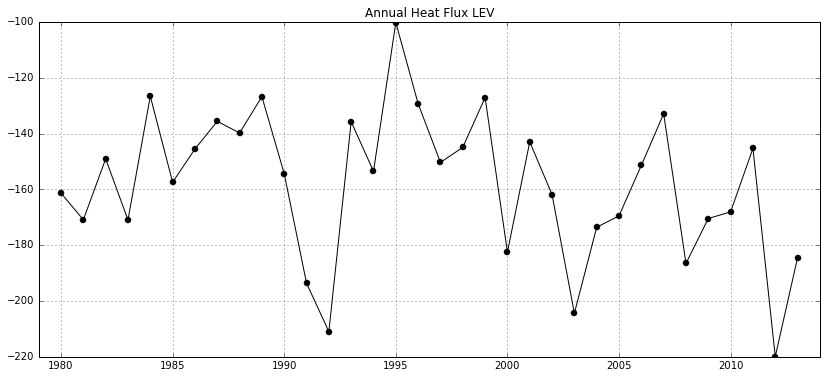

In [21]:
# annual heat flux
year_list = np.arange(1980,2014)

for basin in region_list:
    vars()['hf2_'+basin] = vars()['heat_flux_'+basin]
    vars()['hf2_'+basin]['yy'] = pd.DatetimeIndex(vars()['hf2_'+basin]['date']).year
    vars()['hf2_'+basin]['mm'] = pd.DatetimeIndex(vars()['hf2_'+basin]['date']).month
    
# Keeping only winter values
for basin in region_list:
    vars()['hf3_'+basin] = vars()['hf2_'+basin].loc[(vars()['hf2_'+basin]['mm']==1)|(vars()['hf2_'+basin]['mm']==2)|(vars()['hf2_'+basin]['mm']==12)]
    count = 0
    vars()['hf_mean_DJF_'+basin] = np.zeros([34])
    for y in year_list:
        vars()['hf_mean_DJF_'+basin][count] =  vars()['hf3_'+basin].groupby('yy')['total_hf'].mean()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, vars()['hf_mean_DJF_'+basin], '-ok')
    plt.grid(True)
    eval('plt.title(\'Annual Heat Flux '+basin+'\')')
    plt.xlim([1979,2014])
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_HF_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [22]:
np.shape(hf_mean_DJF_NWE) # (34,)

testt = np.vstack([hf_mean_DJF_NWE,hf_mean_DJF_SWE,hf_mean_DJF_ION,hf_mean_DJF_LEV])
np.shape(testt) # (4, 34)

hf_mean_DJF = testt.transpose()
hf_mean_DJF

# FINALLY
np.savetxt('hf_DJF_4zones.txt',hf_mean_DJF,delimiter=' ')  # => YES!

In [82]:
### CREATING A NEW MLD DJF txt FILE ###

file_path = '../DATA/LONG_SIMS/BestAjustRivE_BoostW/PHYSICS/'

MLD_DJF_df = pd.read_table(file_path+'result_mld_DJF',names=['year','month','day','NWE','SWE','ION','LEV'],delimiter='\s+')
#MLD_DJF_df.head()

#np.shape(MLD_DJF_df) #(613,7)
yy_corr = np.zeros([613])
yy_corr[:] = np.nan

for o in np.arange(0,len(MLD_DJF_df)):
    if MLD_DJF_df['month'][o] == 12:
        yy_corr[o] = MLD_DJF_df['year'][o]+1
    else:
        yy_corr[o] = MLD_DJF_df['year'][o]
#yy_corr

MLD_DJF_df['yy_corr'] = yy_corr
MLD_DJF_df.head()
#MLD_DJF_df.tail(n=20) # seems ok!

,year,month,day,NWE,SWE,ION,LEV,yy_corr
0,1979,12,5,44.94510,54.02661,64.91634,71.97735,1980.0
1,1979,12,10,48.49299,54.64935,67.77658,72.52191,1980.0
2,1979,12,15,56.92070,58.77721,73.97026,86.76366,1980.0
3,1979,12,20,65.34586,56.65700,76.74568,81.42103,1980.0
4,1979,12,25,63.35500,63.54916,83.93745,93.28457,1980.0


In [83]:
region_list
year_list

array([1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990,
       1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001,
       2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
       2013])

(1979, 2014)

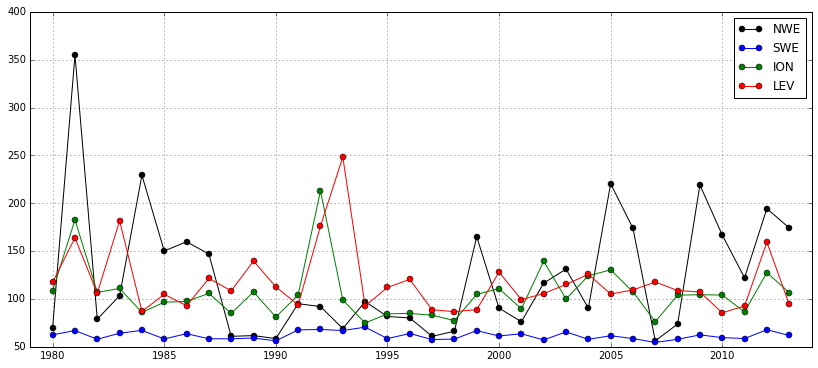

In [94]:
col_list = ['k','b','g','r']
count_col=0
plt.figure(figsize=(14,6))

# Keeping only winter values
for basin in region_list:
    count = 0
    vars()['MLD_mean_DJF_'+basin] = np.zeros([34])
    for y in year_list:
        vars()['MLD_mean_DJF_'+basin][count] =  MLD_DJF_df.groupby('yy_corr')[basin].mean()[y]
        count += 1
        
    # figure
    plt.plot(year_list, vars()['MLD_mean_DJF_'+basin], '-o',color=col_list[count_col],label=basin)
    #print count_col
    count_col += 1
plt.grid(True)    
plt.legend()
    #eval('plt.title(\'Annual Heat Flux '+basin+'\')')
plt.xlim([1979,2014])
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_HF_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')
    
# Saving txt file
MLD_stack = np.vstack([MLD_mean_DJF_NWE,MLD_mean_DJF_SWE,MLD_mean_DJF_ION,MLD_mean_DJF_LEV])
np.shape(MLD_stack) # (4, 34)


MLD_mean_DJF = MLD_stack.transpose()
MLD_mean_DJF
# FINALLY
#np.savetxt('MLD_DJF_4zones_Alex.txt',MLD_mean_DJF,delimiter=' ')  # => YES!

In [115]:
### Loop on ppb netppb and org ###
# mean, then min and max
var_list = ['ppb', 'netppb', 'export_nit_sw', 'export_pho_sw']
treat_list = ['mean', 'min', 'max'] # 'mean', 'min', 'max'
year_list = np.arange(1980,2014)

for var in var_list:
    for treatment in treat_list:
        #print treatment
        for basin in region_list:
            # NO DJF!!!
            #vars()[var+'_'+treatment+'_'+basin] = vars()[var+'_2D_'+basin]
            #vars()[var+'_'+treatment+'_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_'+treatment+'_'+basin]['date']).month
            #vars()[var+'_new_'+treatment+'_'+basin] = vars()[var+'_'+treatment+'_'+basin].loc[(vars()[var+'_'+treatment+'_'+basin]['mm']==1)|(vars()[var+'_'+treatment+'_'+basin]['mm']==2)|(vars()[var+'_'+treatment+'_'+basin]['mm']==12)]
            vars()[var+'_2D_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_2D_'+basin]['date']).month
            count = 0
            vars()[var+'_'+treatment+'_'+basin] = np.zeros([34])
            for y in year_list:
                if treatment == 'mean':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].mean()[y]
                elif treatment == 'min':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].min()[y]
                elif treatment == 'max':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].max()[y]
                else:
                    print 'treatment not properly defined'
                count += 1
            #print var+'_'+treatment+'_'+basin
            
for var in var_list:
    for treatment in treat_list:
        # Saving txt file
        temp_stack = np.vstack([vars()[var+'_'+treatment+'_NWE'],vars()[var+'_'+treatment+'_SWE'],vars()[var+'_'+treatment+'_ION'],vars()[var+'_'+treatment+'_LEV']])
        print 'temp_stack', np.shape(temp_stack) # (4, 34)

        vars()[var+'_'+treatment+'_tocorr'] = temp_stack.transpose()
        temp_stack = None
        # FINALLY
        eval('np.savetxt(\''+var+'_'+treatment+'_tocorr_4zones.txt\','+var+'_'+treatment+'_tocorr,delimiter=\' \')')  # => YES!

temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)
temp_stack (4, 34)


In [ ]:
export_doc200_2D_ION

In [7]:
### Loop on Org C ###
# mean, then min and max
var_list = ['export_doc200', 'export_poc200']
treat_list = ['mean', 'min', 'max'] # 'mean', 'min', 'max'
year_list = np.arange(1980,2014)

for var in var_list:
    for treatment in treat_list:
        #print treatment
        for basin in region_list:
            vars()[var+'_2D_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_2D_'+basin]['date']).month
            count = 0
            vars()[var+'_'+treatment+'_'+basin] = np.zeros([34])
            for y in year_list:
                if treatment == 'mean':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].mean()[y]
                elif treatment == 'min':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].min()[y]
                elif treatment == 'max':
                    vars()[var+'_'+treatment+'_'+basin][count] =  vars()[var+'_2D_'+basin].groupby('yy')['var'].max()[y]
                else:
                    print 'treatment not properly defined'
                count += 1
            
for var in var_list:
    for treatment in treat_list:
        # Saving txt file
        temp_stack = np.vstack([vars()[var+'_'+treatment+'_NWE'],vars()[var+'_'+treatment+'_SWE'],vars()[var+'_'+treatment+'_ION'],vars()[var+'_'+treatment+'_LEV']])
        #print 'temp_stack', np.shape(temp_stack) # (4, 34)

        vars()[var+'_'+treatment+'_tocorr'] = temp_stack.transpose()
        temp_stack = None
        # FINALLY
        #eval('np.savetxt(\''+var+'_'+treatment+'_tocorr_4zones.txt\','+var+'_'+treatment+'_tocorr,delimiter=\' \')')  # => YES!
    
print 'END of CELL'

END of CELL


In [16]:
# Export OC
for region in region_list:
    vars()['export_OC_'+region] = vars()['export_doc200_2D_'+region]
    vars()['export_OC_'+region]['var2'] = vars()['export_doc200_2D_'+region]['var'] + vars()['export_poc200_2D_'+region]['var']

In [126]:
export_OC_ION = export_doc200_2D_ION
export_OC_ION['var'] = export_OC_ION['var']+export_poc200_2D_ION['var']
export_OC_ION.tail() # OK!

,var,date,yy,mm
3138,3.457333,2013-05-30,2013,5
3139,3.348259,2013-06-04,2013,6
3140,3.250882,2013-06-09,2013,6
3141,3.231087,2013-06-14,2013,6
3142,3.299715,2013-06-15,2013,6


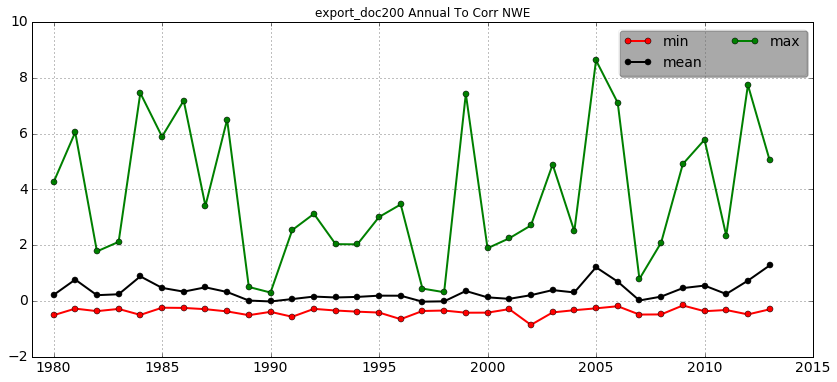

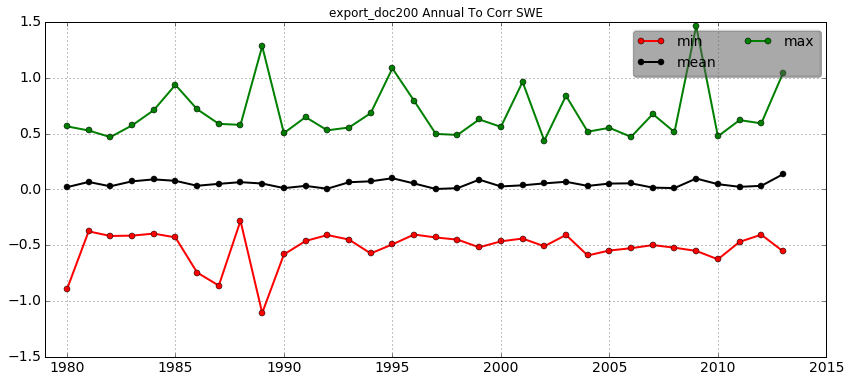

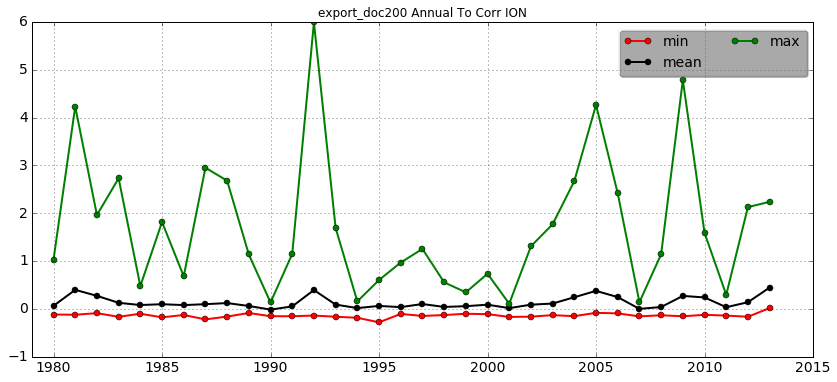

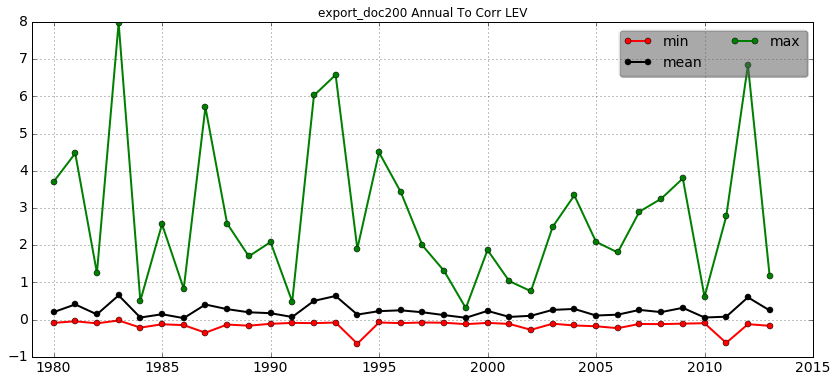

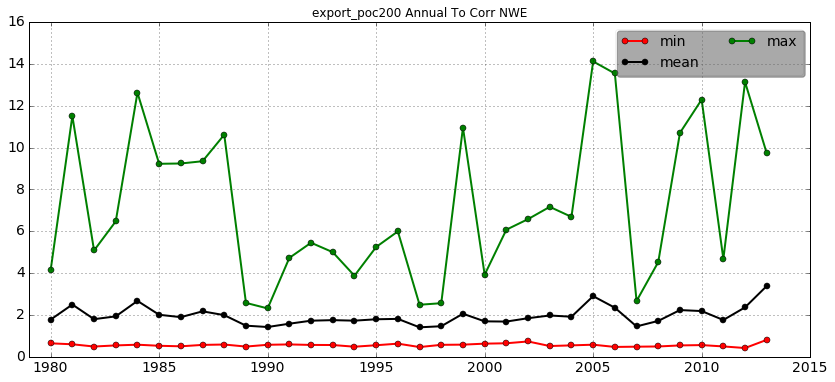

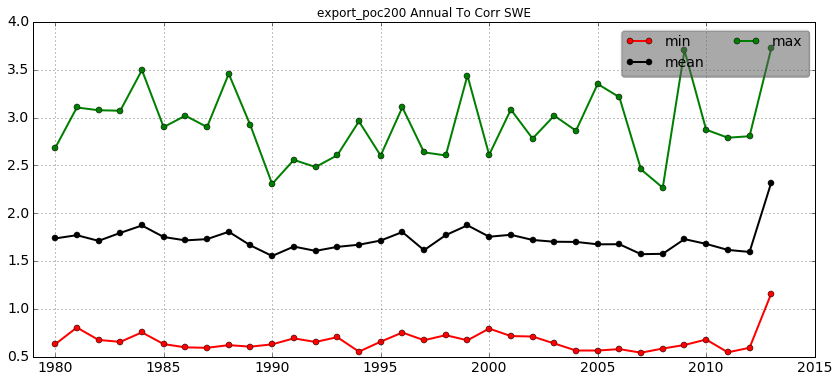

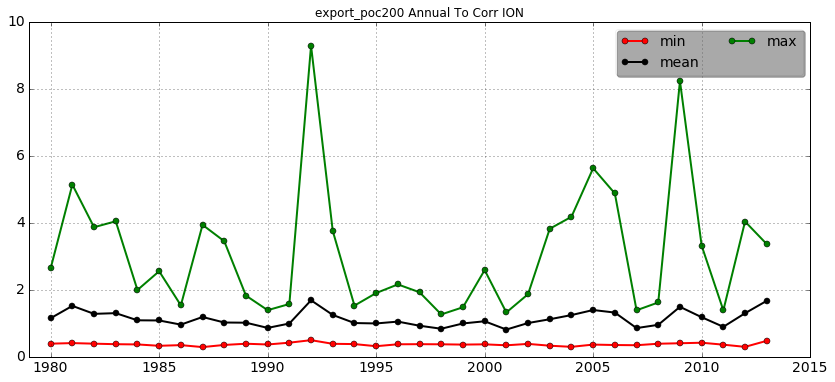

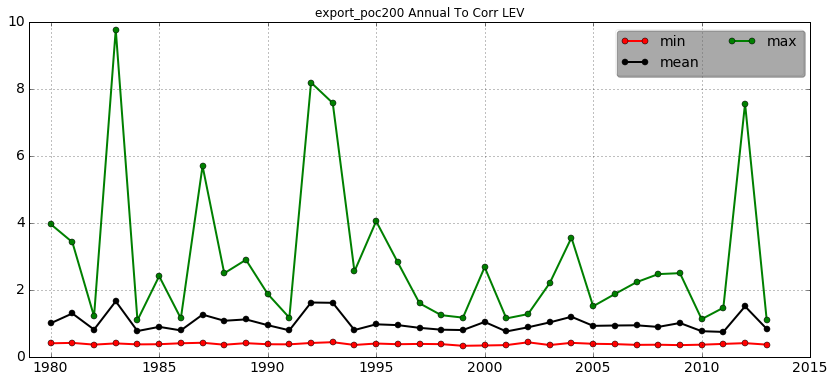

In [117]:
# All 3 series on the same fig
for var in var_list:
    for basin in region_list:
        plt.figure(figsize=(14,6))
        # figure
        plt.plot(year_list, vars()[var+'_min_'+basin], '-or', label='min', linewidth=2)
        plt.plot(year_list, vars()[var+'_mean_'+basin], '-ok', label='mean', linewidth=2)
        plt.plot(year_list, vars()[var+'_max_'+basin], '-og', label='max', linewidth=2)
        plt.grid(True)
        plt.yticks(fontsize=14)
        plt.xticks(fontsize=14)
        leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
        leg.get_frame().set_alpha(0.05)
        eval('plt.title(\''+var+' Annual To Corr '+basin+'\')')
        plt.xlim([1979,2015])

In [100]:
ppb_2D_ION

,var,date,yy,mm
0,NaN,1970-06-15,1970,6
1,1618.830078,1970-06-20,1970,6
2,1791.677612,1970-06-25,1970,6
3,1542.425659,1970-06-30,1970,6
4,1306.631104,1970-07-05,1970,7
5,1334.444214,1970-07-10,1970,7
6,1555.195435,1970-07-15,1970,7
7,1555.783936,1970-07-20,1970,7
8,1452.172974,1970-07-25,1970,7
9,1383.546143,1970-07-30,1970,7


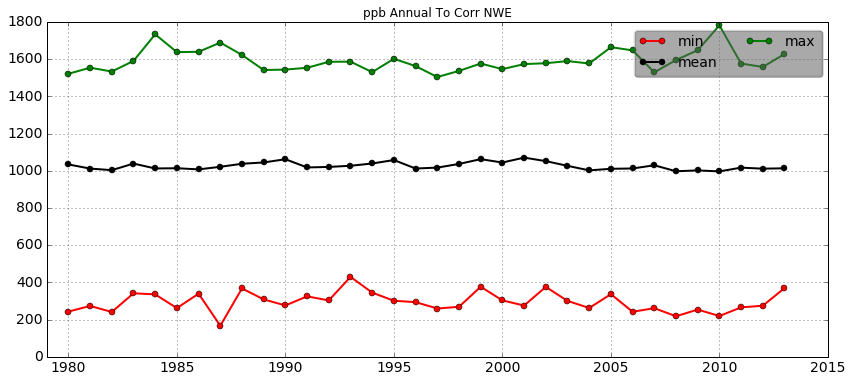

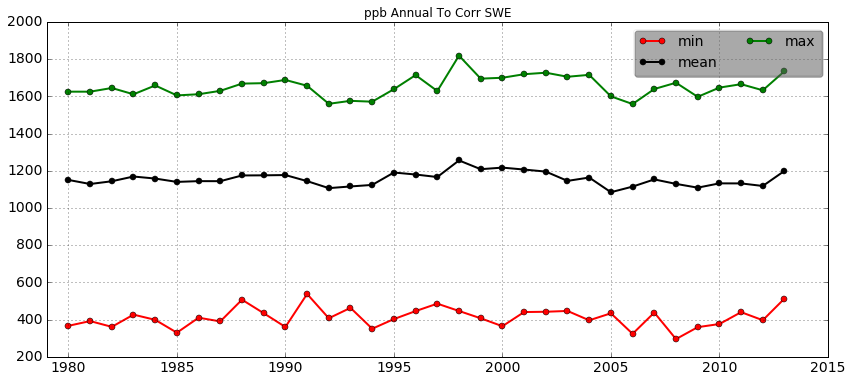

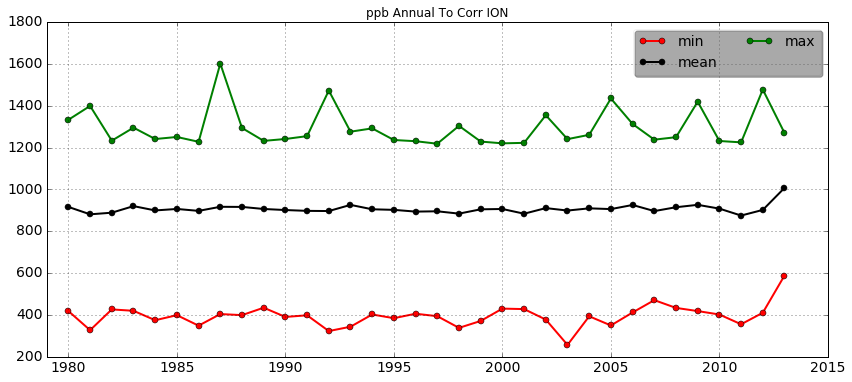

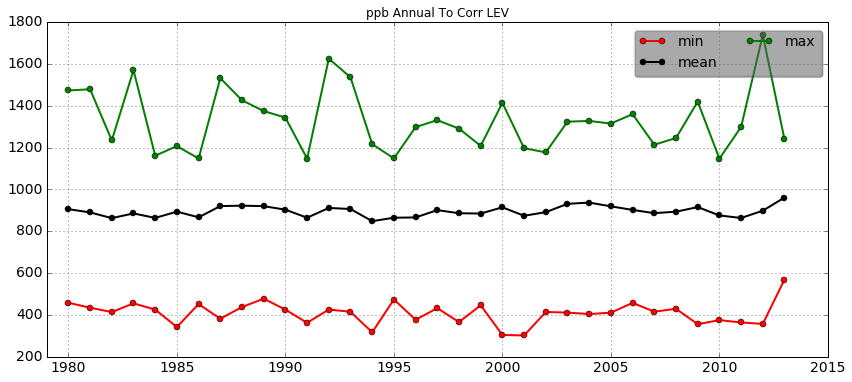

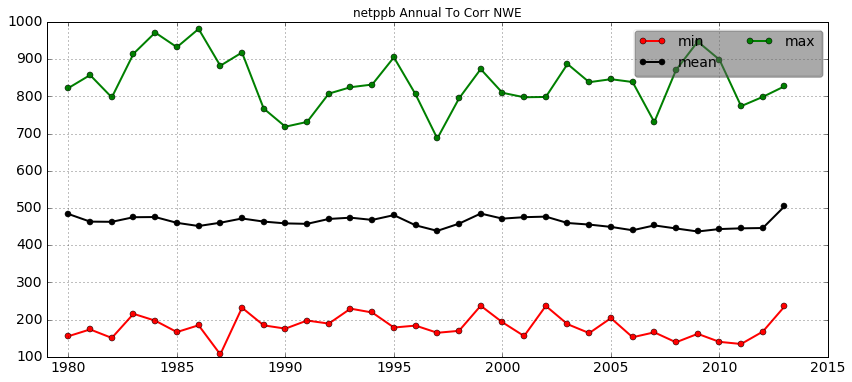

...

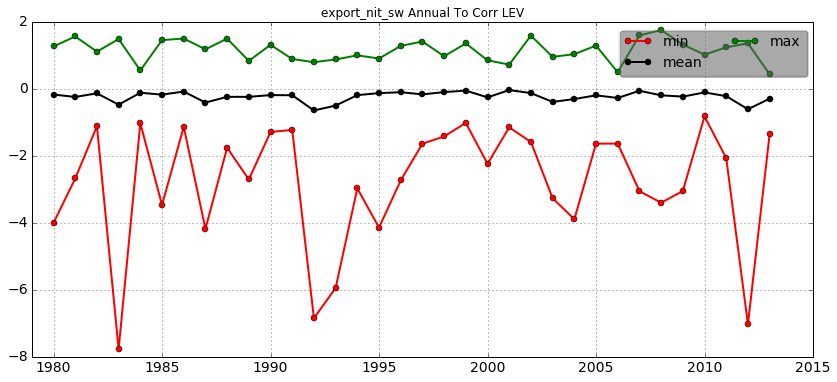

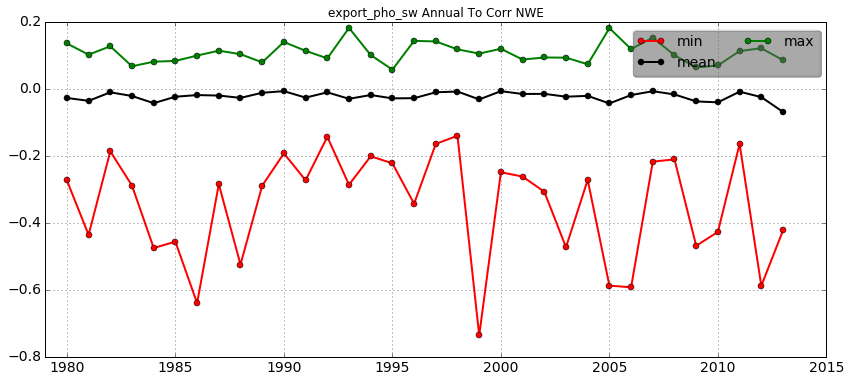

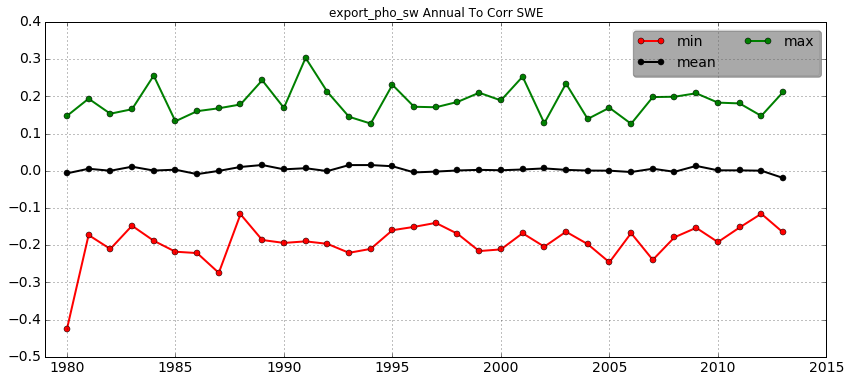

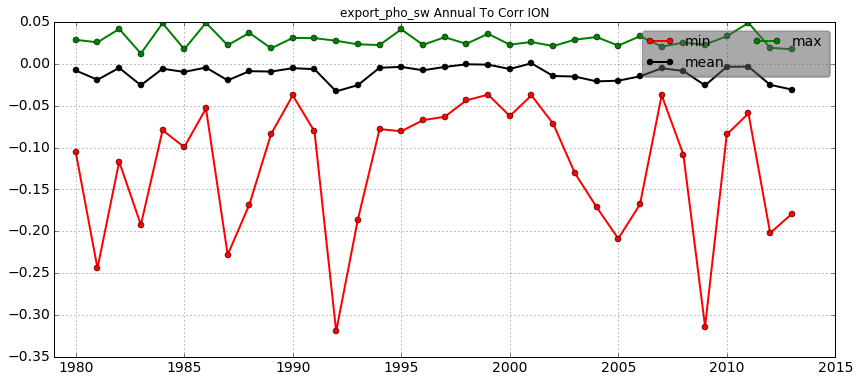

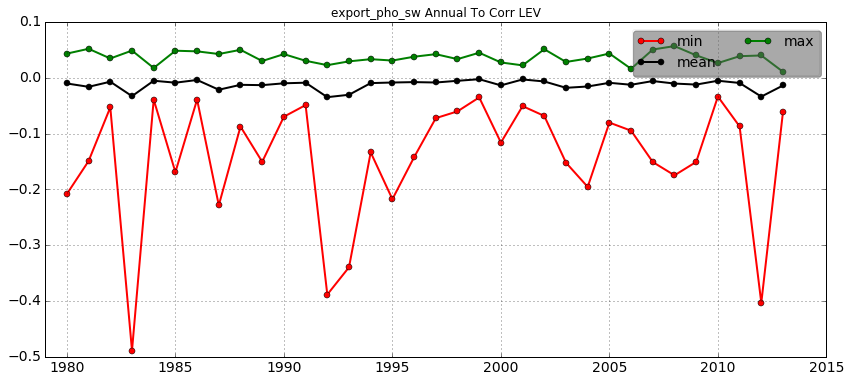

In [101]:
# All 3 series on the same fig
for var in var_list:
    for basin in region_list:
        plt.figure(figsize=(14,6))
        # figure
        plt.plot(year_list, vars()[var+'_min_'+basin], '-or', label='min', linewidth=2)
        plt.plot(year_list, vars()[var+'_mean_'+basin], '-ok', label='mean', linewidth=2)
        plt.plot(year_list, vars()[var+'_max_'+basin], '-og', label='max', linewidth=2)
        plt.grid(True)
        plt.yticks(fontsize=14)
        plt.xticks(fontsize=14)
        leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
        leg.get_frame().set_alpha(0.05)
        eval('plt.title(\''+var+' Annual To Corr '+basin+'\')')
        plt.xlim([1979,2015])
        eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/'+var+'_ToCorr_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [41]:
### Loop on ppb netppb and org ###
# mean, then min and max
var_list = ['export_doc200', 'export_poc200']
treat_list = ['mean', 'min', 'max'] # 'mean', 'min', 'max'
year_list = np.arange(1980,2014)

for var in var_list:
    for treatment in treat_list:
        #print treatment
        for basin in region_list:
            vars()[var+'_'+treatment+'_'+basin] = vars()[var+'_2D_'+basin]
            vars()[var+'_'+treatment+'_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_'+treatment+'_'+basin]['date']).month
            vars()[var+'_new_'+treatment+'_'+basin] = vars()[var+'_'+treatment+'_'+basin].loc[(vars()[var+'_'+treatment+'_'+basin]['mm']==1)|(vars()[var+'_'+treatment+'_'+basin]['mm']==2)|(vars()[var+'_'+treatment+'_'+basin]['mm']==12)]
            count = 0
            vars()[var+'_'+treatment+'_DJF_'+basin] = np.zeros([34])
            for y in year_list:
                if treatment == 'mean':
                    vars()[var+'_'+treatment+'_DJF_'+basin][count] =  vars()[var+'_new_'+treatment+'_'+basin].groupby('yy')['var'].mean()[y]
                elif treatment == 'min':
                    vars()[var+'_'+treatment+'_DJF_'+basin][count] =  vars()[var+'_new_'+treatment+'_'+basin].groupby('yy')['var'].min()[y]
                elif treatment == 'max':
                    vars()[var+'_'+treatment+'_DJF_'+basin][count] =  vars()[var+'_new_'+treatment+'_'+basin].groupby('yy')['var'].max()[y]
                else:
                    print 'treatment not properly defined'
                count += 1
            print var+'_'+treatment+'_DJF_'+basin

export_doc200_mean_DJF_NWE
export_doc200_mean_DJF_SWE
export_doc200_mean_DJF_ION
export_doc200_mean_DJF_LEV
export_doc200_min_DJF_NWE
export_doc200_min_DJF_SWE
export_doc200_min_DJF_ION
export_doc200_min_DJF_LEV
export_doc200_max_DJF_NWE
export_doc200_max_DJF_SWE
export_doc200_max_DJF_ION
export_doc200_max_DJF_LEV
export_poc200_mean_DJF_NWE
export_poc200_mean_DJF_SWE
export_poc200_mean_DJF_ION
export_poc200_mean_DJF_LEV
export_poc200_min_DJF_NWE
export_poc200_min_DJF_SWE
export_poc200_min_DJF_ION
export_poc200_min_DJF_LEV
export_poc200_max_DJF_NWE
export_poc200_max_DJF_SWE
export_poc200_max_DJF_ION
export_poc200_max_DJF_LEV


In [45]:
np.shape(export_doc200_new_max_LEV)
test = export_doc200_new_max_LEV

In [48]:
test.loc[test['mm']==12]['yy'] = test.loc[test['mm']==12]['yy']-1

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [49]:
test

,var,date,yy,mm
34,0.018300,1970-12-02,1970,12
35,0.025272,1970-12-07,1970,12
36,-0.097433,1970-12-12,1970,12
37,-0.084243,1970-12-17,1970,12
38,-0.043292,1970-12-22,1970,12
39,0.074324,1970-12-27,1970,12
40,0.077817,1971-01-01,1971,1
41,0.034471,1971-01-06,1971,1
42,0.033095,1971-01-11,1971,1
43,0.130976,1971-01-16,1971,1


In [28]:
### Loop on org C ###
# mean, then min and max
var_list = ['export_doc']
treat_list = ['max'] # 'mean', 'min', 'max'
year_list = np.arange(1980,2014)

for var in var_list:
    for treatment in treat_list:
        #
        print treatment
        for basin in region_list:
            vars()[var+'_'+treatment+'_'+basin] = vars()[var+'_2D_'+basin]
            #vars()['hf2_'+basin]['yy'] = pd.DatetimeIndex(vars()['hf2_'+basin]['date']).year
            vars()[var+'_'+treatment+'_'+basin]['mm'] = pd.DatetimeIndex(vars()[var+'_'+treatment+'_'+basin]['date']).month
            vars()[var+'_new_'+treatment+'_'+basin] = vars()[var+'_'+treatment+'_'+basin].loc[(vars()[var+'_'+treatment+'_'+basin]['mm']==1)|(vars()[var+'_'+treatment+'_'+basin]['mm']==2)|(vars()[var+'_'+treatment+'_'+basin]['mm']==12)]
            count = 0
            vars()[var+'_'+treatment+'_DJF_'+basin] = np.zeros([34])
            for y in year_list:
                vars()[var+'_'+treatment+'_DJF_'+basin][count] =  vars()[var+'_new_'+treatment+'_'+basin].groupby('yy')['var'].max()[y]
                #eval('vars()[var+'_'+treatment+\'_DJF_\'+basin][count] =  vars()[var+\'_new_\'+treatment+\'_\'+basin].groupby(\'yy\')[\'var\'].'+treatment+'()[y]')

                count += 1

            # figure
            plt.figure(figsize=(14,6))
            plt.plot(year_list, vars()[var+'_'+treatment+'_DJF_'+basin], '-ok')
            plt.grid(True)
            eval('plt.title(\''+var+'_'+treatment+'_DJF_'+basin+'\')')
            plt.xlim([1979,2015])
            #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_HF_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

ppb_new_mean_NWE


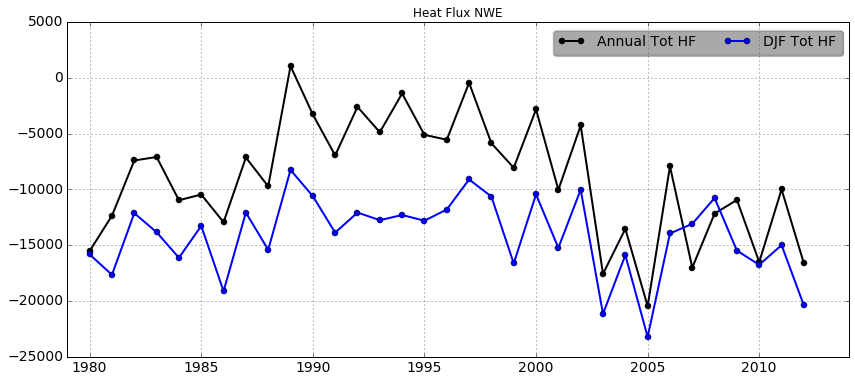

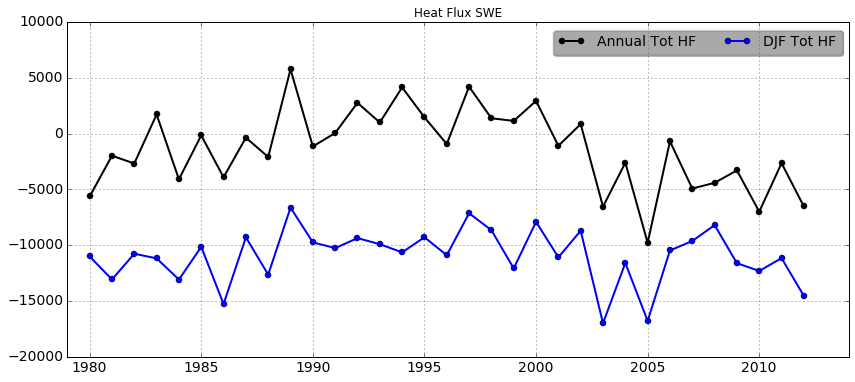

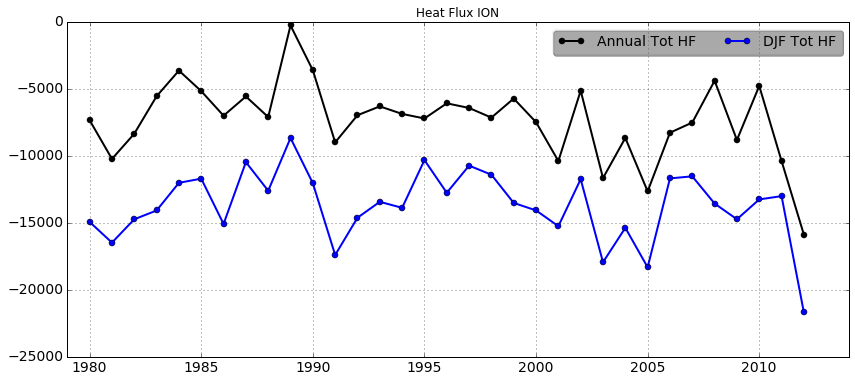

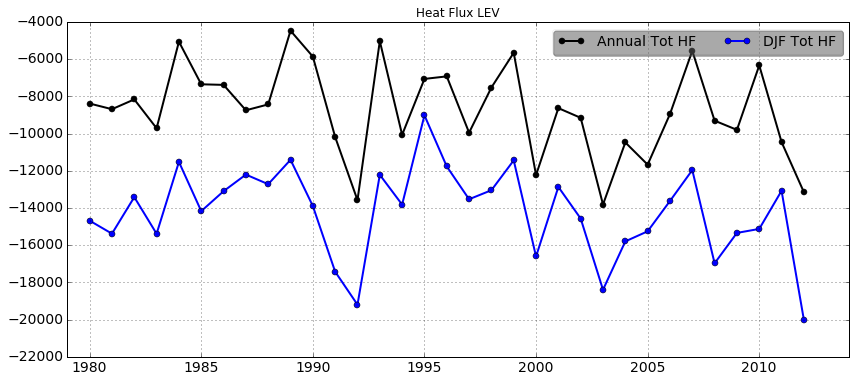

In [60]:
# Keeping only winter values
for basin in region_list:
    vars()['hf3_'+basin] = vars()['hf2_'+basin].loc[(vars()['hf2_'+basin]['mm']==1)|(vars()['hf2_'+basin]['mm']==2)|(vars()['hf2_'+basin]['mm']==12)]

# annual heat flux
year_list = np.arange(1980,2013)

for basin in region_list:
    count = 0
    test2 = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['heat_flux_'+basin].groupby('yy')['total_hf'].sum()[y]
        test2[count] =  vars()['hf3_'+basin].groupby('yy')['total_hf'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ok', linewidth = 2, label='Annual Tot HF')
    plt.plot(year_list, test2, '-ob', linewidth = 2, label='DJF Tot HF')
    eval('plt.title(\'Heat Flux '+basin+'\')')
    plt.xlim([1979,2014])
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    plt.grid(True)
    #ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.YearLocator(interval=1))
    #plt.gcf().autofmt_xdate()
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_Winter_HF_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [ ]:
### END OF THIS PART ###

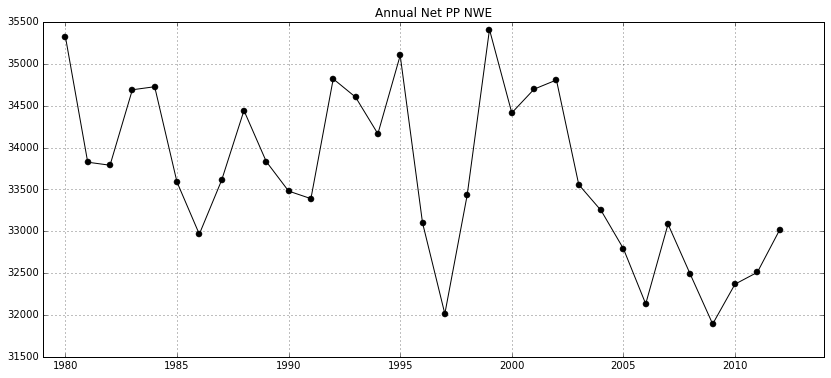

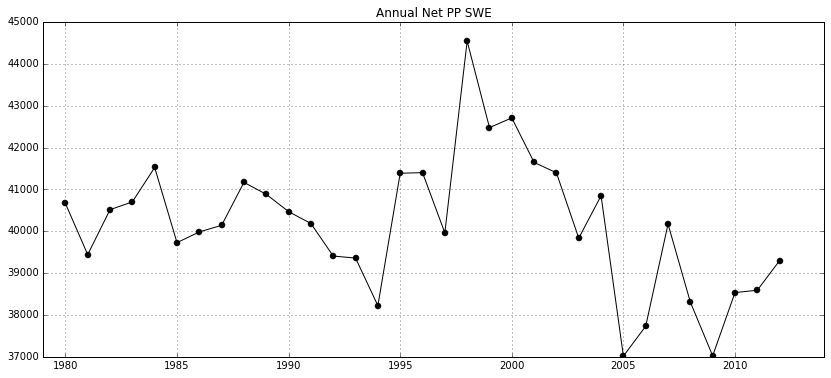

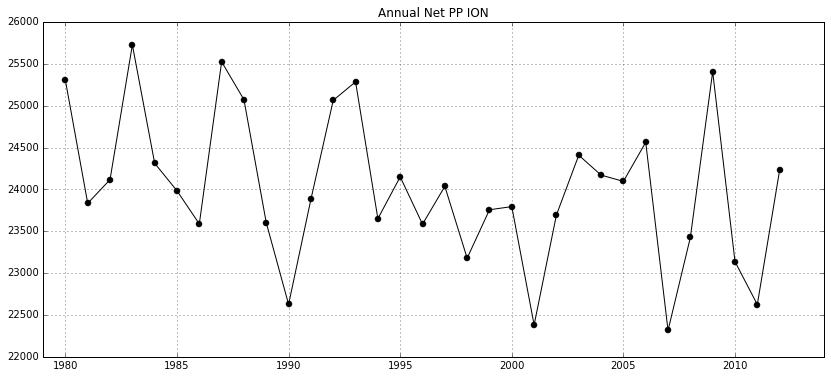

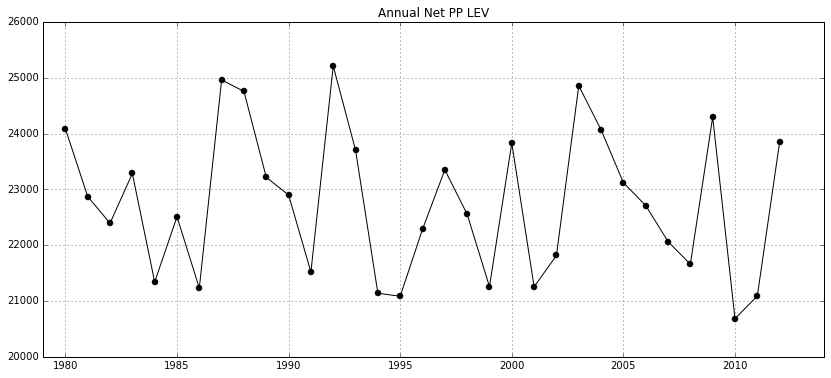

In [67]:
### BELOW: ANNUAL SUM, MIN and MAX of NetPP, GrossPP, Nut and OC EXPORTS ###
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['netppb_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ok')
    plt.grid(True)
    eval('plt.title(\'Annual Net PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Net_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

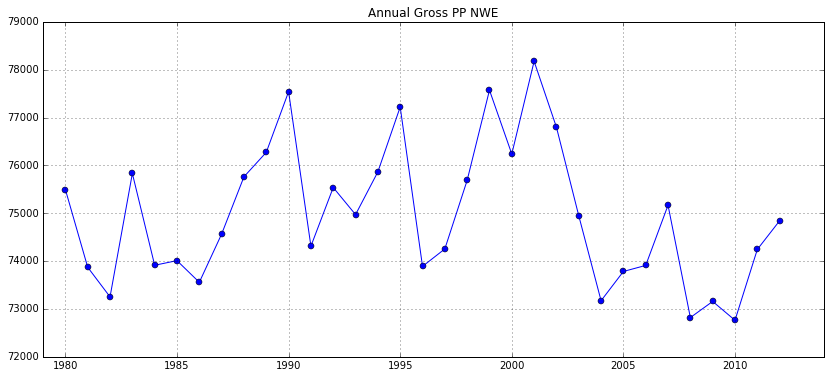

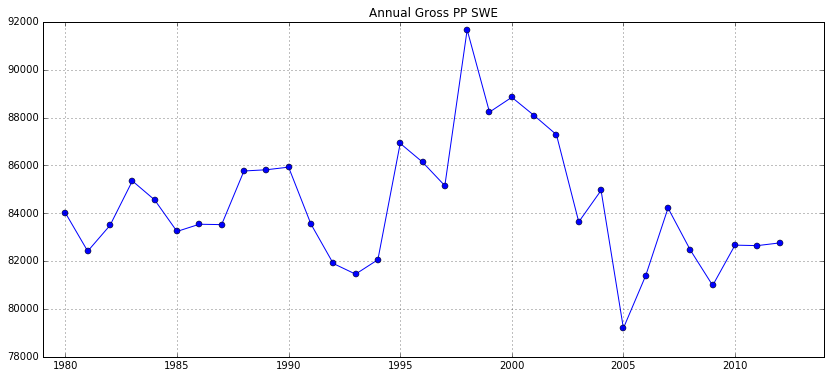

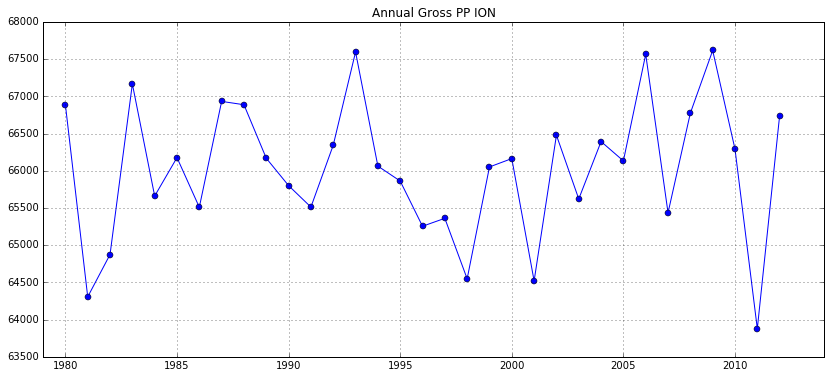

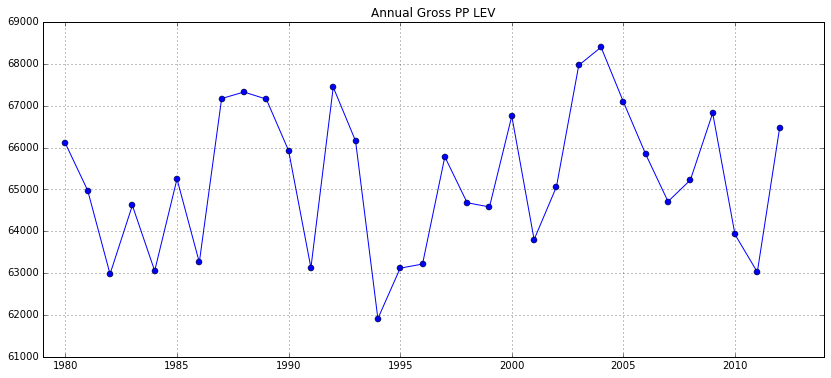

In [7]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['ppb_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ob')
    plt.grid(True)
    eval('plt.title(\'Annual Gross PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Gross_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

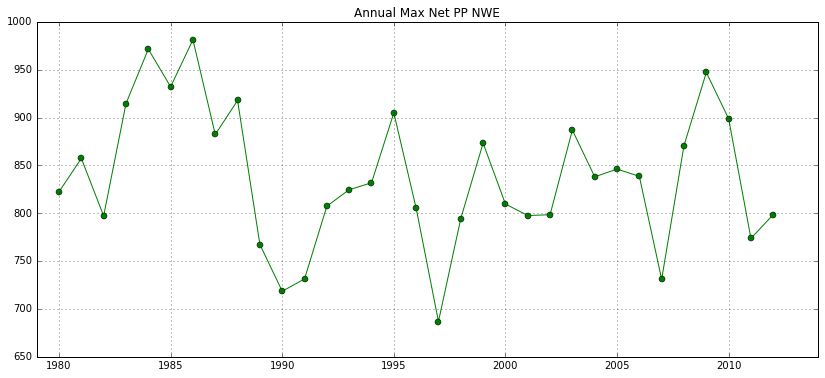

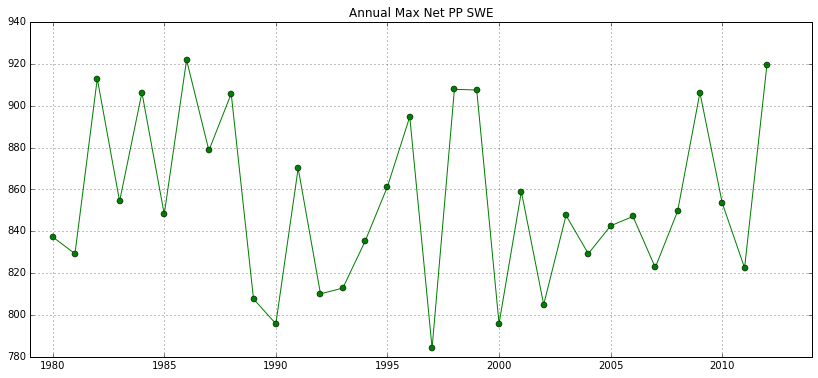

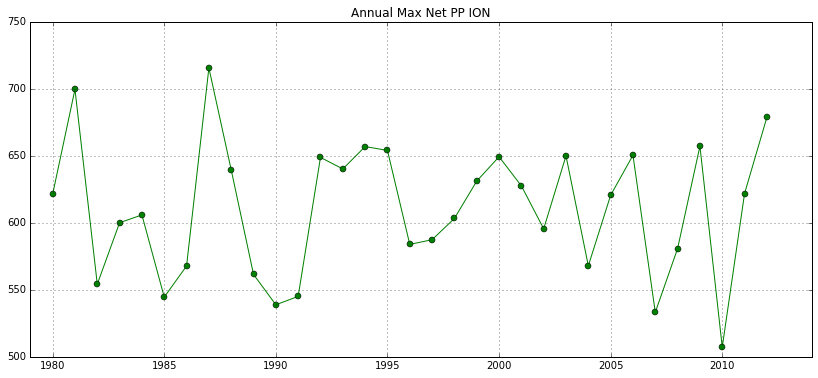

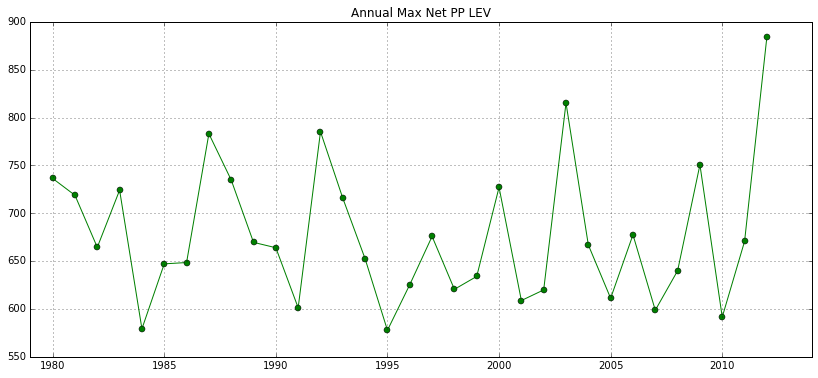

In [70]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['netppb_2D_'+basin].groupby('yy')['var'].max()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-og')
    plt.grid(True)
    eval('plt.title(\'Annual Max Net PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Max_Net_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

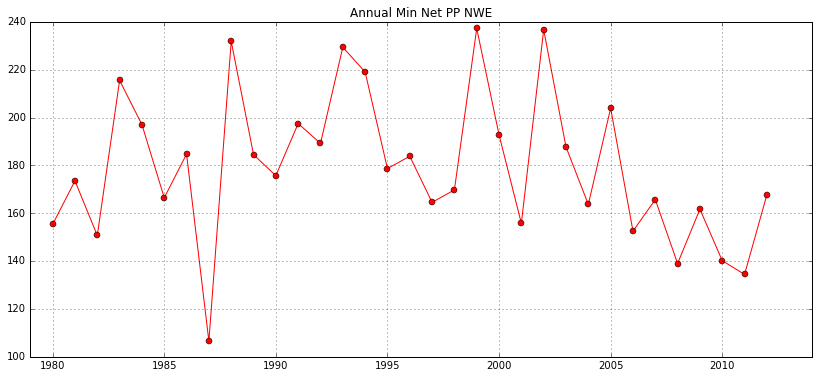

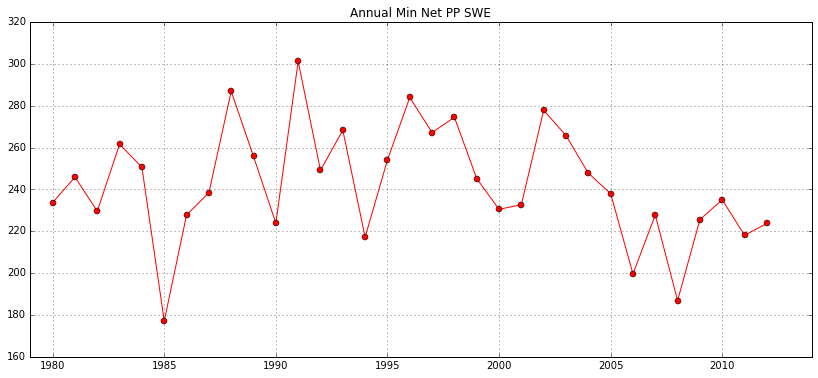

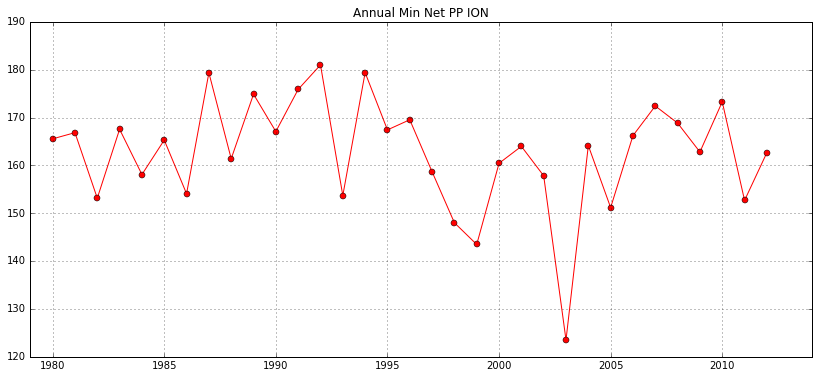

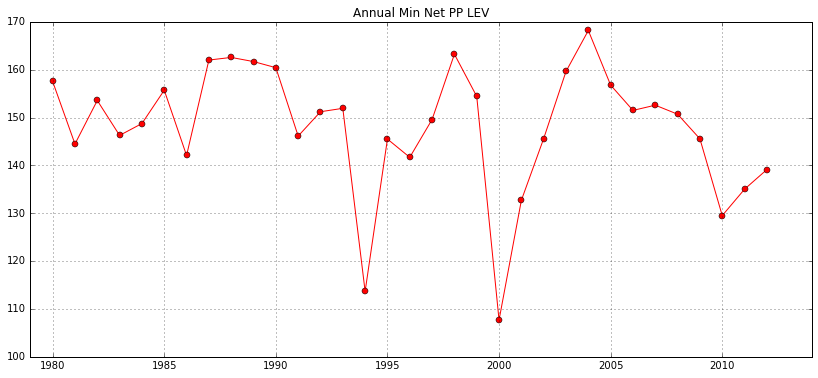

In [73]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['netppb_2D_'+basin].groupby('yy')['var'].min()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or')
    plt.grid(True)
    eval('plt.title(\'Annual Min Net PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Min_Net_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

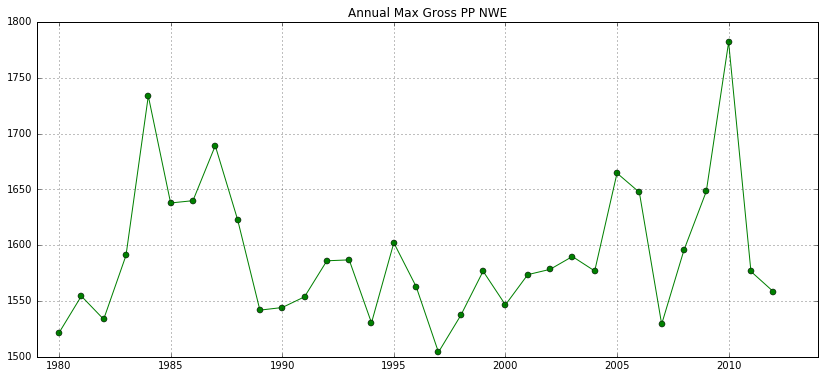

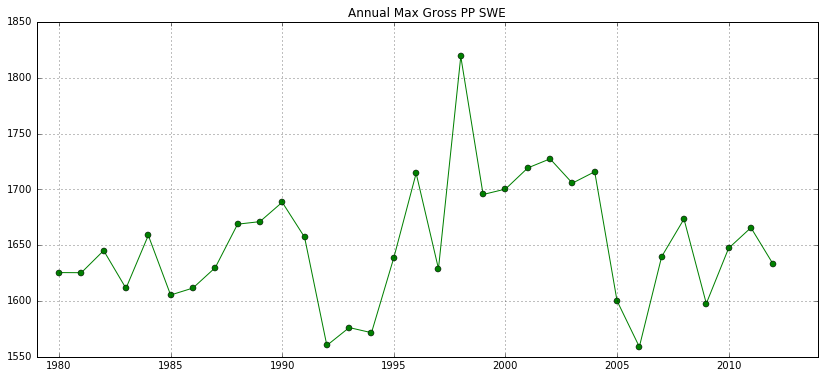

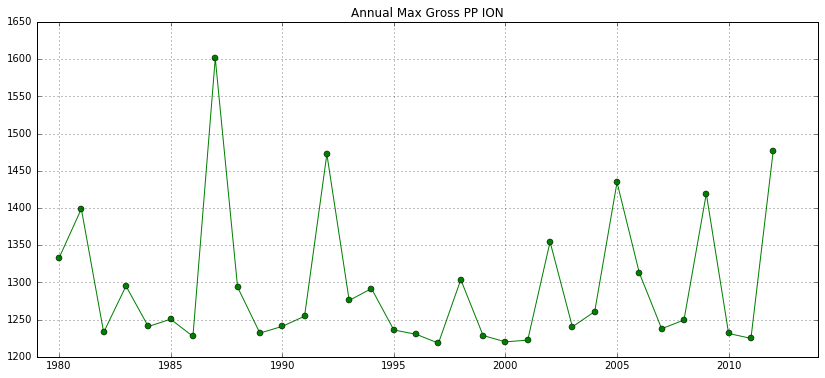

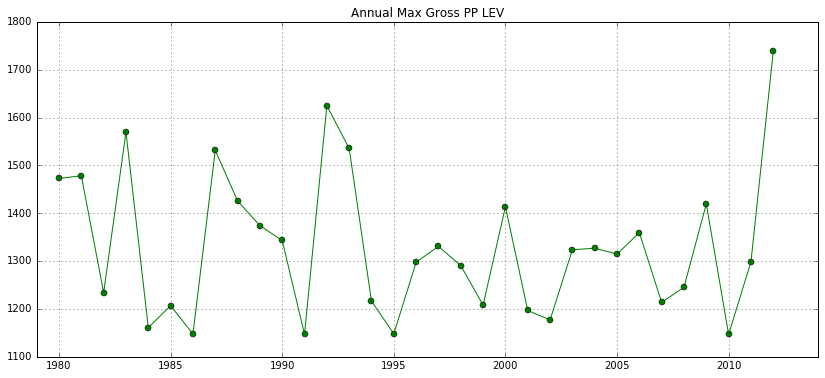

In [8]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['ppb_2D_'+basin].groupby('yy')['var'].max()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-og')
    plt.grid(True)
    eval('plt.title(\'Annual Max Gross PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Max_Gross_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

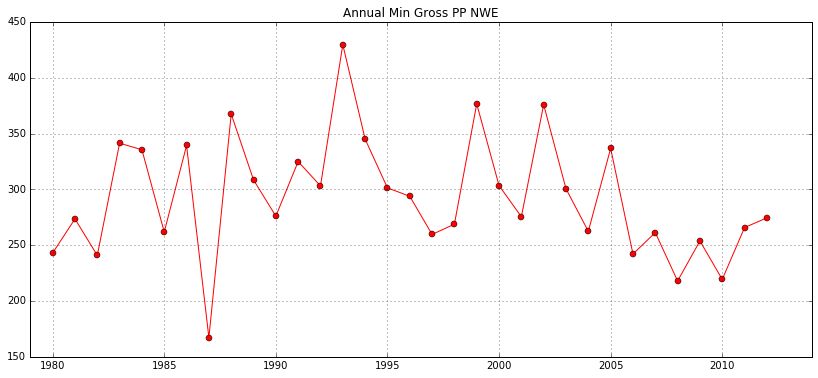

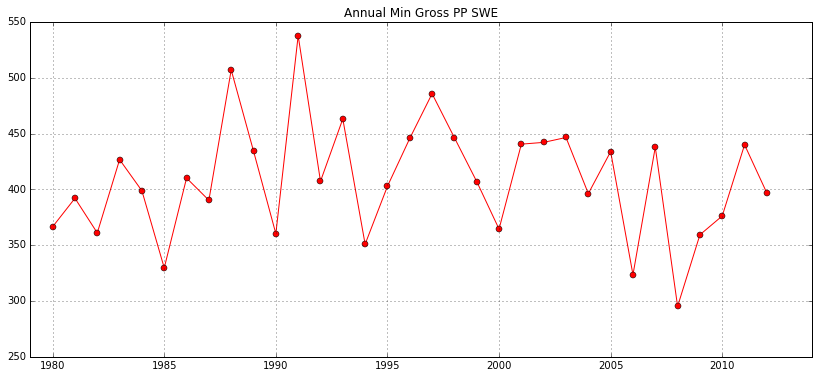

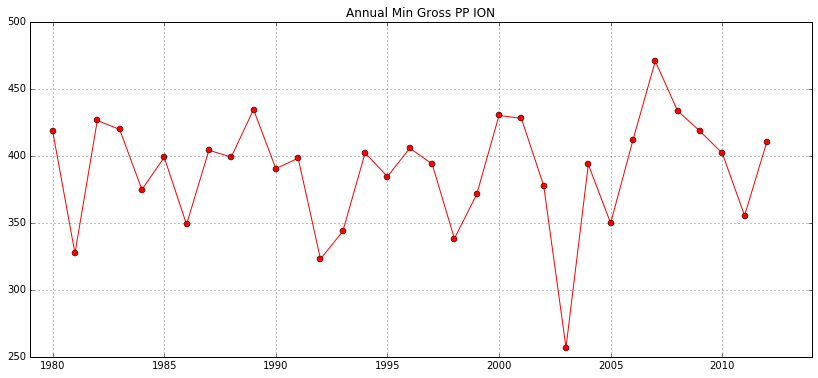

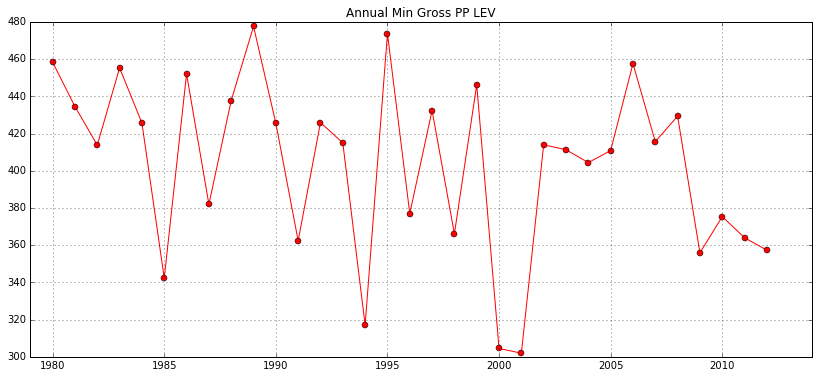

In [9]:
# max annuel de netpp
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['ppb_2D_'+basin].groupby('yy')['var'].min()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or')
    plt.grid(True)
    eval('plt.title(\'Annual Min Gross PP '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_Min_Gross_PP_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

In [77]:
nut_list

['ppb',
 'netppb',
 'chl_tot',
 'export_nit_sw',
 'export_pho_sw',
 'export_doc200',
 'export_poc200']

In [ ]:
# Exports OC annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_doc200_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export DOC '+basin+'\')')
    plt.xlim([1979,2014])
    #eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_DOC_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

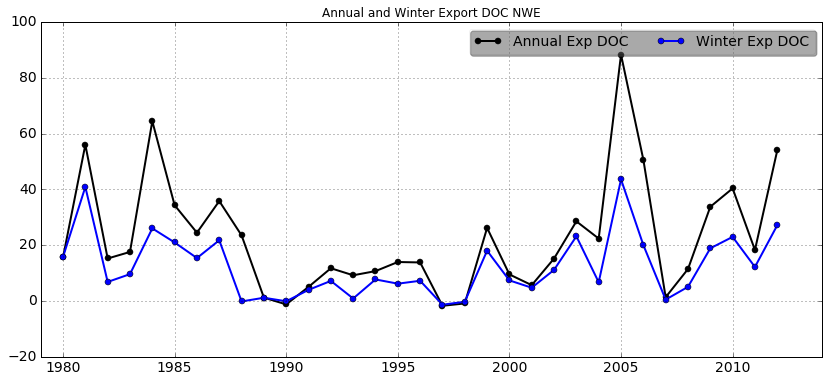

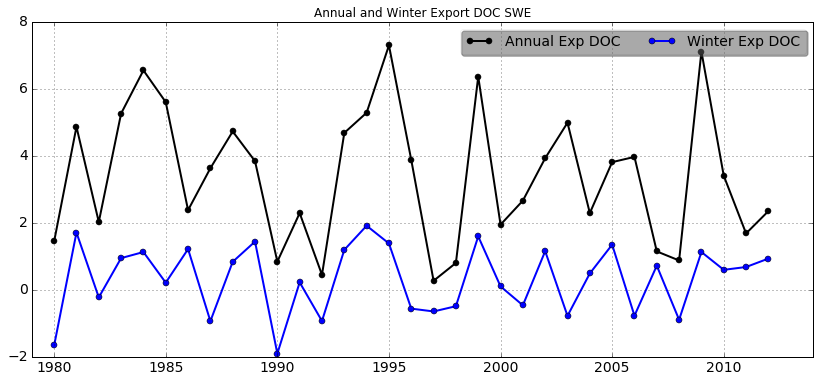

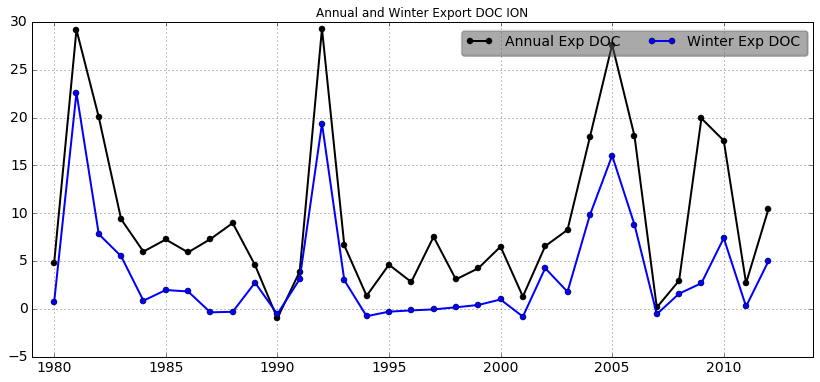

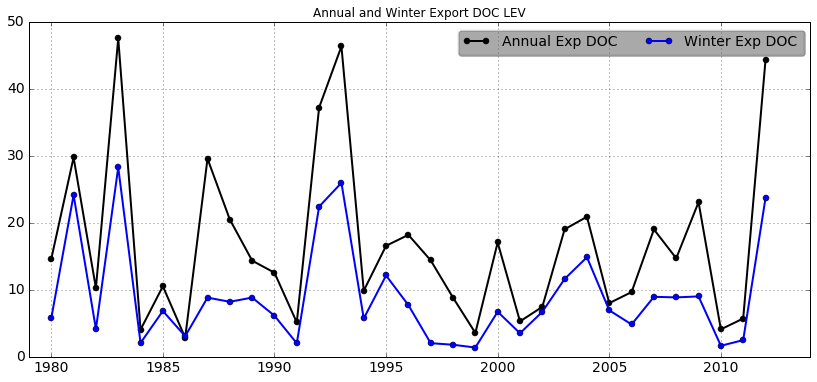

In [69]:
# annual heat flux
year_list = np.arange(1980,2013)

for basin in region_list:
    vars()['export_doc200_2D_2_'+basin] = vars()['export_doc200_2D_'+basin]
    vars()['export_doc200_2D_2_'+basin]['mm'] = pd.DatetimeIndex(vars()['export_doc200_2D_2_'+basin]['date']).month
    vars()['export_doc200_2D_2_'+basin] =  vars()['export_doc200_2D_2_'+basin].loc[(vars()['export_doc200_2D_2_'+basin]['mm']==1)|\
                                                                                   (vars()['export_doc200_2D_2_'+basin]['mm']==2)|\
                                                                                   (vars()['export_doc200_2D_2_'+basin]['mm']==12)]
        
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_doc200_2D_'+basin].groupby('yy')['var'].sum()[y]
        test2[count] =  vars()['export_doc200_2D_2_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ok', linewidth=2, label='Annual Exp DOC')
    plt.plot(year_list, test2, '-ob', linewidth=2, label='Winter Exp DOC')
    eval('plt.title(\'Annual and Winter Export DOC '+basin+'\')')
    
    plt.xlim([1979,2014])
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    plt.grid(True)
    #ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.YearLocator(interval=1))
    #plt.gcf().autofmt_xdate()
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/LAST_FIGS/Annual_Winter_ExpDOC_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

NWE
1
SWE
2
ION
3
LEV
4


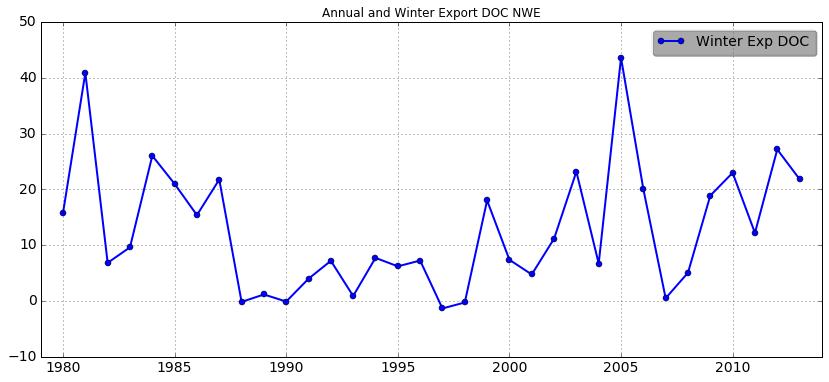

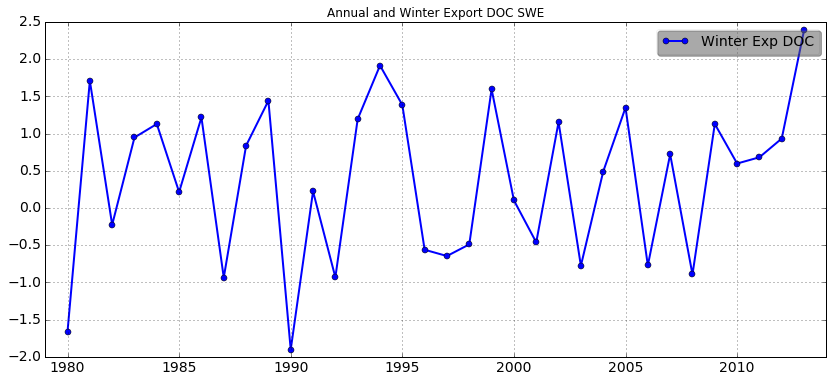

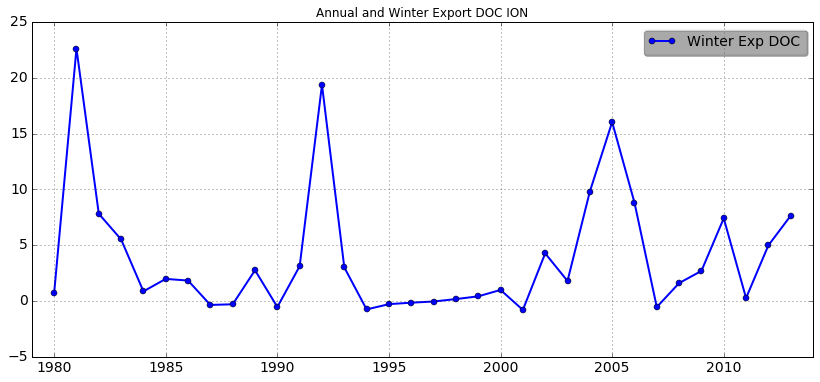

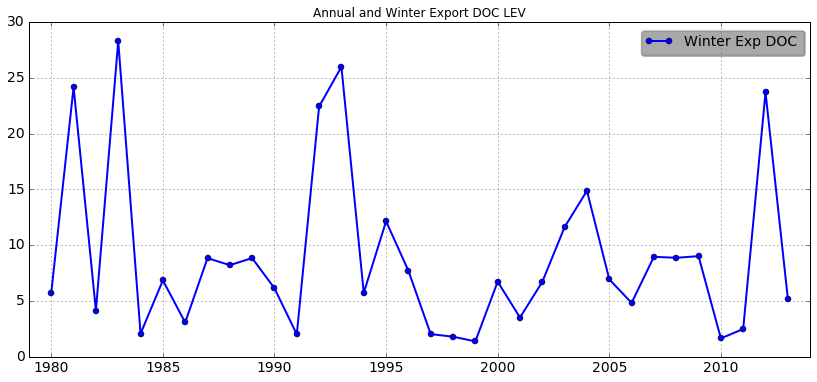

In [389]:
# Export OC
year_list = np.arange(1980,2014)

basin_count = 1
for basin in region_list:
    print basin
    print basin_count
    vars()['export_doc200_2D_2_'+basin] = vars()['export_doc200_2D_'+basin]
    vars()['export_doc200_2D_2_'+basin]['mm'] = pd.DatetimeIndex(vars()['export_doc200_2D_2_'+basin]['date']).month
    vars()['export_doc200_2D_2_'+basin] =  vars()['export_doc200_2D_2_'+basin].loc[(vars()['export_doc200_2D_2_'+basin]['mm']==1)|\
                                                                                   (vars()['export_doc200_2D_2_'+basin]['mm']==2)|\
                                                                                   (vars()['export_doc200_2D_2_'+basin]['mm']==12)]

    count = 0
    vars()['test_'+basin] = np.zeros([34])
    
    for y in year_list:
        vars()['test_'+basin][count] =  vars()['export_doc200_2D_2_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, vars()['test_'+basin], '-ob', linewidth=2, label='Winter Exp DOC')
    eval('plt.title(\'Annual and Winter Export DOC '+basin+'\')')
    
    plt.xlim([1979,2015])
    plt.yticks(fontsize=14)
    plt.xticks(fontsize=14)
    leg = plt.legend(loc='upper right', ncol=2, shadow=True, fancybox=True, fontsize=14) #mode="expand", shadow=True,
    leg.get_frame().set_alpha(0.05)
    plt.grid(True)
    #ax = plt.gca()
    #ax.xaxis.set_major_locator(mdates.YearLocator(interval=1))
    #plt.gcf().autofmt_xdate()
    plt.xlim([1979,2014])

    basin_count += 1

In [ ]:
### SAVE INTO TXT FILE ### (to compute correlations in Matlab)

In [427]:
testt = np.vstack([test_NWE,test_SWE,test_ION,test_LEV])
np.shape(testt) # (4, 34)

export_doc_txt = testt.transpose()
export_doc_txt

# FINALLY
np.savetxt('export_doc_txt',export_doc_txt,delimiter=' ')  # => YES!

(4, 34)

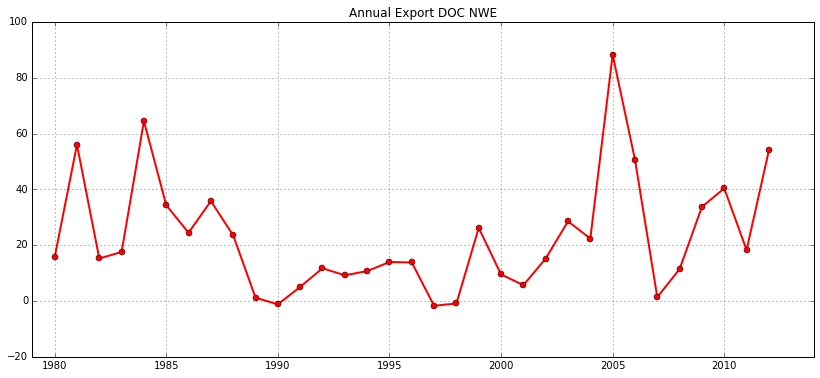

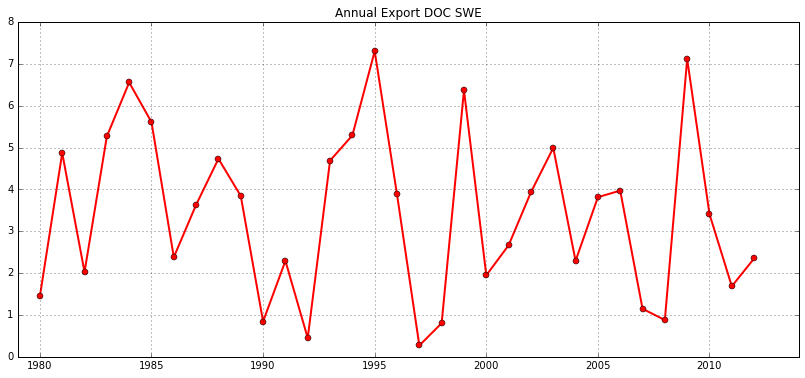

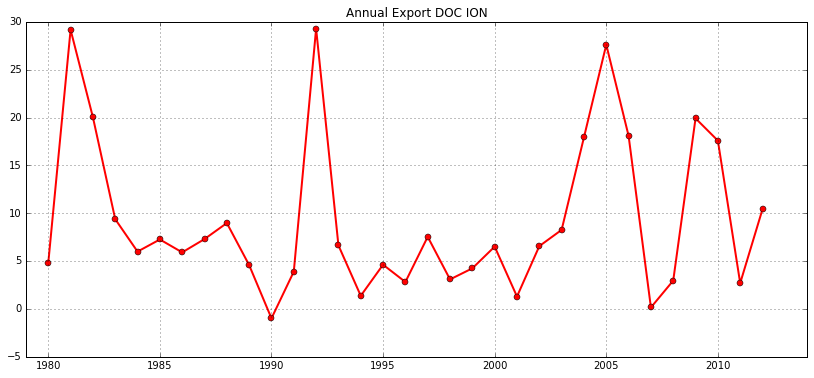

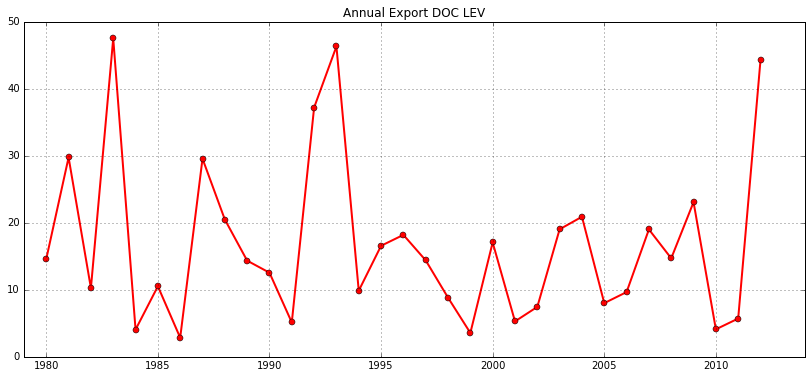

In [80]:
# Exports OC annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_doc200_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export DOC '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_DOC_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

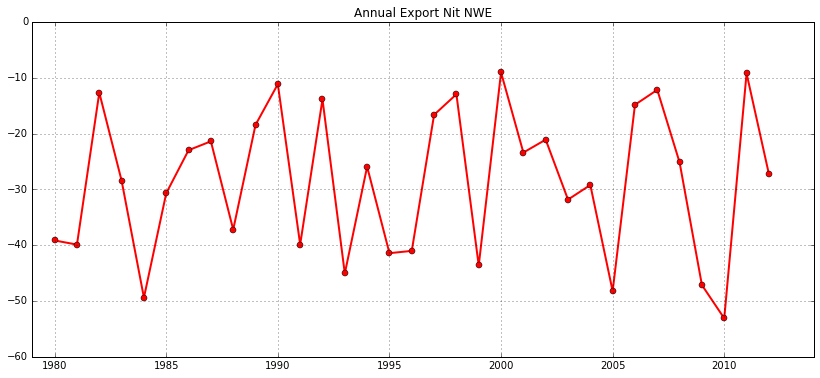

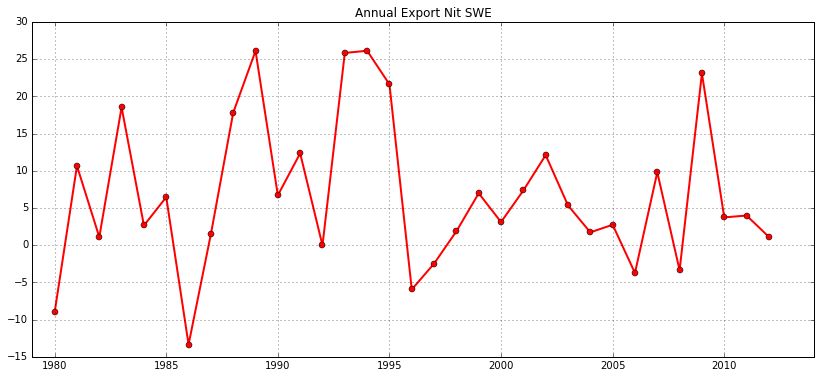

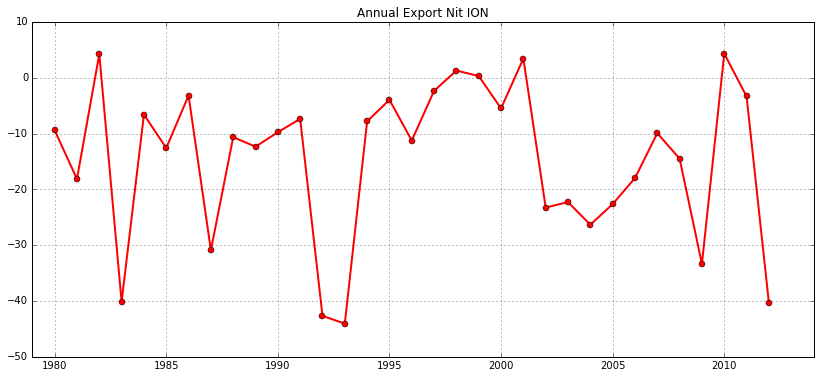

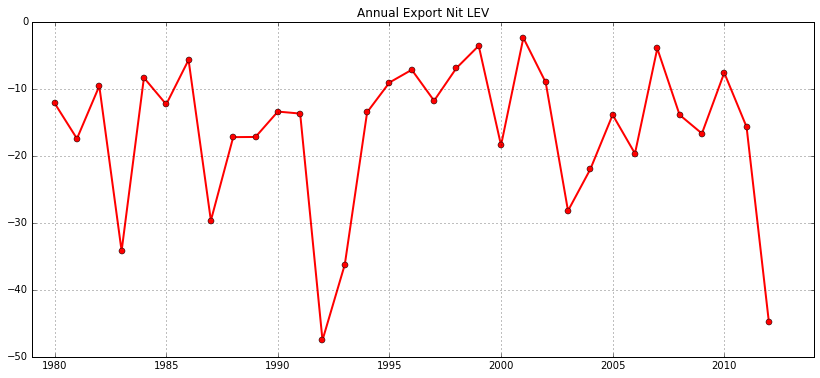

In [86]:
# Exports nut annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_nit_sw_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-or', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export Nit '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_Nit_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

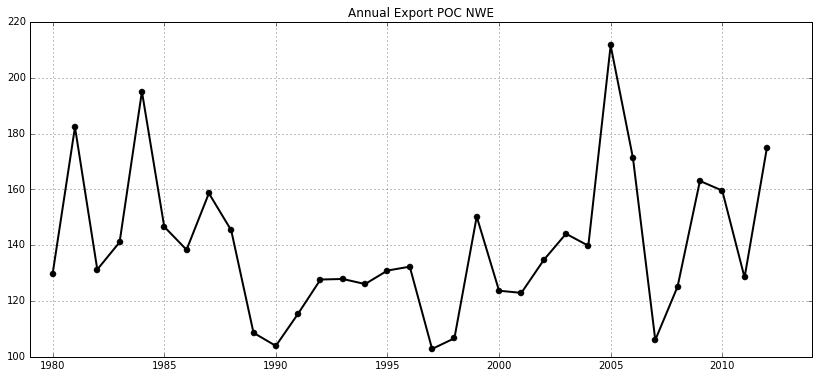

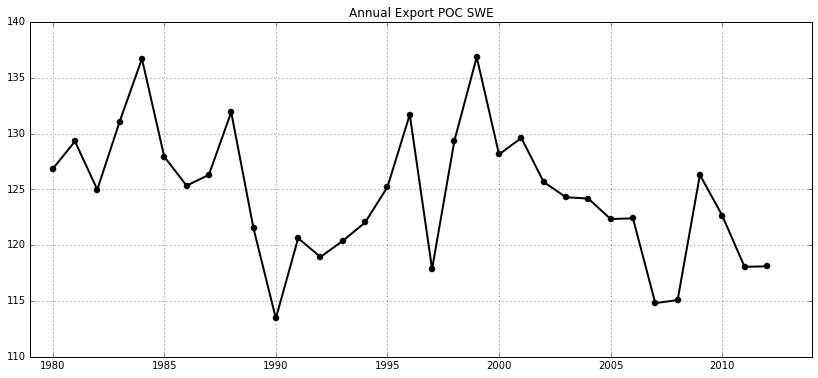

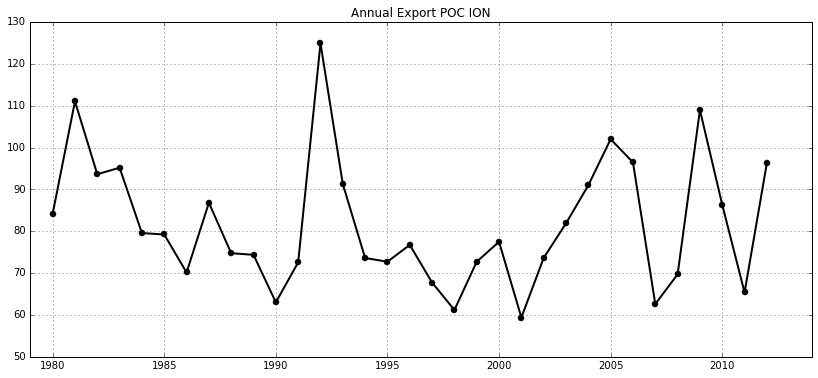

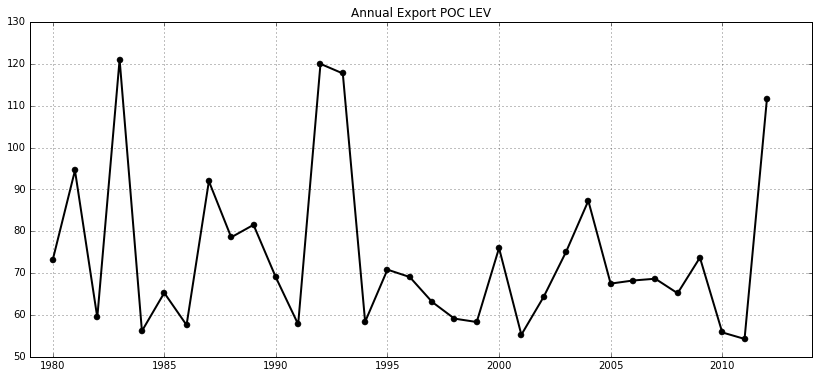

In [82]:
# Exports OC annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_poc200_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ok', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export POC '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_POC_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')

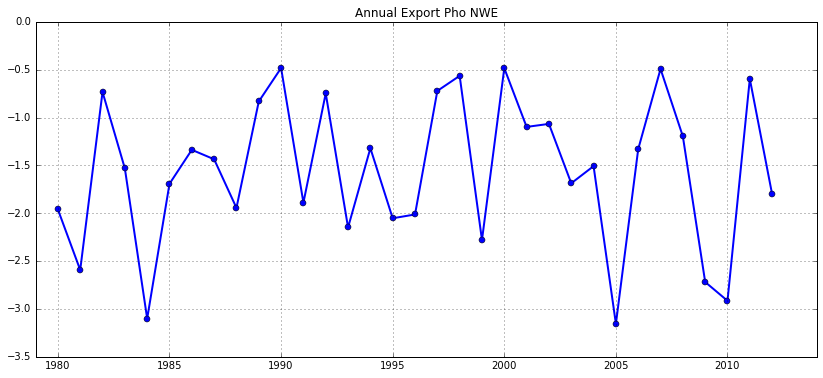

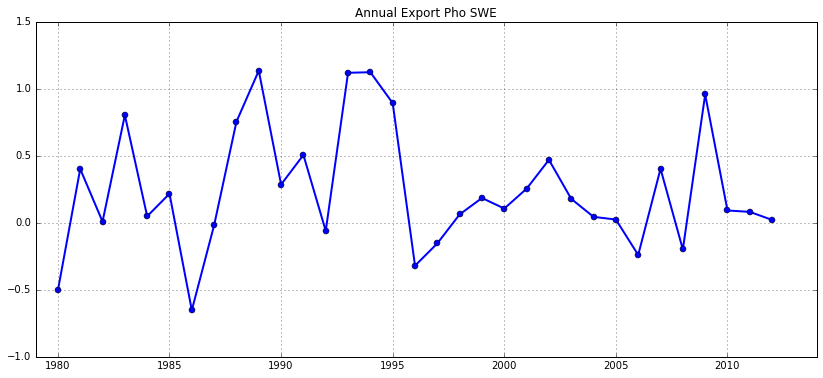

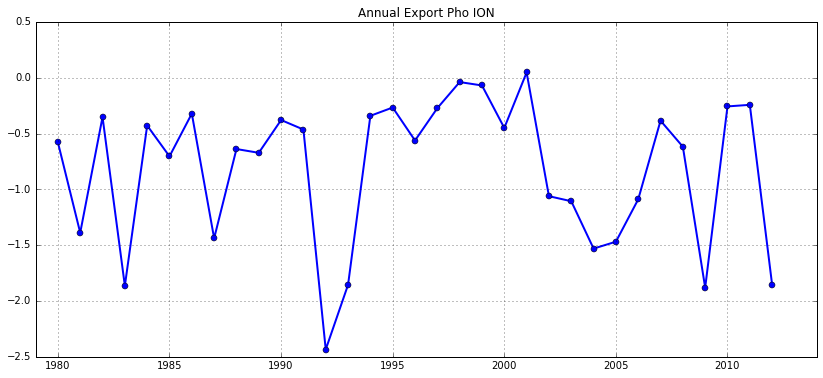

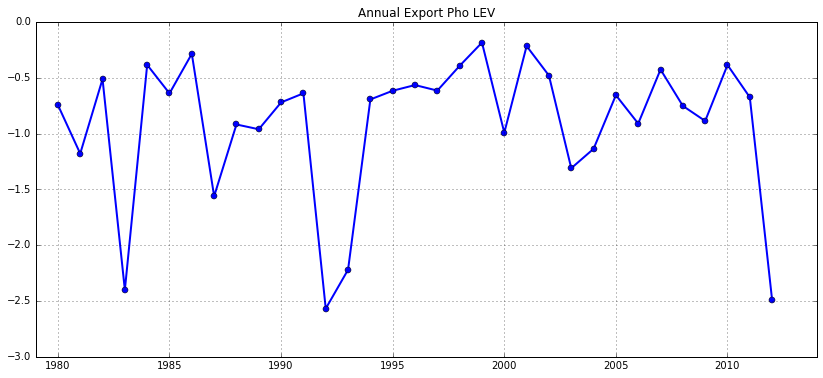

In [85]:
# Exports nut annuels
year_list = np.arange(1980,2013)

for basin in basin_list:
    count = 0
    test = np.zeros([33])
    for y in year_list:
        test[count] =  vars()['export_pho_sw_2D_'+basin].groupby('yy')['var'].sum()[y]
        count += 1
        
    # figure
    plt.figure(figsize=(14,6))
    plt.plot(year_list, test, '-ob', linewidth=2)
    plt.grid(True)
    eval('plt.title(\'Annual Export Pho '+basin+'\')')
    plt.xlim([1979,2014])
    eval('plt.savefig(\'/home/dosa/THESE/CR_reunions/MAY_FIGS/CR_21.05.2018/Annual_export_Pho_'+basin+'.png\',bbox_inches=\'tight\',format=\'png\')')